# Hunting AI Agents: A Sentinel Data Lake Investigation Notebook

Microsoft Sentinel data lake notebook for Agent 365 inventory, governance, reliability, security triage, and investigation.

## Capability summary

This notebook provides a **role-based analytical foundation** for an Agent 365 security workbook. It reads Agent 365 and Entra System tables, normalizes preview-schema differences, limits large outputs, and keeps sensitive prompt or response content hidden unless explicitly enabled.

| Audience | Current capability | Brief explanation |
| --- | --- | --- |
| CISO / AI governance | Estate and posture summary | Counts identities, blueprints, Agent Users, active telemetry agents, high-risk findings, stale identities, and identities missing from inventory or telemetry. |
| AI Agent / Entra administrator | Inventory and identity reconciliation | Correlates `EntraAgentIdentities` with blueprints and recent activity; highlights disabled identities/users and governance mismatches. |
| Observability / SRE | Health, performance, and instrumentation quality | Reports daily events, conversations, active agents, errors, error rate, operation mix, latency percentiles, and missing correlation identifiers. |
| SOC analyst | Transparent detection heuristics | Surfaces error bursts, off-hours execution, actor fan-out, agent-to-agent fan-in, suspicious serialized text, newly observed agents, and disabled-identity activity. |
| Investigator | Agent and conversation timeline | Produces a bounded event timeline for a selected agent, including operations, actors, agent relationships, status, latency, and conversation identifiers. |
| Detection engineering | Explainable findings output | Builds a component-based risk score and can optionally write compact findings to `Agent365RiskFindings_SPRK`; raw prompt/output content is not persisted. |

### Current analytical flow

`System-table health -> schema normalization -> inventory/governance -> activity and SRE -> SOC heuristics -> anomaly/risk scoring -> focused timeline -> optional findings output`

> **Important:** This file is a Jupyter notebook and analytical prototype, not yet the final multi-page Microsoft Sentinel workbook. Its outputs and scoring logic can drive workbook tiles after source schemas, ownership data, and enrichment joins are validated in the target tenant.

**Interpretation boundary:** Agent telemetry describes behavior; it does not establish malicious intent. Detection outputs are triage leads requiring analyst validation. Prompt, response, and tool content can contain sensitive data and is hidden by default.

## Prerequisites

- Microsoft Sentinel data lake onboarding and permission to read **System tables**.
- VS Code with the Microsoft Sentinel extension signed in to the correct tenant.
- Select a **Microsoft Sentinel** runtime pool; Medium is a practical starting point. Do not install packages: the notebook uses only runtime-provided PySpark and matplotlib.
- Agent instrumentation should emit a root `invoke_agent` span and propagate `gen_ai.conversation.id` for complete correlation.

## Gap assessment against the target workbook

Legend: **Covered** = implemented now; **Partial** = useful proxy exists but lacks authoritative fields or enrichment; **Gap** = source/join/visualization is not implemented.

### 01 - Executive Agent Security Overview

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Total and active agents | Covered | Counts inventory identities and agents observed during the selected lookback. Agree a canonical definition of "active" before publishing an executive KPI. |
| New agents, 7/30 days | Partial | The notebook finds agents first observed in telemetry, which can include reactivated agents. Add authoritative identity `createdDateTime` and separate 7-day and 30-day measures. |
| No recent activity / observability coverage | Partial | Inventory-without-telemetry is shown. Add explicit instrumentation/connector state so "not observed" is not incorrectly equated with "not instrumented." |
| Platform and identity type | Partial | Event vendor/product and source/target agent types are summarized. Normalize these into stable platform and identity-type dimensions. |
| Owner and business unit | Gap | No authoritative owner, sponsor, department, or business-unit source is joined. Add registry/CMDB/Entra ownership enrichment and flag missing owners. |
| Runs, users, agent-to-agent activity, failures, error rate, duration | Partial | Conversations, actors, interactions, errors, rates, and duration percentiles exist. Define a canonical run from root `invoke_agent`; add an explicit average duration KPI. |
| Tool, MCP, and inference calls | Partial | Operation distribution exists, but operation/action normalization is incomplete. Map `invoke_agent`, `execute_tool`, `chat`, `output_messages` and `InvokeAgent`, `InferenceCall`, `ExecuteToolBySDK`, `ExecuteToolByGateway`, `ExecuteToolByMCPServer`. |
| Excessive permissions / privileged actions | Gap | Requires blueprint principal, Entra role, Graph permission, OAuth scope, workload identity, and privileged-operation enrichment. Current principal data is counted but not evaluated. |
| Sensitive data access | Gap | Requires `CloudAppEvents` or another authoritative data-access/sensitivity source plus labels, resources, and action context. Text indicators are not a substitute. |
| Security alerts and risky identities | Gap | Join Defender incidents/alerts and Entra risk/sign-in telemetry to agent, Agent User, owner, caller, and workload identity identifiers. |
| Anomalous behavior | Covered | Per-agent daily z-score volume anomalies and transparent behavioral heuristics are available, subject to baseline and threshold tuning. |
| Agent Security Posture Score | Partial | The current score covers errors, off-hours, fan-out, suspicious text, and disabled identity activity. It is a triage score, not the proposed posture score across Identity + Ownership + Observability + Activity + Permissions + Threat detections + Data access. |
| Executive landing experience | Gap | Build a Sentinel workbook page with KPI tiles, trends, filters, drill-through links, data freshness, coverage denominator, and score explanation. |

### 02 - Agent Inventory and Identity

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Agent ID, name, blueprint, status, last activity, volume | Covered | Identity inventory is joined to blueprint name and recent telemetry. Preview column selection remains defensive. |
| Agent User relationship | Gap | `EntraAgentUsers` is checked for disabled users but not joined to each agent. Confirm tenant keys and create the Agent -> Agent User relationship. |
| Blueprint principal relationship | Gap | `EntraAgentIdentityBlueprintPrincipals` is counted but not resolved into permissions, roles, resources, or owning principals. |
| Platform | Partial | Derived only from telemetry vendor/product/type. Add authoritative platform from registry/catalog data and normalize Copilot, Foundry, and third-party values. |
| Owner and business unit | Gap | Add accountable owner, technical owner, sponsor, department, and business unit from the Agent 365 registry, Entra, CMDB, or a governed watchlist. |
| Created date and lifecycle state | Gap | Add created/modified/disabled/deleted dates and approved lifecycle states to distinguish new, stale, inactive, orphaned, and decommissioned agents. |
| Risk classification | Partial | Behavioral risk score exists, but classification lacks permissions, data access, threat alerts, owner, and sensitivity context. |
| Agent -> Blueprint -> Agent User -> Owner -> Activity visualization | Gap | Build a graph or relational drill-through after validating join keys. Surface broken or many-to-many relationships rather than silently dropping them. |
| Entra/Sentinel identity correlation | Gap | Add sign-ins, service-principal activity, Conditional Access, risky users/service principals, role assignments, consent grants, and authentication failures where available. |

### 03 - Agent Activity and Observability

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| `UnifiedAgentObservability` event spine | Covered | The notebook filters early by time, normalizes optional columns, and extracts conversation identifiers defensively. |
| `CloudAppEvents` correlation | Gap | This workspace/federated source is not loaded. Add it with an explicit workspace/database parameter, validate schema first, and join on supported agent, account, session, trace, or correlation identifiers. |
| Canonical run lifecycle | Partial | Events can be ordered by agent/conversation, but no state machine reconstructs User -> invocation -> inference -> tool/MCP/API -> data access -> response. |
| Trace and run identifiers | Partial | Conversation and session IDs are available; `TraceId` and a canonical Run ID are not normalized. Validate whether they exist in `AdditionalFields` or `CloudAppEvents`. |
| Caller and channel | Partial | Actor identity is captured, while channel is not normalized and caller attribution may be incomplete for agent-to-agent or application identities. |
| Tool, MCP/API/connector, and model dimensions | Gap | Parse stable tool name/type/server, MCP server, connector/API, model/provider/deployment, and gateway fields from documented telemetry. |
| Input/output characteristics | Gap | Sensitive content is intentionally hidden. Add privacy-preserving counts, sizes, token metrics, content-safety outcomes, and sensitivity labels rather than exposing raw text by default. |
| Error taxonomy | Partial | Broad status matching supports triage. Add normalized status, error code/category, retry, throttling, timeout, and policy-block dimensions. |
| Cost and token usage | Gap | Add input/output/total tokens and estimated cost only when authoritative usage fields and a governed pricing reference are available. |
| Data quality and freshness | Partial | Missing IDs and table availability are checked. Add ingestion lag, last-seen timestamp, schema-version drift, duplicate rate, expected-vs-observed volume, and connector health. |
| Run drill-through | Partial | A bounded agent timeline exists. Add selection by `TraceId`, `ConversationId`, `SessionId`, and Run ID with lifecycle duration, status, tool/model details, and links to Defender investigation surfaces. |

### Prioritized implementation gaps

1. **Define the semantic contract:** canonical agent, active agent, run, tool execution, MCP execution, inference call, failure, and observability coverage.
2. **Validate join keys and schemas:** especially Agent -> Blueprint -> Agent User -> Owner, plus `UnifiedAgentObservability` -> `CloudAppEvents`.
3. **Add authoritative governance enrichment:** owner, business unit, lifecycle, platform, permissions, roles, consent, and observability configuration.
4. **Build run-lifecycle normalization:** map OTel operations and Defender action names into stable run stages and derive run-level KPIs.
5. **Add security enrichment:** Defender alerts/incidents, Entra risk and sign-ins, privileged actions, and sensitive-data access.
6. **Separate scores:** retain the transparent behavioral triage score and create a distinct, explainable Agent Security Posture Score with coverage-aware component weights.
7. **Build the Sentinel workbook UX:** executive landing page, inventory/identity page, activity/observability page, global filters, freshness indicators, and drill-through.
8. **Operationalize compact outputs:** schedule the notebook or KQL jobs, persist only governed summaries, and promote the minimum fields required for Analytics-tier rules.

## Gap assessment - extended detection, hunting, and SRE pages

This continues the assessment for the deeper security, tooling, data, and reliability pages. Same legend: **Covered**, **Partial**, **Gap**.

### 04 - SOC analyst: AI agent threat hunting

| Scenario | Coverage | Gap / required next step |
| --- | --- | --- |
| Abnormal activity - volume spike | Covered | Per-agent daily z-score exists. Add per-agent rolling baseline (mean/stddev over trailing window) rather than whole-lookback stats. |
| Abnormal activity - first-time tool | Gap | No tool dimension is parsed yet, so "new tool never used before" cannot be computed. Requires normalized tool name + per-agent tool history. |
| Abnormal activity - new user on sensitive agent | Partial | Actor fan-out exists, but "first-time actor for this agent" and agent sensitivity classification are missing. |
| Abnormal activity - off-hours / new workload / geo | Partial (16b) | Off-hours covered; geo now from `SigninLogs` `Location` (impossible-travel proxy in 16b). Workload dimension still missing. |
| Scenario 2 - agent identity compromise chain | Partial (16b) | `SigninLogs` risky/failed sign-ins, `AADRiskyUsers`, and `IdentityInfo` are now joined to agent actors (risky auth -> agent identity -> invocation). Linking to the specific sensitive tool still needs the tool dimension. |
| Scenario 3 - privilege escalation | Covered (16c) | `AuditLogs` consent grants, delegated-permission grants, app-role assignments, credential/secret changes, and `ConfirmAgentCompromised` are parsed and flagged when they target an agent identity. |
| MITRE mapping | Partial (16d) | Correlated `SecurityAlert` rows contribute real ATT&CK `Tactics`/`Techniques`; native notebook heuristics are still untagged. |

### 05 - Tool and MCP security

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Tool inventory and call counts | Gap | Tool name/type is not extracted from `AdditionalFields`/operation. This is the single biggest missing dimension for pages 04, 05, 08, and 12. |
| MCP server / MCP tool calls | Gap | Distinguish `ExecuteToolByMCPServer` vs `ExecuteToolBySDK` vs `ExecuteToolByGateway`; parse MCP server identity/endpoint. |
| Tools per agent, new tools, unused tools | Gap | Depends on a tool dimension plus a per-agent tool-usage history baseline. |
| High-risk / external / privileged tools | Gap | Requires a governed tool-risk classification (watchlist) mapping tool -> sensitivity/privilege. |
| Failed tool calls | Partial | Generic error detection exists but is not scoped to tool-execution operations. Add tool-scoped success/failure. |
| Agent x Tool x Data risk matrix | Gap | Needs tool dimension + data-sensitivity join; build as an aggregated matrix, not raw rows. |

### 06 - Agent-to-agent security

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Edge list (A calls B) | Covered | Source/target agent interaction edge list and target fan-in exist. |
| Relationship graph visualization | Partial | Only a flat edge table today. Add a multi-hop graph (consider the Sentinel graph builder) Agent -> Agent -> MCP -> resource. |
| New/unexpected relationship | Gap | Requires a baseline of known agent-to-agent edges to flag first-seen edges. |
| Chain depth / excessive chaining | Gap | No traversal computes chain length or depth per conversation/trace. |
| Circular agent calls | Gap | No cycle detection over the edge list. |
| Privileged agent called by untrusted agent | Gap | Requires agent trust/privilege classification joined to edges. |
| "Lateral movement for agents" framing | Gap | Combine new-edge + depth + privilege + fan-in into a delegation-abuse score. |

### 07 - Data access and sensitive information

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Data source dimension (SharePoint/OneDrive/Teams/Exchange/Graph/API/MCP) | Partial (16e) | Derived from `CloudAppEvents` `Application`/`ObjectType` data-access actions joined to agent actors; Purview labels still absent. |
| Sensitive data access events | Gap | Requires Purview sensitivity labels / DLP signals joined to agent activity. Text heuristics are not an authoritative substitute. |
| User -> agent -> sensitive data chain | Partial (16e) | Actor -> agent -> data-access chain built from `CloudAppEvents`; sensitivity labels still require Purview. |
| New / high-volume / unusual data access | Partial (16e) | New-data-source-per-actor and per-application volumes from `CloudAppEvents`; peer baselines still to add. |
| Purview DLP / retention / communication compliance linkage | Gap | Document the integration points; these are downstream Purview scenarios, not lake queries in this notebook. |

### 08 - Detection engineering (confidence tiers)

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| High / medium / governance tiering | Partial | The composite score exists but findings are not labeled by confidence tier or intended action (alert vs review vs governance ticket). |
| Detection -> Agent -> User -> Tool -> Data -> Incident lineage | Gap | Findings lack tool, data, and incident joins; add a normalized finding schema with these foreign keys. |
| Alert/incident linkage | Partial (16d) | `SecurityAlert`/`SecurityIncident` are correlated to agent actors/identities; a normalized finding foreign key is still to add. |
| Suppression / allowlist / tuning state | Gap | Add exception lists and per-detection thresholds so governance noise is controllable. |

### 09 - Observability health

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Missing IDs (agent/blueprint/conversation) | Covered | Correlation-quality cell already counts several missing required fields. |
| Root `invoke_agent` presence | Partial | Counted, but not expressed as "runs missing root invocation" per agent. |
| Registered vs generating vs complete telemetry | Partial | Inventory-without-telemetry exists; add the three-stage funnel and the **Observable Agents %** KPI. |
| Missing caller / invalid identity relationships | Gap | Caller completeness and broken Agent->AgentUser->Blueprint relationships are not validated. |
| Telemetry export vs ingestion gaps | Gap | Microsoft notes a `200 OK` export does not prove downstream arrival, and missing identity attributes drop telemetry. Add ingestion-lag/last-seen and expected-vs-observed checks. |
| Schema quality / drift | Partial | Columns are listed; add schema-version drift and required-attribute validation. |

### 10 - Reliability / SRE

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Agent latency P50/P95/P99 | Covered | Per-agent percentiles from start/end times exist. |
| Tool / LLM / MCP latency split | Gap | Requires operation-scoped duration by tool, inference, and MCP stage. |
| Successful vs failed runs, failure rates | Partial | Error rate exists at event level; add run-level success and per-stage failure rates. |
| Timeout / dependency / LLM / MCP error taxonomy | Gap | Requires normalized error codes/categories by dependency type. |
| Availability - degraded / repeated-failure agents | Partial | Error bursts approximate this; add sustained-degradation and repeated-failure detection. |

### 11 - Cost / efficiency

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Inference calls / model usage | Gap | Requires inference-operation parsing and model dimension. |
| Token usage and estimated cost | Gap | Requires authoritative token fields + governed pricing reference; only add if telemetry exposes usage. |
| High-volume / low-value agents | Partial | Volume exists; "value" needs a success/outcome signal to compute an efficiency score. |
| Agent efficiency score | Gap | Combine usage, success, latency, tool calls, errors, and business value once those inputs exist. |

### 12 - Advanced hunting scenarios (pre-built)

| Group | Coverage | Gap / required next step |
| --- | --- | --- |
| Identity hunts (risky auth, impossible travel, spray, new privileged agent, escalation, consent anomaly) | Partial (16b/16c) | Risky auth, impossible-travel proxy, consent and escalation now run against `SigninLogs`/`AADRiskyUsers`/`AuditLogs`; spray and new-privileged-agent still to add. |
| Behavior hunts (spike, odd time, new tool/data/user, deviation) | Partial | Spike/odd-time covered; new tool/data/user and deviation need dimensions + baselines. |
| Tool/MCP hunts (first-time MCP, sensitive tool, spike, fail-then-succeed, privileged tool) | Gap | Depends on the missing tool/MCP dimension. |
| Data hunts (sensitive access, bulk retrieval, new repo, user->agent->data) | Partial (16e) | `CloudAppEvents` supplies data access, new-source, and user->agent->data; bulk-retrieval volume thresholds still to tune. |
| Agent-to-agent hunts (new edge, privileged callee, chain anomaly, cycle, excessive delegation) | Partial | Edge list exists; new-edge/cycle/depth/privilege logic missing. |
| Persistence/governance hunts (new identity/blueprint, permission change, no owner, no telemetry, stale-then-active) | Partial | No-telemetry and stale-then-active are close; new-identity/blueprint/permission-change need `AuditLogs` + created dates. |
| Packaging as reusable hunts | Gap | Provide each as a named, parameterized function/cell with a documented hypothesis, not just ad-hoc output. |

### 13 - Agent investigation timeline (killer feature)

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Single-agent event timeline | Covered | A bounded, ordered timeline for a focus agent exists. |
| Full lifecycle rows (auth -> invoke -> inference -> tool -> MCP -> data -> A2A -> response) | Gap | Needs the run-lifecycle normalization plus tool/data/inference dimensions and identity auth events. |
| Correlation spine User -> Identity -> Agent -> Conversation -> Trace -> Tool -> Data -> Alert -> Incident | Gap | Requires the cross-source joins (`CloudAppEvents`, `AlertInfo`/`AlertEvidence`, `SigninLogs`) and a normalized Run/Trace ID. |
| Interactive selection (by Agent/Trace/Conversation/Session) | Partial | Focus is by agent ID/name only; add Trace/Conversation/Session selectors and drill-through links to Defender. |

### 14 - Structure and cross-cutting architecture gaps

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| Persona framing (SOC / Admin / Observability / CISO) | Covered | Sections already map to these personas. |
| Proposed 00-11 page layout | Partial | Current notebook is ~7 analytical sections; it does not yet mirror the fuller page taxonomy (Tool/MCP, A2A, Data Access, Detection Engineering as first-class pages). |
| Multi-source correlation plane | Partial (16) | Section 16 adds `SigninLogs`, `AADRiskyUsers`, `AuditLogs`, `IdentityInfo`, `SecurityAlert`/`SecurityIncident`, and `CloudAppEvents` as an enrichment layer on the agent actor and identity. |
| Federated/analytics-tier reads | Partial (16) | Section 16 reads them via `read_workspace_table(WORKSPACE_NAME)` with schema-safe `first_existing` selection and graceful absence handling. |
| MITRE ATT&CK alignment | Partial (16d) | Techniques/tactics now sourced from correlated `SecurityAlert` rows; native heuristics still untagged. |
| Reference grounding | Note | Align field parsing to the Agent 365 observability concepts and attribute reference, and the "detect and investigate threats to AI agents" guidance before finalizing schemas. |

### Highest-leverage missing building blocks (do these first)

1. **Tool / MCP / inference dimension** parsed from `AdditionalFields` and operation/action names - unblocks pages 04, 05, 08, 10, 11, 12, 13.
2. **`CloudAppEvents` integration** (validated schema + join keys) - unblocks data-access, lifecycle, and full timeline.
3. **Identity correlation** (`SigninLogs`, `AADRiskyUsers`, `AuditLogs`, `IdentityInfo`) - **implemented in section 16b/16c** (compromise, escalation, consent).
4. **Alert/incident join** (`SecurityAlert`/`SecurityIncident`) - **implemented in section 16d** (alerts, incidents, MITRE).
5. **Baselines and history** (per-agent first-seen tool/user/data/edge) - converts descriptive metrics into "was this expected?" detections.
6. **Run/Trace normalization** - a canonical Run built from root `invoke_agent` with child stages, enabling lifecycle, SRE splits, and the investigation timeline.

## Gap assessment - threat scenarios and persona notebooks

This maps the specific threat scenarios and four persona notebooks to current coverage. Same legend: **Covered**, **Partial**, **Gap**.

### 1. SOC analyst - threat scenarios

| Threat scenario | Telemetry focus | Coverage | Gap / required next step |
| --- | --- | --- | --- |
| Prompt injection and manipulation | `UnifiedAgentObservability` (`InvokeAgent`, `Chat`) with regex/NLP on prompt strings | Partial | A suspicious-text regex over serialized fields exists, but it is not scoped to `InvokeAgent`/`Chat` actions, prompt input is not isolated from other content, and there is no jailbreak/system-override pattern library or NLP classifier. Prompt text also requires content recording to be enabled and stays hidden by default. |
| Unauthorized tool execution | `UnifiedAgentObservability` (`ExecuteToolByMCPServer`, `ExecuteToolByGateway`) | Gap | Action-type parsing for `ExecuteToolBy*` is not implemented, and there is no approved MCP server / gateway policy boundary (allowlist) to flag out-of-policy tool calls against. |
| Session and token impersonation | `UnifiedAgentObservability` joined with `SigninLogs` / `AADRiskyUsers` | Partial (16b) | Actor UPN/object id now correlate to `SigninLogs` risky/failed sign-ins, `AADRiskyUsers`, and an impossible-travel proxy. Session-token binding still requires trace/session correlation. |
| Privilege escalation anomalies | `UnifiedAgentObservability` joined with `EntraAgentIdentityBlueprintPrincipals` | Gap | Blueprint principals are only counted. No extraction of granted `scp`/`roles`, and no comparison of tool-required scopes against provisioned blueprint permissions. |

### 2. AI Agent Administrator - governance and asset management

| Capability | Coverage | Gap / required next step |
| --- | --- | --- |
| Blueprint vs runtime configuration drift | Gap | Intended tools in `EntraAgentIdentityBlueprints` are not parsed, and runtime tool executions are not extracted, so approved-vs-actual behavioral drift cannot be computed yet. Requires both a blueprint tool/scope model and a runtime tool dimension. |
| Identity ownership mapping | Partial | `EntraAgentIdentities` and `EntraAgentUsers` are loaded and disabled users are flagged, but the two are not joined into an Agent -> Agent User -> owner mapping, so orphaned-agent detection is not yet produced. |
| Permission scope auditing (least privilege) | Gap | OAuth delegated scopes and app roles in `EntraAgentIdentityBlueprintPrincipals` are not decoded or evaluated against a least-privilege baseline. |
| Shadow agent discovery | Partial | The notebook flags telemetry agents absent from the identity inventory, but not specifically `SrcAgentBlueprintId` values missing from `EntraAgentIdentityBlueprints`. Add a blueprint-level left-anti join to catch shadow blueprints. |

### 3. Observability Engineer - performance and operations

| Capability | Coverage | Gap / required next step |
| --- | --- | --- |
| End-to-end span lineage | Partial | Events can be grouped by conversation/session, but root `InvokeAgent` spans are not linked to child `InferenceCall`/`ExecuteTool` spans into a trace tree. Requires span parent/child or span/trace IDs and a lineage build (validate whether these exist in `AdditionalFields`). |
| Latency and failure breakdown by provider | Partial | Overall latency percentiles and broad error detection exist, but there is no per-model-provider split, no HTTP status-code taxonomy, and no explicit 429 rate-limit / retry analysis. |
| Token and resource consumption | Gap | Input/output token volume per session/agent is not extracted; no cost/compute forecasting. Depends on authoritative token fields. |
| OpenTelemetry middleware audit (`BaggageMiddleware`) | Gap | No validation that context attributes (tenant, channel, caller) are consistently injected across spans. Requires per-span attribute-completeness checks. |

### 4. Advanced scenarios - graph lineage and cross-domain analytics

| Capability | Coverage | Gap / required next step |
| --- | --- | --- |
| Multi-agent orchestration DAGs | Partial | A flat agent-to-agent edge list exists, but no directed graph, delegation-loop/cycle detection, or depth analysis. Consider PySpark GraphFrames or the Sentinel graph builder; NetworkX is not available in the runtime (no pip installs), so use runtime-supported graph libraries or manual traversal. |
| SIEM / Purview data-loss correlation | Gap | No join of `ExecuteTool` data-access spans with Purview DLP, Defender for Cloud Apps (`CloudAppEvents`), or Defender alerts. This is the sensitive-exfiltration detection path and is entirely missing. |
| Statistical anomaly detection | Partial | Per-agent daily z-score exists, but there is no time-series decomposition (seasonality/trend) equivalent to `series_decompose_anomalies`, and no execution-velocity baselining per model/tool. |

### Newly surfaced building blocks (in addition to the earlier list)

1. **Action-type normalization** for `InvokeAgent`, `Chat`, `InferenceCall`, `ExecuteToolBySDK`, `ExecuteToolByGateway`, `ExecuteToolByMCPServer` - a prerequisite for prompt-injection scoping, unauthorized-tool policy checks, and span lineage.
2. **Policy boundary inputs** (governed watchlists): approved MCP servers/gateways, trusted tools, and per-blueprint allowed scopes - required to turn raw tool calls into policy violations.
3. **Scope/permission decoding** from blueprint principals (`scp`, `roles`, app permissions) and a tool -> required-scope map to compute privilege-escalation and least-privilege findings.
4. **Span/trace parent-child model** (root `InvokeAgent` -> `InferenceCall`/`ExecuteTool`) keyed on session/trace/span IDs - unblocks lineage, latency-by-stage, and the investigation timeline.
5. **Provider/model and HTTP-status taxonomy** including 429/throttle/retry - required for the observability latency-and-failure breakdown.
6. **Baggage/context completeness checks** (tenant, channel, caller per span) - the concrete instrumentation-quality metric this notebook does not yet compute.
7. **Time-series anomaly method** beyond static z-score (decomposition or Spark ML) on execution velocity per agent/model/tool.

> **Runtime caveat:** graph and ML steps must use libraries available in the Sentinel Synapse Spark runtime (PySpark, GraphFrames, Spark ML, matplotlib). `NetworkX` and other pip-only packages are not installable here; if a NetworkX-style DAG is required, extract a small aggregated edge set and build it with a supported library or manual adjacency traversal.

## Gap assessment - workbook UX, scorecards, telemetry quality, and entity pages

This maps the landing page, executive scorecards, data-model quality page, persona paths, use-case visuals, and forensic entity pages to current coverage. Same legend: **Covered**, **Partial**, **Gap**.

### 00 - Landing page and controls

| Control | Coverage | Gap / required next step |
| --- | --- | --- |
| Time range | Covered | `LOOKBACK_DAYS`/`RECENT_HOURS` parameters exist. |
| Agent filter | Partial | `FOCUS_AGENT` exists (single value). Add blueprint, sponsor/owner, platform, channel, and model filters as parameters. |
| Blueprint / sponsor / owner / platform / channel / model filters | Gap | Owner, sponsor, platform, channel, and model dimensions are not derived, so these filters cannot be populated yet. |
| Execution type (human-to-agent / event-to-agent / agent-to-agent) | Gap | No classification of trigger type. Derive from actor vs source-agent vs event fields. |
| Tool / tool type / MCP server filter | Gap | Depends on the missing tool/MCP dimension. |
| Success/error state filter | Partial | An `IsError` flag exists but is not exposed as a global control. |
| Managed identity state (matched / unmatched / registry-only / unknown) | Partial | Inventory-vs-telemetry reconciliation exists, but not a four-state classification per agent. |
| Active / dormant / newly active | Partial | Newly observed and stale-without-telemetry exist; add an explicit lifecycle state field. |
| Risk and governance status | Partial | A behavioral risk score exists; governance status (owner/blueprint/lifecycle) is not combined into a single status. |
| Persona shortcut / navigation | Gap | A notebook has no cross-page navigation; this is a workbook-UX feature. Provide a section index and, in the workbook, parameter-driven persona views. |
| Data freshness / schema readiness on landing | Partial | Schema health cell exists but is not summarized as a freshness/readiness banner. |

### 01 - Executive AI-agent posture (six scorecards)

| Posture domain | Coverage | Gap / required next step |
| --- | --- | --- |
| Inventory (distinct active agents, blueprints, principals, agent users, new agents, unmatched identities) | Partial | Most counts exist; "new agents" needs authoritative created dates and unmatched-identity is one-directional today. |
| Adoption (active users, agents, runs, sessions, conversations, channels, trend) | Partial | Users, conversations, and trend exist; sessions and channel are not distinct dimensions, and there is no canonical run. |
| Activity (invocations, inference calls, tool calls, A2A calls, high-impact tool executions) | Partial | Invocations and A2A edges exist; inference/tool call counts and high-impact tool classification depend on the missing action-type/tool dimension. |
| Risk (suspicious runs, rare tools, privilege findings, dormant reactivations, anomalous pairs) | Partial | Suspicious text, off-hours, fan-out, and z-score exist; rare tools, privilege findings, and anomalous user-agent pairing are gaps. |
| Health (success/error rate, p50/p95/p99 run/tool/inference latency, incomplete traces) | Partial | Event-level error rate and run latency percentiles exist; per-tool and per-inference latency and incomplete-trace rate are gaps. |
| Governance (sponsored/owned, blueprint coverage, disabled-but-active, blueprint proliferation, stale assets) | Partial | Disabled-but-active and stale exist; sponsorship/ownership coverage and blueprint proliferation need owner data and blueprint-family metrics. |
| KPI ribbon with period-over-period direction | Gap | No prior-period comparison is computed. Add windowed deltas and direction indicators. |
| Risk-vs-activity quadrant, blueprint sunburst, tool treemap, activity heatmap, needs-attention table | Gap | These specific executive visuals are not built; several depend on missing dimensions (tool, blueprint hierarchy, owner). |

### 02 - Data model and telemetry quality

| Check | Coverage | Gap / required next step |
| --- | --- | --- |
| Detected schema and data types | Partial | Columns are listed; data types and a typed schema summary are not surfaced per table. |
| Coverage by operation type | Partial | Operation distribution exists but is not normalized to the documented action taxonomy. |
| Percentage of runs with a valid root invocation | Partial | Root `invoke_agent` presence is counted globally, not expressed as a percentage of runs. |
| Missing conversation/session/agent/blueprint/user/timing/parent/tool/error fields | Partial | Several missing-field counts exist; parent-span, tool, timing, and user completeness are not all covered. |
| Orphan child spans and broken parent chains | Gap | No parent/child span model, so orphans and broken chains cannot be detected. |
| Duplicate spans and duplicate traces | Gap | No duplicate detection on `EventUid`/trace identifiers. |
| Runtime agents unmatched to identity assets | Covered | Telemetry-not-in-inventory left-anti join exists. |
| Identity assets with no runtime activity | Covered | Inventory-without-telemetry check exists. |
| Latest timestamp and lag by table | Gap | No per-table max timestamp / ingestion-lag summary. Add a freshness table across all five sources. |
| Root-invocation impact note | Note | Reinforce that a missing `invoke_agent` root can hide runs from Agent 365 admin and Defender experiences even when child spans remain queryable; missing end time blocks duration and missing error fields weakens root cause. |

### Persona investigation paths (from personas table)

| Persona | Investigation path | Coverage | Gap / required next step |
| --- | --- | --- | --- |
| SOC analyst | Finding -> agent -> run -> tool/inference span -> identity -> correlated alert/audit | Partial | Finding -> agent -> timeline exists; run/tool/inference span, identity, and alert/audit hops are gaps. |
| Agent administrator | Inventory exception -> agent page -> blueprint family -> activity/health -> owner action | Partial | Inventory exceptions exist; agent entity page, blueprint family, and owner action are gaps. |
| Identity and access admin | Agent identity -> blueprint/principal -> agent user -> sign-ins/audit -> runtime actions | Gap | Principal decoding, agent-user join, and sign-in/audit correlation are missing. |
| Observability / SRE | Service degradation -> agent/model/tool -> failed traces -> dependency/error signature | Partial | Degradation and per-agent latency exist; model/tool split, failed-trace drill, and error signatures are gaps. |
| Security leadership / CISO | KPI exception -> portfolio segment -> agent/blueprint cohort -> evidence case | Gap | No portfolio segmentation (business unit), cohorting, or evidence packaging. |

### Use-case to primary-telemetry and visuals

| Use case | Coverage | Gap / required next step |
| --- | --- | --- |
| Agent inventory and discovery | Partial | Inventory and unmatched list exist; status matrix and optional `AgentsInfo` enrichment are gaps. |
| Agent activity monitoring | Partial | Run trend exists; active-agent heatmap and channel distribution are gaps. |
| Tool usage monitoring | Gap | Tool treemap, new/rare tool chart, failure trend, and MCP dependency map all depend on the missing tool dimension. |
| Agent identity governance | Partial | State-vs-activity exists; sponsor/owner coverage and permission-risk matrix are gaps. |
| Agent-user relationships | Gap | Human -> agent-user -> agent graph and unusual-pairing detection require the agent-user join and actor context. |
| Blueprint governance | Gap | Blueprint family tree, agents-per-blueprint, drift, and blast-radius views are not built. |
| Operational health | Partial | Latency and error exist; latency waterfall, SLO trend, and error Pareto are gaps. |
| Adoption and usage | Partial | Active users/agents and trend exist; cohorts and retention are gaps. |
| Threat hunting | Partial | Behavioral heuristics exist; Defender/Entra/Purview/incident enrichment is missing. |
| Compliance and audit | Gap | Evidence matrix, policy-event timeline, and coverage report require Purview audit/DLP joins. |

### 03 - Agent 360 and session/run forensic entity pages

| Entity-page element | Coverage | Gap / required next step |
| --- | --- | --- |
| Agent 360 identity/lifecycle/sponsor/owner/blueprint/principal/agent-user block | Partial | Identity, blueprint, and status are available; sponsor, owner, principal decoding, and agent-user link are gaps. |
| First/last observed activity, invocations, users, sessions, conversations, tools, models, channels | Partial | First/last, invocations, users, and conversations exist; sessions, tools, models, and channels are gaps. |
| Success/error and latency profile, baseline deviation, new/rare tools/resources | Partial | Success/error and latency exist; baseline deviation is z-score-only and new/rare tool/resource views are gaps. |
| Agent-to-agent callers and targets | Covered | Edge list and fan-in/fan-out exist and can be filtered per agent. |
| Related alerts, incidents, DLP events, sign-in anomalies, audit changes | Gap | No security/compliance correlation joins. |
| Data-quality confidence and evidence export panel | Gap | No per-agent confidence score or export artifact. |
| Session/run forensic timeline (trigger -> root -> input -> inference -> tool -> A2A -> output -> completion/error -> correlated events) | Partial | A flat, ordered agent timeline exists; the full lifecycle ordering, correlated security/compliance events, and evidence table are gaps. |
| Waterfall/Gantt span trace, parent-child span tree, self-time vs child-time | Gap | Requires a parent/child span model and duration decomposition so slow orchestration is separated from slow tools. |

### Consolidated highest-priority additions (superset of earlier lists)

1. **Action-type and tool/MCP/inference dimension** - unblocks activity KPIs, tool pages, execution-type filter, and health splits.
2. **Parent/child span + canonical run model** - unblocks root-invocation %, orphan/broken-chain detection, span waterfall, self vs child time, and the forensic timeline.
3. **Owner / sponsor / platform / channel / model dimensions** - unblocks landing filters, governance scorecard, adoption cohorts, and the Agent 360 page.
4. **Cross-source enrichment** (`CloudAppEvents`, `AlertInfo`/`AlertEvidence`, `SigninLogs`/`AuditLogs`, Purview) - unblocks identity, threat-hunting, compliance, and entity-page correlation.
5. **Telemetry-quality upgrades** - typed schema, per-table freshness/lag, duplicate detection, and completeness percentages rather than raw counts.
6. **Period-over-period and cohort/retention math** - unblocks the executive KPI ribbon and adoption analytics.
7. **Evidence and confidence outputs** - per-agent data-quality confidence plus an exportable evidence panel for SOC and compliance.

> **Notebook vs workbook boundary:** interactive controls, persona navigation, sunbursts, treemaps, quadrants, KPI ribbons, and drill-through are Sentinel workbook features. The notebook's role is to validate schemas and produce the aggregated, evidence-grade datasets those tiles consume; several items above are best delivered as workbook tiles backed by notebook or KQL-job outputs.

## Gap assessment - scenario catalog, correlations, SRE SLOs, playbooks, and maturity

This maps the advanced SOC scenario catalog, selective correlations, operational observability, investigation playbooks, the maturity model, and future enhancements to current coverage. Same legend: **Covered**, **Partial**, **Gap**.

### 4. Advanced SOC scenarios

| Scenario | Coverage | Gap / required next step |
| --- | --- | --- |
| Suspicious tool execution (rare/new/high-impact tool, unusual args/result size, action after suspicious inference) | Gap | Needs a tool dimension, per-agent tool history, an approved-tool reference, argument/result-size fields, and inference->tool sequencing. |
| Prompt abuse indicators (instruction override, system-prompt discovery, jailbreak/XPIA, safety verdict) | Partial | Regex heuristic exists; needs `InvokeAgent`/`Chat` scoping, a real pattern library, and a Defender safety-verdict join to answer "did abuse become an action?". |
| Unusual agent behavior (deviation in tools/hours/channels/users/models/latency/resources) | Partial | Off-hours + z-score + fan-out exist; multi-dimensional per-agent and peer-blueprint baselines are missing. |
| Privilege misuse (high-impact action vs purpose/blueprint) | Gap | Needs blueprint/principal permission context and a high-impact action classification. |
| Anomalous agent-user interaction (first-seen/rare human-agent pair, agent user outside norm) | Gap | Needs the `EntraAgentUsers` join and first-seen pair baselining. |
| Agent sprawl (rapid growth, near-duplicate low-use agents) | Partial | Inventory counts exist; growth-rate, duplicate-purpose, and coverage analysis are gaps. |
| Dormant agent reactivation | Partial | Newly observed exists; needs an environment-defined dormancy threshold and reactivation detection with preceding-change context. |
| Blueprint drift (child diverges from cohort/declared purpose) | Gap | Needs blueprint declared-tool/scope model, blueprint-family cohorts, and audit join. |
| Excessive inference (token/call/loop far above baseline) | Gap | Needs inference-span parsing, loop detection, and per-agent/user/blueprint baselines. |
| Identity abuse (disabled-but-active, unusual token/sign-in, owner/sponsor change before activity) | Partial | Disabled-but-active exists; token/sign-in and owner-change-before-activity require Entra sign-ins/audit. |
| Agent-to-agent anomaly (new edge, depth, circular delegation, downstream escalation) | Partial | Edge list + fan-in exist; new-edge, depth, cycle, and downstream-privilege logic are gaps. |
| Telemetry evasion (inventory mismatch, child-only traces, missing roots, sudden cessation) | Partial | Inventory mismatch + missing-root counts exist; child-only-trace detection and sudden-cessation (last-seen drop) are gaps. Distinguish instrumentation failure from deliberate blind spot. |

> The catalog should start as **hunting hypotheses** and graduate to scheduled scoring only after tenant baselines exist. A future **ASIM Agent Event** schema can normalize source/target agents, actors, tools, models, tokens, sessions, and errors across platforms.

### 5. Selective correlations (only high-value joins)

| Correlation | Coverage | Gap / required next step |
| --- | --- | --- |
| Defender AI-safety/agent alert <-> runtime trace | Gap | Join on agent ID, user, request/session/conversation, timestamp to prove input -> inference/tool/data. |
| Entra agent sign-in <-> runtime invocation | Partial (16b) | Agent service-principal sign-ins (`AADServicePrincipalSignInLogs`) join by SP name/app id; time-window binding still to add. |
| Entra audit change <-> subsequent behavior | Partial (16c) | `AuditLogs` permission/sponsor/credential changes are flagged against agent identities; explicit before/after behavior sequencing still to add. |
| Purview DLP/audit <-> tool/output activity | Gap | Join agent/user/resource/request-time to establish governed-data exposure. |
| Sentinel incident/alert <-> agent trace | Partial (16d) | `SecurityAlert`/`SecurityIncident` correlate by entity/actor/agent name; full execution-path attachment still to add. |
| Tool endpoint intelligence <-> tool call | Gap | Join tool server/URL/domain + time to flag malicious/newly risky MCP/API destinations. |
| Agent-user non-interactive activity <-> agent run | Gap | Join agent-user object ID + time to separate digital-worker from human/app-only execution. |
| Blueprint principal audit <-> child identities | Gap | Join principal/blueprint relationship to scope systemic blast radius across descendants. |

> None of these enrichment sources (`CloudAppEvents`, Defender `AlertInfo`/`AlertEvidence`, Entra `SigninLogs`/`AuditLogs`, Purview, threat intel) are loaded yet. Add them selectively - only where they improve attribution, intent, impact, or containment - not as generic SIEM joins.

### 6. Operational observability scenarios

| Area | Coverage | Gap / required next step |
| --- | --- | --- |
| End-to-end latency by agent/blueprint/channel/execution type | Partial | Per-agent latency exists; blueprint/channel/execution-type splits are gaps. |
| Model vs tool vs orchestration contribution | Gap | Requires span-stage attribution (self vs child time). |
| p50/p95/p99 + long-tail trace exemplars | Partial | Percentiles exist; representative long-tail exemplar traces are not surfaced. |
| Cold-start / first-call effects | Gap | No first-call detection per agent/session. |
| Retry and repeated-tool-call amplification | Gap | Needs retry detection and repeated-call clustering on the tool dimension. |
| Success / partial-completion rate | Partial | Error rate exists; partial-completion needs run-level status. |
| Session abandonment / unusually long sessions | Gap | Needs session grouping and duration distribution. |
| Error taxonomy (8 categories) | Gap | Broad `IsError` only; add auth, tool/MCP connectivity, dependency timeout, model/provider, content/safety, invalid I/O, orchestration/parent-child, telemetry/instrumentation. |
| Error Pareto + root-vs-cascade distinction | Gap | No Pareto, no root-vs-downstream cascade separation. |
| Dependency graph and criticality | Partial | Agent-to-agent edges exist; tool/MCP/API/knowledge-source dependency graph and criticality are gaps. |
| Lifecycle timeline (create/enable/disable/delete), never-observed | Partial | Never-observed exists; lifecycle timeline needs audit/created dates. |
| Blueprint-family shared failure domains | Gap | Needs blueprint-family grouping over failures. |

### Telemetry quality as an SLO (landing-page, not appendix)

| Quality SLO | Coverage | Gap / required next step |
| --- | --- | --- |
| Run reconstruction coverage | Gap | Requires the canonical run/span model. |
| Identity-resolution coverage | Partial | Reconciliation exists; express as a resolved-percentage SLO. |
| Root-span coverage | Partial | Root count exists; express as % of runs and per agent. |
| Parent-chain completeness | Gap | Requires parent/child span linkage. |
| Tool-field completeness | Gap | Requires the tool dimension. |
| Duration/error completeness | Partial | Some counts exist; formalize as completeness ratios. |
| Table freshness / ingestion lag | Gap | Add per-table max-timestamp and lag on the landing banner. |
| Duplicate-event rate | Gap | Add duplicate detection on `EventUid`/trace. |
| Schema-change detection | Gap | Add schema-version drift and column-set change checks. |

> Reinforce the Microsoft caveat: Agent 365 can silently omit/drop telemetry under documented ingestion conditions, and a `200 OK` export does not prove downstream arrival. Freshness and completeness belong on the landing page.

### 7. Investigation playbooks

| Playbook | Coverage | Gap / required next step |
| --- | --- | --- |
| A - Suspicious agent action (risk tile -> agent -> run -> span waterfall -> tool -> identity -> correlated evidence -> blast radius -> containment) | Gap | Only risk score -> agent -> flat timeline exists; span waterfall, tool evidence, correlation, blast radius, and containment are missing. |
| B - Identity compromise (identity anomaly -> record -> blueprint/principal -> sign-ins/audit -> post-change actions -> siblings -> resources) | Gap | Requires identity/audit joins and blueprint-family traversal. |
| C - Operational incident (degradation -> cohort -> latency/error decomposition -> dependency -> failed trace -> config change -> recovery) | Partial | Degradation + latency exist; decomposition, dependency, failed-trace drill, and change correlation are gaps. |
| D - Governance review (scorecard -> exception cohort -> activity -> blueprint family -> owner decision) | Partial | Exceptions exist; owner decision and blueprint-family steps need owner data and family metrics. |
| E - Compliance evidence (question -> agent/user/scope -> sessions -> tool/output chain -> Purview -> ownership -> evidence package) | Gap | Requires sessions, tool/output chain, Purview join, and an evidence-package artifact. |

### Maturity model (stages 1-5)

| Stage | Coverage | Gap / required next step |
| --- | --- | --- |
| 1 - Visibility (schema, inventory, activity, tools, identity relationships, health, data quality) | Partial | Strong except tools and full data-quality SLOs. |
| 2 - Governed operations (ownership, blueprint coverage, dormant/sprawl, approved-tool policy, lifecycle) | Partial | Dormant/sprawl partial; ownership, approved-tool policy, and lifecycle reporting are gaps. |
| 3 - Detection (rare tools, dormant activation, suspicious traces, identity-change correlation, prompt-to-action) | Partial | Suspicious traces partial; rare tools, identity-change correlation, and prompt-to-action are gaps. |
| 4 - Behavioral analytics (per-agent/peer baselines, sequence anomalies, change-point, graph anomalies) | Gap | Only static z-score today; peer baselines, sequence/change-point, and graph anomalies are missing. |
| 5 - Continuous assurance (automated evidence, control validation, risk prioritization, promoted findings, closed-loop) | Partial | Optional findings write exists; evidence automation, control validation, and closed-loop response are gaps. |

### 10. Highest-value future enhancements

| Enhancement | Coverage | Gap / required next step |
| --- | --- | --- |
| Behavioral fingerprints per agent/blueprint | Gap | Compose normal users/tools/resources/sequence/hours/channels/models/latency/error into a stored profile. |
| Sequence-aware anomaly detection over span trees | Gap | Requires the span-tree model; move beyond row-level outliers. |
| Full agent relationship graph (humans, agents, blueprints, agent users, tools, resources) | Partial | Only agent-to-agent edges; extend to a multi-entity graph. |
| Blast-radius simulation (disable blueprint / revoke permission / block tool / quarantine agent) | Gap | Requires blueprint-family + permission model + dependency graph. |
| Blueprint conformance analytics | Gap | Compare declared purpose/inherited access with observed behavior. |
| Automated trace summarization (evidence narratives without exposing prompt content) | Gap | Requires run model + privacy-preserving summarization. |
| Cost/efficiency analytics (tokens, repeated inference, retries, tool failures, unused agents) | Gap | Requires token/inference dimensions and outcome signal. |
| Cross-platform normalization via ASIM Agent Event | Gap | Adopt the normalized schema when available for multi-platform coverage. |
| Control-effectiveness measurement (detected vs blocked vs prevented) | Gap | Requires Defender/Entra/Purview control-outcome signals joined to runs. |
| Notebook-to-SOC operationalization (promote compact findings, preserve lake evidence) | Partial | Optional lake write exists; add analytics-tier promotion, incident linkage, and evidence retention. |

### Implementation guidance not yet reflected in the notebook

| Practice | Coverage | Gap / required next step |
| --- | --- | --- |
| Schema introspection before joins | Partial | Add a tenant schema dictionary; treat agent/blueprint IDs as **application IDs, not object IDs**, and verify key types before production joins. |
| Reusable semantic views (resolved identity, blueprint family, reconstructed run, tool activity, agent-user, lifecycle, telemetry-quality) | Gap | Build these as functions/persisted views instead of repeated ad-hoc joins. |
| Separate raw evidence from derived analytics | Partial | Label baselines, scores, and rankings explicitly as notebook-derived. |
| Hierarchical baselines (agent -> blueprint peer -> platform/channel -> tenant) | Gap | Only whole-lookback per-agent stats today; require adequate history before scoring. |
| Persist compact results (daily posture, run-risk, dependency health, telemetry-quality) | Partial | One findings write exists; add the other compact summary tables. |
| Promote only high-confidence outputs to analytics tier | Partial | Documented; not yet implemented as tiered promotion. |
| Protect sensitive telemetry (role-scoped, masked by default; 30-day service content vs governed lake retention) | Partial | Content hidden by default; add role-scoping/masking and document retention separation. |
| Version the notebook contract (schema version, derived-field defs, join keys, score versions, approved-tool list, exclusions, known gaps) | Gap | Add a versioned contract cell so results are reproducible and auditable. |

### Single most important architectural gap

The notebook is still organized around **`UnifiedAgentObservability` rows**, not around a **reconstructed agent run** (a span tree keyed by trace ID, with conversation ID as the primary run-level join and session ID for longer grouping) enriched by the four `EntraAgent*` asset tables and only agent-relevant security/compliance signals. Building that **canonical run object + resolved identity bridge** first is the prerequisite that unblocks span waterfalls, sequence anomalies, most SOC scenarios, all playbooks, and maturity stages 3-5.

## 1. Scope and controls

Run the controls cell before the remaining sections. Narrow `LOOKBACK_DAYS` during development to reduce Spark scans. Set `FOCUS_AGENT` to an agent ID or name for a targeted investigation. `WRITE_RESULTS` must remain `False` until you have reviewed the findings.

In [5]:
# Analysis controls
LOOKBACK_DAYS = 180
RECENT_HOURS = 240
FOCUS_AGENT = ""                  # Agent ID or name; blank selects the busiest agent.
SHOW_SENSITIVE_CONTENT = False     # Keep prompt/output/tool content hidden by default.
WRITE_RESULTS = False              # Explicit opt-in; writes a compact lake-tier findings table.

# Analytics-tier (Log Analytics) reads for Copilot Studio + Foundry App Insights telemetry.
WORKSPACE_NAME = "CyberSOC"                 # Sentinel/Log Analytics workspace name; blank skips sections 8-9.
PRICE_INPUT_PER_1K = 0.005         # USD per 1K input tokens (Foundry token-cost tiles).
PRICE_OUTPUT_PER_1K = 0.015        # USD per 1K output tokens.

ERROR_BURST_THRESHOLD = 20
ACTOR_FANOUT_THRESHOLD = 5
TARGET_FANIN_THRESHOLD = 5
MIN_BASELINE_DAYS = 7
ZSCORE_THRESHOLD = 3.0
HIGH_RISK_THRESHOLD = 60
DISPLAY_LIMIT = 100

# Recent window must be at least 1 hour and fit inside the overall lookback.
assert LOOKBACK_DAYS >= 1 and 1 <= RECENT_HOURS <= LOOKBACK_DAYS * 24
assert MIN_BASELINE_DAYS >= 3 and DISPLAY_LIMIT <= 1000
print(f"Lookback: {LOOKBACK_DAYS} days | Recent window: {RECENT_HOURS} hours | Write enabled: {WRITE_RESULTS}")


StatementMeta(MSGMedium, 596, 6, Finished, Available, Finished, False)

Lookback: 180 days | Recent window: 240 hours | Write enabled: False


In [7]:
from datetime import datetime, timedelta, timezone
import matplotlib.pyplot as plt

from sentinel_lake.providers import MicrosoftSentinelProvider
from pyspark.sql import DataFrame, Window
from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType, StringType

provider = MicrosoftSentinelProvider(spark)
spark.conf.set("spark.sql.session.timeZone", "UTC")
# System-table Parquet may hold pre-1900 placeholder datetimes (legacy calendar); read them as-is.
spark.conf.set("spark.sql.parquet.datetimeRebaseModeInRead", "CORRECTED")
spark.conf.set("spark.sql.parquet.int96RebaseModeInRead", "CORRECTED")
print("Sentinel provider initialized; timestamps are interpreted as UTC.")

StatementMeta(MSGMedium, 4, 11, Finished, Available, Finished, False)

Sentinel provider initialized; timestamps are interpreted as UTC.


StatementMeta(MSGMedium, 5, 8, Finished, Available, Finished, False)

Sentinel provider initialized; timestamps are interpreted as UTC.


StatementMeta(MSGMedium, 594, 8, Finished, Available, Finished, False)

Sentinel provider initialized; timestamps are interpreted as UTC.


StatementMeta(MSGMedium, 595, 11, Finished, Available, Finished, False)

Sentinel provider initialized; timestamps are interpreted as UTC.


StatementMeta(MSGMedium, 596, 8, Finished, Available, Finished, False)

Sentinel provider initialized; timestamps are interpreted as UTC.


## 2. Table and schema health

These are **System tables**, so `read_table` is intentionally called without a workspace argument. Preview schemas can differ by tenant and release. This section fails early with actionable table guidance, then reports columns before analytics run.

In [8]:
TABLES = {
    "events": "UnifiedAgentObservability",
    "identities": "EntraAgentIdentities",
    "blueprints": "EntraAgentIdentityBlueprints",
    "principals": "EntraAgentIdentityBlueprintPrincipals",
    "users": "EntraAgentUsers",
}

def _table_name(entry):
    """list_tables() may return strings or TableInfo objects; normalize to a name string."""
    for attr in ("name", "TableName", "tableName", "table_name"):
        value = getattr(entry, attr, None)
        if isinstance(value, str) and value:
            return value
    return str(entry)

available_tables = {_table_name(t) for t in provider.list_tables()}
health_rows = [(alias, name, name in available_tables) for alias, name in TABLES.items()]
health_df = spark.createDataFrame(health_rows, ["Alias", "TableName", "Available"])
health_df.show(truncate=False)

missing_tables = [name for _, name, available in health_rows if not available]
if missing_tables:
    raise RuntimeError(
        "Required System tables are unavailable: " + ", ".join(missing_tables) +
        ". Verify Agent 365 observability/Entra onboarding, permissions, retention, and tenant selection."
    )

raw = {alias: provider.read_table(name) for alias, name in TABLES.items()}
for alias, dataframe in raw.items():
    print(f"\n{TABLES[alias]}: {len(dataframe.columns)} columns")
    print(", ".join(dataframe.columns))

StatementMeta(MSGMedium, 596, 9, Finished, Available, Finished, False)

+----------+-------------------------------------+---------+
|Alias     |TableName                            |Available|
+----------+-------------------------------------+---------+
|events    |UnifiedAgentObservability            |true     |
|identities|EntraAgentIdentities                 |true     |
|blueprints|EntraAgentIdentityBlueprints         |true     |
|principals|EntraAgentIdentityBlueprintPrincipals|true     |
|users     |EntraAgentUsers                      |true     |
+----------+-------------------------------------+---------+

{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: UnifiedAgentObservability"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table UnifiedAgentObservability"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: EntraAgentIdentities"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Me

In [9]:
def first_existing(dataframe: DataFrame, candidates, default=None):
    """Return the first present column, cast to string for preview-schema compatibility."""
    for candidate in candidates:
        if candidate in dataframe.columns:
            return F.col(candidate).cast("string")
    return F.lit(default).cast("string")


def ensure_columns(dataframe: DataFrame, names):
    for name in names:
        if name not in dataframe.columns:
            dataframe = dataframe.withColumn(name, F.lit(None).cast(StringType()))
    return dataframe


def select_existing(dataframe: DataFrame, names):
    selected = [name for name in names if name in dataframe.columns]
    return dataframe.select(*selected) if selected else dataframe.limit(0)


def json_value(column_name, paths):
    expressions = [F.get_json_object(F.col(column_name).cast("string"), path) for path in paths]
    return F.coalesce(*expressions)


def show_limited(dataframe: DataFrame, rows=DISPLAY_LIMIT, truncate=False):
    dataframe.limit(min(rows, DISPLAY_LIMIT)).show(min(rows, DISPLAY_LIMIT), truncate=truncate)


EVENT_COLUMNS = [
    "TimeGenerated", "EventUid", "EventOriginalUid", "EventSchema", "EventSchemaVersion",
    "EventStartTime", "EventEndTime", "EventCount", "EventVendor", "EventProduct",
    "SrcAgentId", "SrcAgentName", "SrcAgentOriginalType", "SrcAgentDescription",
    "SrcAgentBlueprintId", "SrcIpAddr", "SrcFQDN", "SrcPortNumber",
    "TargetAgentId", "TargetAgentName", "TargetAgentUsername", "TargetAgentUserid",
    "TargetAgentOriginalType", "TargetAgentDescription", "TargetAgentBlueprintId",
    "PlatformTargetAgentId", "ActorUserId", "ActorUsername", "EventSessionId",
    "EventOriginalType", "EventResponseId", "EventOriginalResultDetails", "AdditionalFields",
]

events = ensure_columns(raw["events"], EVENT_COLUMNS)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)
events = events.withColumn("EventTime", F.coalesce(
    F.to_timestamp("TimeGenerated"), F.to_timestamp("EventStartTime"), F.to_timestamp("EventEndTime")
)).filter(F.col("EventTime") >= F.lit(cutoff))

events = (events
    .withColumn("AgentId", F.coalesce("SrcAgentId", "PlatformTargetAgentId", "TargetAgentId"))
    .withColumn("AgentName", F.coalesce("SrcAgentName", "TargetAgentName", "AgentId"))
    .withColumn("Operation", F.coalesce("EventOriginalType", json_value("AdditionalFields", ["$.operation.name", "$.name", "$.gen_ai.operation.name"])))
    .withColumn("ConversationId", F.coalesce(
        json_value("AdditionalFields", ["$.gen_ai.conversation.id", "$.conversation.id", "$.conversationId"]),
        F.col("EventSessionId")
    ))
    .withColumn("ConversationLink", json_value("AdditionalFields", ["$.conversation.link", "$.conversationLink", "$.gen_ai.conversation.link"]))
    .withColumn("StatusCode", F.lower(F.coalesce(
        json_value("AdditionalFields", ["$.status.code", "$.status", "$.result.status"]),
        F.col("EventOriginalResultDetails")
    )))
    .withColumn("IsError", F.col("StatusCode").rlike("error|fail|exception|timeout|denied|429|5[0-9][0-9]"))
    .withColumn("DurationMs", F.greatest(
        F.lit(0.0),
        (F.unix_timestamp("EventEndTime") - F.unix_timestamp("EventStartTime")) * F.lit(1000.0)
    ).cast(DoubleType()))
    .withColumn("EventDate", F.to_date("EventTime"))
    .withColumn("EventHour", F.hour("EventTime"))
)

if FOCUS_AGENT:
    events = events.filter((F.col("AgentId") == FOCUS_AGENT) | (F.col("AgentName") == FOCUS_AGENT))

print(f"Normalized {events.count():,} events in the selected scope.")
show_limited(select_existing(events, ["EventTime", "AgentName", "Operation", "ConversationId", "StatusCode", "DurationMs"]), 10)

StatementMeta(MSGMedium, 596, 10, Finished, Available, Finished, False)

Normalized 36,064 events in the selected scope.
+-------------------+-------------+----------------+------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------+
|EventTime          |AgentName    |Operation       |ConversationId                      |StatusCode                                                                                                                                                                                                                                                                           |DurationMs|
+-------------------+-------------+----------------+------------------------------------+---------------------------------------------------------------------------------------------------------

## 3. AI Agent Administrator

Governance views answer: What agents exist? Which blueprint governs them? Are identities enabled? Which inventory and telemetry records do not reconcile? Disabled objects and missing telemetry are posture signals, not proof of compromise.

In [10]:
identities = (raw["identities"]
    .withColumn("InventoryAgentId", first_existing(raw["identities"], ["id", "agentIdentityId", "agentId", "objectId"]))
    .withColumn("InventoryAgentName", first_existing(raw["identities"], ["displayName", "agentName", "name"]))
    .withColumn("InventoryBlueprintId", first_existing(raw["identities"], ["agentIdentityBlueprintId", "blueprintId", "appId"]))
    .withColumn("IdentityEnabled", F.lower(first_existing(raw["identities"], ["accountEnabled", "isEnabled", "enabled"], "unknown")))
)
blueprints = (raw["blueprints"]
    .withColumn("BlueprintId", first_existing(raw["blueprints"], ["id", "agentIdentityBlueprintId", "appId", "blueprintId"]))
    .withColumn("BlueprintName", first_existing(raw["blueprints"], ["displayName", "name"])))
users = (raw["users"]
    .withColumn("UserId", first_existing(raw["users"], ["id", "userId", "objectId"]))
    .withColumn("UserName", first_existing(raw["users"], ["userPrincipalName", "displayName", "name"]))
    .withColumn("UserEnabled", F.lower(first_existing(raw["users"], ["accountEnabled", "isEnabled", "enabled"], "unknown"))))
principals = raw["principals"]

inventory = identities.join(
    blueprints.select("BlueprintId", "BlueprintName").dropDuplicates(["BlueprintId"]),
    identities.InventoryBlueprintId == blueprints.BlueprintId,
    "left"
)
recent_by_agent = events.groupBy("AgentId").agg(
    F.max("EventTime").alias("LastSeen"), F.count("*").alias("RecentEvents")
)
admin_posture = inventory.join(recent_by_agent, inventory.InventoryAgentId == recent_by_agent.AgentId, "left")

summary = spark.createDataFrame([
    ("Agent identities", identities.select("InventoryAgentId").distinct().count()),
    ("Blueprints", blueprints.select("BlueprintId").distinct().count()),
    ("Blueprint principals", principals.count()),
    ("Agent users", users.select("UserId").distinct().count()),
    ("Active telemetry agents", events.select("AgentId").where("AgentId is not null").distinct().count()),
], ["Metric", "Value"])
summary.show(truncate=False)

print("Disabled agent identities")
show_limited(admin_posture.filter(F.col("IdentityEnabled").isin("false", "0", "disabled"))
             .select("InventoryAgentId", "InventoryAgentName", "BlueprintName", "IdentityEnabled", "LastSeen"))
print("Disabled users")
show_limited(users.filter(F.col("UserEnabled").isin("false", "0", "disabled")).select("UserId", "UserName", "UserEnabled"))
print("Inventory identities without telemetry in the selected lookback")
show_limited(admin_posture.filter(F.col("LastSeen").isNull())
             .select("InventoryAgentId", "InventoryAgentName", "BlueprintName", "IdentityEnabled"))
print("Telemetry agents absent from identity inventory")
telemetry_not_in_inventory = recent_by_agent.join(
    identities.select(F.col("InventoryAgentId").alias("KnownAgentId")),
    recent_by_agent.AgentId == F.col("KnownAgentId"), "left_anti"
)
show_limited(telemetry_not_in_inventory.orderBy(F.desc("RecentEvents")))

StatementMeta(MSGMedium, 4, 20, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |27   |
|Blueprints             |63   |
|Blueprint principals   |33   |
|Agent users            |0    |
|Active telemetry agents|2    |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|Fo

StatementMeta(MSGMedium, 4, 38, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |27   |
|Blueprints             |63   |
|Blueprint principals   |33   |
|Agent users            |0    |
|Active telemetry agents|2    |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|Fo

StatementMeta(MSGMedium, 5, 11, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |27   |
|Blueprints             |63   |
|Blueprint principals   |33   |
|Agent users            |0    |
|Active telemetry agents|2    |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------+-------------+---------------+--------+
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|FondryTest0626-Newproj-test-TestGrok-AgentIdentity|NULL         |false          |NULL    |
|a3492fdd-162b-4e6e-a95d-45f99177ab75|Fo

StatementMeta(MSGMedium, 594, 11, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |51335|
|Blueprints             |863  |
|Blueprint principals   |399  |
|Agent users            |13   |
|Active telemetry agents|16   |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                                        |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|32dfdcd7-5b14-4745-a7ee-56128daf40a5|zavademoagents-resource-zavademoagents-AgentIdentity                      |NULL         |false          |NULL    |
|d6c014d3-732f-4097-a8a2-6197f3fec072|zavademoagents-resource-zavademoage

StatementMeta(MSGMedium, 595, 14, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |51335|
|Blueprints             |863  |
|Blueprint principals   |399  |
|Agent users            |13   |
|Active telemetry agents|16   |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                                        |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|32dfdcd7-5b14-4745-a7ee-56128daf40a5|zavademoagents-resource-zavademoagents-AgentIdentity                      |NULL         |false          |NULL    |
|d6c014d3-732f-4097-a8a2-6197f3fec072|zavademoagents-resource-zavademoage

StatementMeta(MSGMedium, 596, 11, Finished, Available, Finished, False)

+-----------------------+-----+
|Metric                 |Value|
+-----------------------+-----+
|Agent identities       |51339|
|Blueprints             |865  |
|Blueprint principals   |399  |
|Agent users            |13   |
|Active telemetry agents|17   |
+-----------------------+-----+

Disabled agent identities
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|InventoryAgentId                    |InventoryAgentName                                                        |BlueprintName|IdentityEnabled|LastSeen|
+------------------------------------+--------------------------------------------------------------------------+-------------+---------------+--------+
|d6c014d3-732f-4097-a8a2-6197f3fec072|zavademoagents-resource-zavademoagents-Product-Backlog-Agent-AgentIdentity|NULL         |false          |NULL    |
|32dfdcd7-5b14-4745-a7ee-56128daf40a5|zavademoagents-resource-zavademoage

StatementMeta(MSGMedium, 595, 15, Submitted, Running, Running, True)

StatementMeta(MSGMedium, 596, 12, Finished, Available, Finished, False)

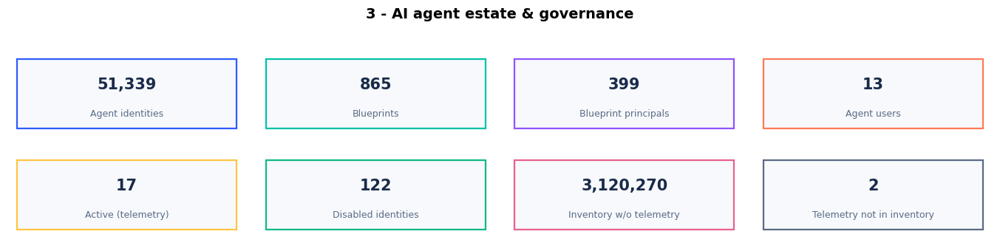

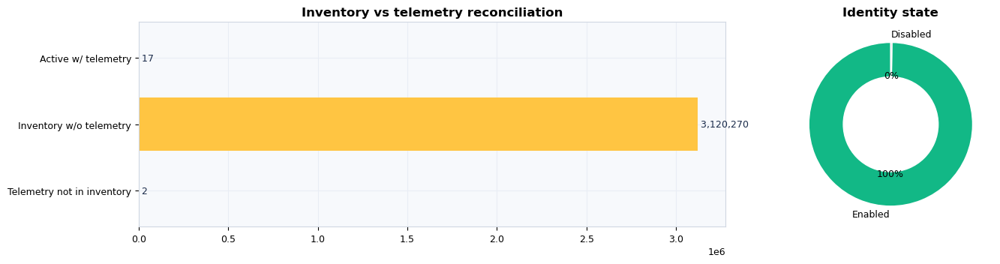

In [11]:
# Section 3 visuals - governance KPI cards + inventory/identity reconciliation (13c look & feel).
import matplotlib.pyplot as plt
PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59",
                                       "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
plt.rcParams.update({"figure.facecolor": "white", "axes.facecolor": "#F7F9FC",
                     "axes.edgecolor": "#D0D7E2", "axes.grid": True, "grid.color": "#E9EDF5",
                     "axes.axisbelow": True, "axes.titlesize": 12, "axes.titleweight": "bold", "font.size": 9})


def kpi_cards(cards, title, ncols=4):
    rows = (len(cards) + ncols - 1) // ncols
    fig, axes = plt.subplots(rows, ncols, figsize=(3.4 * ncols, 1.6 * rows))
    flat = axes.ravel() if hasattr(axes, "ravel") else [axes]
    for ax in flat:
        ax.axis("off")
    for ax, (label, val), color in zip(flat, cards, PALETTE * 4):
        ax.add_patch(plt.Rectangle((0.04, 0.12), 0.92, 0.76, transform=ax.transAxes,
                                   facecolor="#F7F9FC", edgecolor=color, linewidth=1.6, zorder=0))
        ax.text(0.5, 0.6, val, ha="center", va="center", fontsize=15, fontweight="bold", color="#1A2B4A")
        ax.text(0.5, 0.28, label, ha="center", va="center", fontsize=9, color="#5A6B85")
    fig.suptitle(title, y=1.03, fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()


n_identities = identities.select("InventoryAgentId").distinct().count()
n_blueprints = blueprints.select("BlueprintId").distinct().count()
n_principals = principals.count()
n_users = users.select("UserId").distinct().count()
n_active = events.select("AgentId").where("AgentId is not null").distinct().count()
n_disabled = identities.filter(F.col("IdentityEnabled").isin("false", "0", "disabled")).count()
n_no_tel = admin_posture.filter(F.col("LastSeen").isNull()).count()
n_shadow = telemetry_not_in_inventory.count()

kpi_cards([("Agent identities", f"{n_identities:,}"), ("Blueprints", f"{n_blueprints:,}"),
           ("Blueprint principals", f"{n_principals:,}"), ("Agent users", f"{n_users:,}"),
           ("Active (telemetry)", f"{n_active:,}"), ("Disabled identities", f"{n_disabled:,}"),
           ("Inventory w/o telemetry", f"{n_no_tel:,}"), ("Telemetry not in inventory", f"{n_shadow:,}")],
          "3 - AI agent estate & governance")

fig, (a1, a2) = plt.subplots(1, 2, figsize=(14, 3.6), gridspec_kw={"width_ratios": [2, 1]})
recon = [("Active w/ telemetry", n_active), ("Inventory w/o telemetry", n_no_tel),
         ("Telemetry not in inventory", n_shadow)]
a1.barh([k for k, _ in recon][::-1], [v for _, v in recon][::-1],
        color=[PALETTE[5], PALETTE[4], PALETTE[6]][::-1])
for i, (_, v) in enumerate(recon[::-1]):
    a1.text(v, i, f" {v:,}", va="center", fontsize=9, color="#1A2B4A")
a1.set_title("Inventory vs telemetry reconciliation")
enabled = max(n_identities - n_disabled, 0)
if (enabled + n_disabled) > 0:
    a2.pie([enabled, n_disabled], labels=["Enabled", "Disabled"], colors=["#12B886", "#E8618C"],
           autopct=lambda p: f"{p:.0f}%", startangle=90, wedgeprops={"edgecolor": "white", "width": 0.42})
a2.set_title("Identity state")
plt.tight_layout()
plt.show()


## 4. Observability and SRE

Use these views for adoption, throughput, reliability, latency, and instrumentation quality. Error matching is intentionally broad because preview tenants may serialize status differently; inspect `StatusCode` before turning a threshold into an SLO.

StatementMeta(MSGMedium, 596, 13, Finished, Available, Finished, False)

+----------+------+------------+-------------+------+------------+
|EventDate |Events|ActiveAgents|Conversations|Errors|ErrorRatePct|
+----------+------+------------+-------------+------+------------+
|2026-08-17|349   |3           |20           |154   |44.13       |
|2026-08-18|1896  |7           |96           |796   |41.98       |
|2026-08-19|1789  |6           |92           |744   |41.59       |
|2026-08-20|1996  |5           |89           |850   |42.59       |
|2026-08-21|1857  |6           |117          |789   |42.49       |
|2026-08-22|1503  |6           |81           |665   |44.24       |
|2026-08-23|2257  |3           |99           |980   |43.42       |
|2026-08-24|2265  |5           |108          |964   |42.56       |
|2026-08-25|2795  |4           |125          |1196  |42.79       |
|2026-08-26|5696  |6           |215          |2460  |43.19       |
|2026-08-27|3379  |2           |125          |1448  |42.85       |
|2026-08-28|2637  |4           |107          |1144  |43.38    

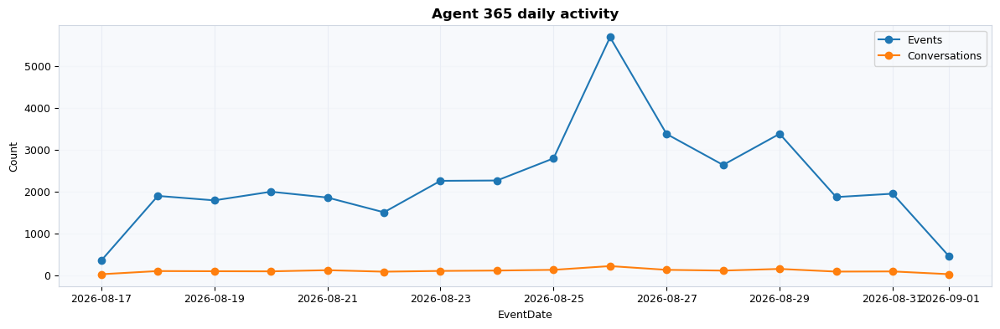

Operation distribution (enriched)
+--------------------+------+------+-------------+------+------------+------+-------+-------------------+-------------------+-------------------------------+------------------------------------+
|Op                  |Events|Agents|Conversations|Errors|ErrorRatePct|AvgMs |P95Ms  |FirstSeen          |LastSeen           |SampleAgent                    |SampleConversation                  |
+--------------------+------+------+-------------+------+------------+------+-------+-------------------+-------------------+-------------------------------+------------------------------------+
|ExecuteToolBySDK    |32716 |11    |1505         |14019 |42.85       |21.0  |0.0    |2026-08-17 18:52:18|2026-09-01 06:12:44|Autonomous me                  |15bf9185-fc14-4465-b0de-6a247970aed2|
|InvokeAgent         |1612  |1     |1550         |11    |0.68        |990.0 |4000.0 |2026-08-17 18:39:37|2026-09-01 06:12:30|                               |5cf27a7b-65ba-4dc6-ae5b-9c450

In [12]:
daily_health = (events.groupBy("EventDate")
    .agg(F.count("*").alias("Events"),
         F.countDistinct("AgentId").alias("ActiveAgents"),
         F.countDistinct("ConversationId").alias("Conversations"),
         F.sum(F.col("IsError").cast("int")).alias("Errors"))
    .withColumn("ErrorRatePct", F.round(F.col("Errors") * 100.0 / F.col("Events"), 2))
    .orderBy("EventDate"))
daily_health.show(LOOKBACK_DAYS, truncate=False)

daily_pd = daily_health.toPandas()
if not daily_pd.empty:
    daily_pd.plot(x="EventDate", y=["Events", "Conversations"], figsize=(12, 4), marker="o")
    plt.title("Agent 365 daily activity")
    plt.ylabel("Count")
    plt.grid(axis="y", alpha=.3)
    plt.tight_layout()
    plt.show()

# Operation distribution enriched: volume + reach + reliability + latency + a concrete example per operation.
print("Operation distribution (enriched)")
op_detail = (events
    .withColumn("Op", F.coalesce("Operation", F.lit("unknown")))
    .groupBy("Op")
    .agg(F.count("*").alias("Events"),
         F.countDistinct("AgentId").alias("Agents"),
         F.countDistinct("ConversationId").alias("Conversations"),
         F.sum(F.col("IsError").cast("int")).alias("Errors"),
         F.round(F.avg("DurationMs"), 0).alias("AvgMs"),
         F.round(F.expr("percentile_approx(DurationMs, 0.95)"), 0).alias("P95Ms"),
         F.min("EventTime").alias("FirstSeen"),
         F.max("EventTime").alias("LastSeen"),
         F.first("AgentName", ignorenulls=True).alias("SampleAgent"),
         F.first("ConversationId", ignorenulls=True).alias("SampleConversation"))
    .withColumn("ErrorRatePct", F.round(F.col("Errors") * 100.0 / F.col("Events"), 2))
    .orderBy(F.desc("Events")))
show_limited(op_detail.select("Op", "Events", "Agents", "Conversations", "Errors", "ErrorRatePct",
                              "AvgMs", "P95Ms", "FirstSeen", "LastSeen", "SampleAgent", "SampleConversation"), 30)

# Recent event sample per operation so you can see actual rows, not just aggregates.
print("Recent events by operation (sample rows)")
op_rank = Window.partitionBy(F.coalesce("Operation", F.lit("unknown"))).orderBy(F.desc("EventTime"))
event_samples = (events
    .withColumn("Op", F.coalesce("Operation", F.lit("unknown")))
    .withColumn("_rn", F.row_number().over(op_rank))
    .filter(F.col("_rn") <= 3)
    .orderBy("Op", F.desc("EventTime")))
show_limited(select_existing(event_samples,
    ["EventTime", "Op", "AgentName", "ConversationId", "StatusCode", "IsError", "DurationMs",
     "ActorUsername", "EventVendor", "EventProduct"]), 60)

agent_slo = (events.groupBy("AgentId", "AgentName")
    .agg(F.count("*").alias("Events"),
         F.sum(F.col("IsError").cast("int")).alias("Errors"),
         F.expr("percentile_approx(DurationMs, array(0.5, 0.95, 0.99), 10000)").alias("LatencyPercentilesMs"))
    .withColumn("ErrorRatePct", F.round(F.col("Errors") * 100.0 / F.col("Events"), 2))
    .withColumn("P50Ms", F.round(F.col("LatencyPercentilesMs")[0], 1))
    .withColumn("P95Ms", F.round(F.col("LatencyPercentilesMs")[1], 1))
    .withColumn("P99Ms", F.round(F.col("LatencyPercentilesMs")[2], 1))
    .drop("LatencyPercentilesMs")
    .orderBy(F.desc("ErrorRatePct"), F.desc("Events")))
print("Per-agent reliability and latency")
show_limited(agent_slo)

quality = events.agg(
    F.count("*").alias("Events"),
    F.sum(F.col("AgentId").isNull().cast("int")).alias("MissingAgentId"),
    F.sum(F.col("ConversationId").isNull().cast("int")).alias("MissingConversationId"),
    F.sum((F.col("Operation") == "invoke_agent").cast("int")).alias("RootInvokeAgentSpans"),
    F.sum(F.col("EventUid").isNull().cast("int")).alias("MissingEventUid"),
)
print("Correlation and instrumentation quality")
quality.show(truncate=False)

print("Platform/product coverage")
show_limited(events.groupBy("EventVendor", "EventProduct", "SrcAgentOriginalType", "TargetAgentOriginalType")
             .count().orderBy(F.desc("count")), 50)


## 5. SOC analyst detections

These transparent heuristics prioritize review; they are not verdicts. Tune thresholds against your environment, allowlists, time zones, and expected agent workflows. Text indicators inspect serialized fields only when `SHOW_SENSITIVE_CONTENT=True`; otherwise the notebook reports counts without displaying matched content.

In [13]:
recent_cutoff = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)
recent = events.filter(F.col("EventTime") >= F.lit(recent_cutoff))

error_bursts = (recent.filter("IsError")
    .groupBy("AgentId", "AgentName")
    .agg(F.count("*").alias("ErrorEvents"), F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
    .filter(F.col("ErrorEvents") >= ERROR_BURST_THRESHOLD)
    .orderBy(F.desc("ErrorEvents")))
print("Error bursts")
show_limited(error_bursts)

off_hours = (events.filter((F.col("EventHour") < 6) | (F.col("EventHour") >= 22))
    .groupBy("AgentId", "AgentName")
    .agg(F.count("*").alias("OffHoursEvents"), F.countDistinct("ActorUserId").alias("Actors"))
    .orderBy(F.desc("OffHoursEvents")))
print("Off-hours activity (UTC; tune for your operating model)")
show_limited(off_hours)

actor_fanout = (recent.filter(F.col("ActorUserId").isNotNull() & F.col("AgentId").isNotNull())
    .groupBy("ActorUserId", "ActorUsername")
    .agg(F.countDistinct("AgentId").alias("DistinctAgents"), F.count("*").alias("Events"))
    .filter(F.col("DistinctAgents") >= ACTOR_FANOUT_THRESHOLD)
    .orderBy(F.desc("DistinctAgents")))
print("High actor-to-agent fanout")
show_limited(actor_fanout)

agent_graph = (events.filter(F.col("SrcAgentId").isNotNull() & F.col("TargetAgentId").isNotNull())
    .groupBy("SrcAgentId", "SrcAgentName", "TargetAgentId", "TargetAgentName")
    .agg(F.count("*").alias("Interactions"), F.max("EventTime").alias("LastSeen"))
    .orderBy(F.desc("Interactions")))
print("Agent-to-agent interaction graph (edge list)")
show_limited(agent_graph)

target_fanin = (agent_graph.groupBy("TargetAgentId", "TargetAgentName")
    .agg(F.countDistinct("SrcAgentId").alias("SourceAgents"), F.sum("Interactions").alias("Interactions"))
    .filter(F.col("SourceAgents") >= TARGET_FANIN_THRESHOLD)
    .orderBy(F.desc("SourceAgents")))
print("High target-agent fan-in")
show_limited(target_fanin)

suspicious_pattern = r"(?i)(ignore (all|previous) instructions|reveal (the )?(system|developer) prompt|dump (credentials|secrets)|exfiltrat|bypass (policy|guardrail)|disable (security|logging)|invoke.*(shell|powershell|cmd)|curl .*token)"
suspicious_text = (events
    .withColumn("SearchText", F.concat_ws(" ", F.col("EventOriginalResultDetails"), F.col("AdditionalFields")))
    .filter(F.col("SearchText").rlike(suspicious_pattern))
    .groupBy("AgentId", "AgentName")
    .agg(F.count("*").alias("IndicatorMatches"), F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
    .orderBy(F.desc("IndicatorMatches")))
print("Suspicious text indicators (heuristic; context and analyst validation required)")
show_limited(suspicious_text)
if SHOW_SENSITIVE_CONTENT:
    print("Sensitive matched records explicitly enabled")
    show_limited(events.withColumn("SearchText", F.concat_ws(" ", "EventOriginalResultDetails", "AdditionalFields"))
                 .filter(F.col("SearchText").rlike(suspicious_pattern))
                 .select("EventTime", "AgentId", "AgentName", "ConversationId", "SearchText"), 20, truncate=200)

newly_observed = (events.groupBy("AgentId", "AgentName")
    .agg(F.min("EventTime").alias("FirstSeen"), F.count("*").alias("Events"))
    .filter(F.col("FirstSeen") >= F.lit(recent_cutoff))
    .orderBy(F.desc("Events")))
print("Newly observed in this lookback (may include reactivated agents)")
show_limited(newly_observed)

disabled_identity_activity = (recent.join(
    identities.filter(F.col("IdentityEnabled").isin("false", "0", "disabled"))
              .select("InventoryAgentId", "InventoryAgentName", "IdentityEnabled"),
    recent.AgentId == F.col("InventoryAgentId"), "inner")
    .groupBy("AgentId", "AgentName", "IdentityEnabled")
    .agg(F.count("*").alias("Events"), F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
    .orderBy(F.desc("Events")))
print("Activity attributed to disabled agent identities")
show_limited(disabled_identity_activity)

StatementMeta(MSGMedium, 594, 14, Finished, Available, Finished, False)

Error bursts
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+
|AgentId                             |AgentName                      |ErrorEvents|FirstSeen          |LastSeen           |
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+
|9e04d05a-a60d-4f1c-85e2-2df606cb1d6f|Autonomous me                  |11003      |2026-08-18 10:39:47|2026-08-28 09:25:46|
|0c2ab2c6-98d1-4de3-9907-cf3881ef573b|onvexa-evidence-synthesis-agent|41         |2026-08-21 15:25:30|2026-08-22 16:13:42|
|00000000-0000-0000-0000-000000000000|🧦 Graph Explorer              |37         |2026-08-27 03:15:11|2026-08-27 22:47:24|
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+

Off-hours activity (UTC; tune for your operating model)
+------------------------------------+--------------------------------

StatementMeta(MSGMedium, 596, 14, Finished, Available, Finished, False)

Error bursts
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+
|AgentId                             |AgentName                      |ErrorEvents|FirstSeen          |LastSeen           |
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+
|9e04d05a-a60d-4f1c-85e2-2df606cb1d6f|Autonomous me                  |11841      |2026-08-22 07:40:40|2026-09-01 06:12:45|
|00000000-0000-0000-0000-000000000000|🧦 Graph Explorer              |37         |2026-08-27 03:15:11|2026-08-27 22:47:24|
|0c2ab2c6-98d1-4de3-9907-cf3881ef573b|onvexa-evidence-synthesis-agent|35         |2026-08-22 15:08:21|2026-08-22 16:13:42|
+------------------------------------+-------------------------------+-----------+-------------------+-------------------+

Off-hours activity (UTC; tune for your operating model)
+------------------------------------+--------------------------------

## 6. Advanced analytics and investigation

Daily z-scores compare each agent with its own baseline. The composite score is deliberately transparent and sortable, not a probability: error burst 20, off-hours volume 10, high-fanout actor exposure 20, suspicious text 20, and disabled identity activity 30 points.

In [14]:
agent_daily = events.groupBy("AgentId", "AgentName", "EventDate").agg(F.count("*").alias("DailyEvents"))
baseline_window = Window.partitionBy("AgentId")
volume_anomalies = (agent_daily
    .withColumn("BaselineDays", F.count("*").over(baseline_window))
    .withColumn("MeanDailyEvents", F.avg("DailyEvents").over(baseline_window))
    .withColumn("StdDailyEvents", F.stddev_pop("DailyEvents").over(baseline_window))
    .withColumn("VolumeZScore", F.when(F.col("StdDailyEvents") > 0,
        (F.col("DailyEvents") - F.col("MeanDailyEvents")) / F.col("StdDailyEvents")))
    .filter((F.col("BaselineDays") >= MIN_BASELINE_DAYS) & (F.col("VolumeZScore") >= ZSCORE_THRESHOLD))
    .orderBy(F.desc("VolumeZScore")))
print("Per-agent daily volume anomalies")
show_limited(volume_anomalies)

high_fanout_actors = actor_fanout.select("ActorUserId").distinct()
fanout_exposure = (recent.join(high_fanout_actors, "ActorUserId", "inner")
    .groupBy("AgentId").agg(F.count("*").alias("FanoutExposureEvents")))

risk_base = (recent.groupBy("AgentId", "AgentName")
    .agg(F.count("*").alias("RecentEvents"),
         F.sum(F.col("IsError").cast("int")).alias("ErrorEvents"),
         F.sum(((F.col("EventHour") < 6) | (F.col("EventHour") >= 22)).cast("int")).alias("OffHoursEvents"),
         F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen")))

risk_findings = (risk_base
    .join(fanout_exposure, "AgentId", "left")
    .join(suspicious_text.select("AgentId", "IndicatorMatches"), "AgentId", "left")
    .join(disabled_identity_activity.select("AgentId", F.col("Events").alias("DisabledIdentityEvents")), "AgentId", "left")
    .fillna(0, ["FanoutExposureEvents", "IndicatorMatches", "DisabledIdentityEvents"])
    .withColumn("ErrorBurstPoints", F.when(F.col("ErrorEvents") >= ERROR_BURST_THRESHOLD, 20).otherwise(0))
    .withColumn("OffHoursPoints", F.when(F.col("OffHoursEvents") >= 10, 10).otherwise(0))
    .withColumn("FanoutPoints", F.when(F.col("FanoutExposureEvents") > 0, 20).otherwise(0))
    .withColumn("SuspiciousTextPoints", F.when(F.col("IndicatorMatches") > 0, 20).otherwise(0))
    .withColumn("DisabledIdentityPoints", F.when(F.col("DisabledIdentityEvents") > 0, 30).otherwise(0))
    .withColumn("RiskScore", F.col("ErrorBurstPoints") + F.col("OffHoursPoints") + F.col("FanoutPoints") +
                F.col("SuspiciousTextPoints") + F.col("DisabledIdentityPoints"))
    .withColumn("Severity", F.when(F.col("RiskScore") >= 80, "High")
                .when(F.col("RiskScore") >= HIGH_RISK_THRESHOLD, "Medium").otherwise("Informational"))
    .orderBy(F.desc("RiskScore"), F.desc("RecentEvents")))
print("Transparent composite triage score")
show_limited(risk_findings)

focus_value = FOCUS_AGENT
if not focus_value:
    busiest = events.groupBy("AgentId").count().orderBy(F.desc("count")).limit(1).collect()
    focus_value = busiest[0]["AgentId"] if busiest else None

if focus_value:
    timeline_columns = ["EventTime", "EventUid", "AgentId", "AgentName", "Operation", "ConversationId",
                        "SrcAgentId", "TargetAgentId", "ActorUserId", "ActorUsername", "StatusCode", "DurationMs"]
    if SHOW_SENSITIVE_CONTENT:
        timeline_columns += ["EventOriginalResultDetails", "AdditionalFields", "ConversationLink"]
    print(f"Investigation timeline for {focus_value}")
    focus_events = events.filter((F.col("AgentId") == focus_value) | (F.col("AgentName") == focus_value))
    show_limited(select_existing(focus_events.orderBy(F.desc("EventTime")), timeline_columns))
else:
    print("No agent activity is available for a focus timeline.")

StatementMeta(MSGMedium, 4, 41, Finished, Available, Finished, False)

Per-agent daily volume anomalies
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
|AgentId|AgentName|EventDate|DailyEvents|BaselineDays|MeanDailyEvents|StdDailyEvents|VolumeZScore|
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
+-------+---------+---------+-----------+------------+---------------+--------------+------------+

Transparent composite triage score
+------------------------------------+--------------+------------+-----------+--------------+-------------------+-------------------+--------------------+----------------+----------------------+----------------+--------------+------------+--------------------+----------------------+---------+-------------+
|AgentId                             |AgentName     |RecentEvents|ErrorEvents|OffHoursEvents|FirstSeen          |LastSeen           |FanoutExposureEvents|IndicatorMatches|DisabledIdentityEvents|ErrorBurstPoints|OffHoursPoints|F

StatementMeta(MSGMedium, 5, 15, Finished, Available, Finished, False)

Per-agent daily volume anomalies
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
|AgentId|AgentName|EventDate|DailyEvents|BaselineDays|MeanDailyEvents|StdDailyEvents|VolumeZScore|
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
+-------+---------+---------+-----------+------------+---------------+--------------+------------+

Transparent composite triage score
+------------------------------------+--------------+------------+-----------+--------------+-------------------+-------------------+--------------------+----------------+----------------------+----------------+--------------+------------+--------------------+----------------------+---------+-------------+
|AgentId                             |AgentName     |RecentEvents|ErrorEvents|OffHoursEvents|FirstSeen          |LastSeen           |FanoutExposureEvents|IndicatorMatches|DisabledIdentityEvents|ErrorBurstPoints|OffHoursPoints|F

StatementMeta(MSGMedium, 594, 15, Finished, Available, Finished, False)

Per-agent daily volume anomalies
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
|AgentId|AgentName|EventDate|DailyEvents|BaselineDays|MeanDailyEvents|StdDailyEvents|VolumeZScore|
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
+-------+---------+---------+-----------+------------+---------------+--------------+------------+

Transparent composite triage score
+------------------------------------+---------------------------------------+------------+-----------+--------------+-------------------+-------------------+--------------------+----------------+----------------------+----------------+--------------+------------+--------------------+----------------------+---------+-------------+
|AgentId                             |AgentName                              |RecentEvents|ErrorEvents|OffHoursEvents|FirstSeen          |LastSeen           |FanoutExposureEvents|IndicatorMatches|Disabl

StatementMeta(MSGMedium, 596, 15, Finished, Available, Finished, False)

Per-agent daily volume anomalies
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
|AgentId|AgentName|EventDate|DailyEvents|BaselineDays|MeanDailyEvents|StdDailyEvents|VolumeZScore|
+-------+---------+---------+-----------+------------+---------------+--------------+------------+
+-------+---------+---------+-----------+------------+---------------+--------------+------------+

Transparent composite triage score
+------------------------------------+---------------------------------------+------------+-----------+--------------+-------------------+-------------------+--------------------+----------------+----------------------+----------------+--------------+------------+--------------------+----------------------+---------+-------------+
|AgentId                             |AgentName                              |RecentEvents|ErrorEvents|OffHoursEvents|FirstSeen          |LastSeen           |FanoutExposureEvents|IndicatorMatches|Disabl

StatementMeta(MSGMedium, 596, 16, Finished, Available, Finished, False)

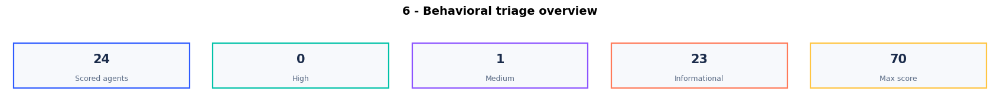

/tmp/ipykernel_5836/1658228639.py:59: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


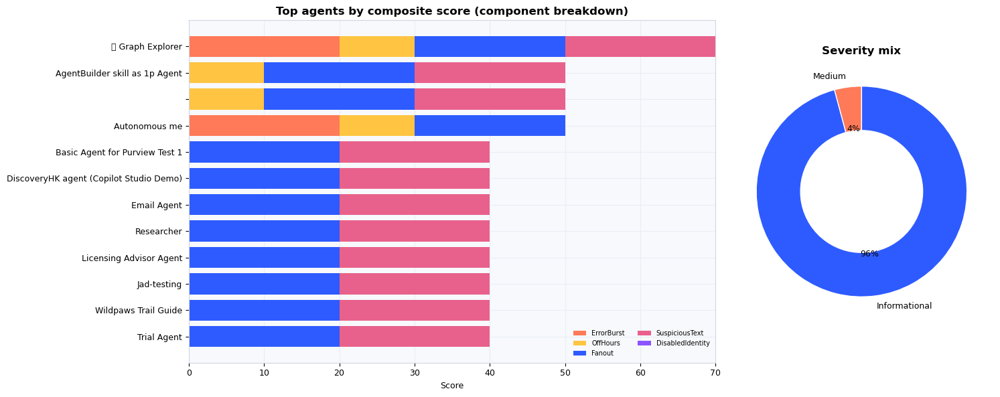

In [15]:
# Section 6 visuals - risk leaderboard, score components, and severity mix (13c look & feel).
import matplotlib.pyplot as plt
PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59",
                                       "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
plt.rcParams.update({"figure.facecolor": "white", "axes.facecolor": "#F7F9FC",
                     "axes.edgecolor": "#D0D7E2", "axes.grid": True, "grid.color": "#E9EDF5",
                     "axes.axisbelow": True, "axes.titlesize": 12, "axes.titleweight": "bold", "font.size": 9})


def kpi_cards(cards, title, ncols=4):
    rows = (len(cards) + ncols - 1) // ncols
    fig, axes = plt.subplots(rows, ncols, figsize=(3.4 * ncols, 1.6 * rows))
    flat = axes.ravel() if hasattr(axes, "ravel") else [axes]
    for ax in flat:
        ax.axis("off")
    for ax, (label, val), color in zip(flat, cards, PALETTE * 4):
        ax.add_patch(plt.Rectangle((0.04, 0.12), 0.92, 0.76, transform=ax.transAxes,
                                   facecolor="#F7F9FC", edgecolor=color, linewidth=1.6, zorder=0))
        ax.text(0.5, 0.6, val, ha="center", va="center", fontsize=15, fontweight="bold", color="#1A2B4A")
        ax.text(0.5, 0.28, label, ha="center", va="center", fontsize=9, color="#5A6B85")
    fig.suptitle(title, y=1.03, fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()


rf = globals().get("risk_findings")
if rf is None:
    print("Section 6 visuals: run section 6 first (risk_findings not defined).")
else:
    total_scored = rf.count()
    sev = {r["Severity"]: r["c"] for r in rf.groupBy("Severity").agg(F.count("*").alias("c")).collect()}
    max_score = rf.agg(F.max("RiskScore")).collect()[0][0] or 0
    kpi_cards([("Scored agents", f"{total_scored:,}"), ("High", f"{sev.get('High', 0):,}"),
               ("Medium", f"{sev.get('Medium', 0):,}"), ("Informational", f"{sev.get('Informational', 0):,}"),
               ("Max score", f"{int(max_score)}")], "6 - Behavioral triage overview", ncols=5)

    comp_cols = ["ErrorBurstPoints", "OffHoursPoints", "FanoutPoints", "SuspiciousTextPoints", "DisabledIdentityPoints"]
    top = (rf.orderBy(F.desc("RiskScore")).limit(12)
           .select("AgentName", "RiskScore", "Severity", *comp_cols).toPandas())
    if not top.empty and top["RiskScore"].sum() > 0:
        fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, max(3.2, 0.5 * len(top))),
                                     gridspec_kw={"width_ratios": [2, 1]})
        comp_colors = [PALETTE[3], PALETTE[4], PALETTE[0], PALETTE[6], PALETTE[2]]
        y = top["AgentName"][::-1].astype(str)
        left = [0.0] * len(top)
        for col, color in zip(comp_cols, comp_colors):
            vals = list(top[col][::-1])
            a1.barh(y, vals, left=left, color=color, label=col.replace("Points", ""))
            left = [l + v for l, v in zip(left, vals)]
        a1.set_title("Top agents by composite score (component breakdown)")
        a1.set_xlabel("Score")
        a1.legend(fontsize=7, ncol=2, frameon=False)
        cmap = {"High": "#E8618C", "Medium": "#FF7A59", "Informational": "#2E5BFF"}
        sd = [(k, sev.get(k, 0)) for k in ["High", "Medium", "Informational"] if sev.get(k, 0) > 0]
        if sd:
            a2.pie([v for _, v in sd], labels=[k for k, _ in sd], colors=[cmap[k] for k, _ in sd],
                   autopct=lambda p: f"{p:.0f}%", startangle=90, wedgeprops={"edgecolor": "white", "width": 0.42})
        a2.set_title("Severity mix")
        plt.tight_layout()
        plt.show()
    else:
        print("Section 6 visuals: no non-zero risk scores in the current window.")


## 7. Optional output and operationalization

The next cell writes only compact, high-score findings to the **lake tier** and only when `WRITE_RESULTS=True`. Review results first. Do not persist raw prompts, outputs, or `AdditionalFields`.

For continuous operations:

1. Schedule this notebook after tuning lookback and thresholds; make the job idempotent for your retention model.
2. Keep exploratory aggregates in a `_SPRK` lake table.
3. Promote only compact findings needed by near-real-time Sentinel detections to an Analytics-tier `_SPRK_CL` table. Analytics tier supports append only through `save_as_table` and requires the data lake managed identity to have **Log Analytics Contributor** on the destination workspace.
4. Build analytics rules on explicit finding fields and preserve the component scores so analysts can explain every alert.
5. Apply Sentinel row-level scoping, retention, access review, and privacy controls before enabling broader access.

In [16]:
output_findings = (risk_findings
    .filter(F.col("RiskScore") >= HIGH_RISK_THRESHOLD)
    .select("AgentId", "AgentName", "Severity", "RiskScore", "RecentEvents", "ErrorEvents",
            "OffHoursEvents", "FanoutExposureEvents", "IndicatorMatches", "DisabledIdentityEvents",
            "ErrorBurstPoints", "OffHoursPoints", "FanoutPoints", "SuspiciousTextPoints",
            "DisabledIdentityPoints", "FirstSeen", "LastSeen")
    .withColumn("GeneratedTimeUtc", F.current_timestamp())
    .withColumn("LookbackDays", F.lit(LOOKBACK_DAYS)))

print(f"High-score findings ready for output: {output_findings.count():,}")
if WRITE_RESULTS:
    run_id = provider.save_as_table(
        output_findings,
        "Agent365RiskFindings_SPRK",
        write_options={"mode": "overwrite"},
    )
    print(f"Wrote Agent365RiskFindings_SPRK. Run ID: {run_id}")
else:
    print("WRITE_RESULTS is False; no data was written.")

StatementMeta(MSGMedium, 4, 24, Finished, Available, Finished, False)

High-score findings ready for output: 0
WRITE_RESULTS is False; no data was written.


StatementMeta(MSGMedium, 5, 17, Finished, Available, Finished, False)

High-score findings ready for output: 0
WRITE_RESULTS is False; no data was written.


StatementMeta(MSGMedium, 594, 17, Finished, Available, Finished, False)

High-score findings ready for output: 1
WRITE_RESULTS is False; no data was written.


StatementMeta(MSGMedium, 596, 17, Finished, Available, Finished, False)

High-score findings ready for output: 1
WRITE_RESULTS is False; no data was written.


## 8. Closing gaps with already-ingested Sentinel telemetry (Copilot Studio + Foundry)

Many "Partial"/"Gap" rows above are gaps of `UnifiedAgentObservability` **alone**. They are not gaps of the tenant, because Copilot Studio and Foundry agents already export richer runtime telemetry into the Sentinel workspace (Analytics tier) via workspace-based Application Insights. This section reads those tables directly and closes the dimensions the lake table lacks.

**Sources (Analytics tier, read with a workspace name):**

| Platform | Table | Signal |
| --- | --- | --- |
| Copilot Studio | `AppEvents` | Bot turns (`BotMessageReceived`/`BotMessageSend`), `Properties.text`, `conversationId`, `channelId` |
| Copilot Studio | `AppDependencies` | Connector calls (`DependencyType == "Connector"`, `Target`, `Success`, `DurationMs`) |
| Foundry Agents | `AppDependencies` | `gen_ai.*` spans: agent name, conversation id, tool name/type, `usage.*` tokens, `request.model`, `microsoft.foundry.content_filter.results`, `mcp.*` |

**What this closes (with current telemetry):**

- **Tool / MCP / inference dimension** — from Foundry `gen_ai.tool.*` / `mcp.*` and Copilot Studio connector targets.
- **Model dimension + tokens + cost** — from `gen_ai.request.model` and `gen_ai.usage.*` with the `PRICE_*` parameters.
- **Content safety / jailbreak** — from `microsoft.foundry.content_filter.results` (Prompt Shield / harm categories).
- **Channel** — from Copilot Studio `channelId`.
- **Connector reliability / latency** — from `AppDependencies.Success` / `DurationMs`.

**What it does NOT close here** (now covered in **section 16**, which joins these from the workspace): Defender alerts/incidents, Entra sign-ins/audit, and Defender-for-Cloud-Apps data access. Still outstanding: owner / sponsor / business unit, blueprint-principal OAuth-scope decoding, and Purview DLP/sensitivity labels.

> Prerequisites: Copilot Studio and Foundry projects pointed at **workspace-based** Application Insights on this workspace; Foundry needs `AZURE_TRACING_GEN_AI_CONTENT_RECORDING_ENABLED=true` for text-content tiles. Set `WORKSPACE_NAME` in the controls cell. Tiles degrade gracefully (empty, not error) when a source is absent.

In [17]:
# Analytics-tier reads for Copilot Studio + Foundry telemetry already ingested in the Sentinel workspace.
analytics_cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

def read_workspace_table(table_name):
    """Return a time-filtered workspace table, or None so tiles degrade gracefully (like union isfuzzy=true)."""
    if not WORKSPACE_NAME:
        return None
    try:
        df = provider.read_table(table_name, WORKSPACE_NAME)
    except Exception as exc:  # noqa: BLE001 - preview tenants may lack a table entirely
        print(f"  {table_name}: unavailable ({type(exc).__name__})")
        return None
    if "TimeGenerated" in df.columns:
        df = df.filter(F.to_timestamp("TimeGenerated") >= F.lit(analytics_cutoff))
    return df

def prop(paths):
    """Read a value from the App Insights Properties bag; supports dotted gen_ai/mcp keys via bracket paths."""
    exprs = []
    for path in paths:
        exprs.append(F.get_json_object(F.col("Properties").cast("string"), path))
    return F.coalesce(*exprs)

app_events = read_workspace_table("AppEvents")
app_dependencies = read_workspace_table("AppDependencies")

copilot_turns = foundry_spans = None

# --- Copilot Studio: bot turns + connector calls ---
if app_events is not None and "Name" in app_events.columns:
    copilot_turns = (app_events
        .filter(F.col("Name").rlike("(?i)BotMessage(Received|Send)"))
        .withColumn("Direction", F.when(F.lower("Name").rlike("received"), "inbound").otherwise("outbound"))
        .withColumn("ConversationId", prop(["$.conversationId", "$.ConversationId"]))
        .withColumn("ChannelId", prop(["$.channelId", "$.ChannelId"]))
        .withColumn("BotName", F.coalesce(first_existing(app_events, ["AppRoleName"]), prop(["$.botId", "$.BotId"])))
        .withColumn("TextLen", F.length(prop(["$.text", "$.Text"])))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))
    print("Copilot Studio - bot turns by channel and direction")
    show_limited(copilot_turns.groupBy("BotName", "ChannelId", "Direction")
                 .agg(F.count("*").alias("Turns"), F.countDistinct("ConversationId").alias("Conversations"))
                 .orderBy(F.desc("Turns")), 30)

if app_dependencies is not None and "DependencyType" in app_dependencies.columns:
    connectors = (app_dependencies
        .filter(F.lower("DependencyType").rlike("connector|http"))
        .withColumn("Target", first_existing(app_dependencies, ["Target"]))
        .withColumn("Success", first_existing(app_dependencies, ["Success"]))
        .withColumn("DurationMs", F.col("DurationMs").cast(DoubleType())
                    if "DurationMs" in app_dependencies.columns else F.lit(None).cast(DoubleType())))
    print("Copilot Studio - connector reliability and latency")
    show_limited(connectors.groupBy("Target")
        .agg(F.count("*").alias("Calls"),
             F.sum(F.when(F.lower(F.col("Success").cast("string")).isin("false", "0"), 1).otherwise(0)).alias("Failures"),
             F.round(F.avg("DurationMs"), 1).alias("AvgMs"))
        .orderBy(F.desc("Calls")), 30)

# --- Foundry: gen_ai spans (tools, model, tokens, cost, content safety) ---
if app_dependencies is not None:
    gen_ai = app_dependencies.withColumn("AgentName", prop(["$['gen_ai.agent.name']", "$['gen_ai.request.model']"]))
    foundry_spans = (gen_ai.filter(F.col("AgentName").isNotNull())
        .withColumn("ConversationId", prop(["$['gen_ai.conversation.id']"]))
        .withColumn("ToolName", prop(["$['gen_ai.tool.name']", "$['mcp.tool.name']"]))
        .withColumn("ToolType", prop(["$['gen_ai.tool.type']", "$['mcp.method.name']"]))
        .withColumn("Model", prop(["$['gen_ai.request.model']", "$['gen_ai.response.model']"]))
        .withColumn("InputTokens", prop(["$['gen_ai.usage.input_tokens']"]).cast(DoubleType()))
        .withColumn("OutputTokens", prop(["$['gen_ai.usage.output_tokens']"]).cast(DoubleType()))
        .withColumn("ContentFilter", prop(["$['microsoft.foundry.content_filter.results']"]))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))

    if foundry_spans.limit(1).count() > 0:
        print("Foundry - per-model tokens and estimated cost")
        show_limited(foundry_spans.groupBy("Model")
            .agg(F.count("*").alias("Spans"),
                 F.round(F.sum("InputTokens"), 0).alias("InputTokens"),
                 F.round(F.sum("OutputTokens"), 0).alias("OutputTokens"),
                 F.round(F.sum("InputTokens") / 1000 * PRICE_INPUT_PER_1K +
                         F.sum("OutputTokens") / 1000 * PRICE_OUTPUT_PER_1K, 2).alias("EstCostUsd"))
            .orderBy(F.desc("Spans")), 30)

        print("Foundry - tool / MCP usage per agent")
        show_limited(foundry_spans.filter(F.col("ToolName").isNotNull())
            .groupBy("AgentName", "ToolName", "ToolType")
            .agg(F.count("*").alias("Calls"), F.countDistinct("ConversationId").alias("Conversations"))
            .orderBy(F.desc("Calls")), 40)

        print("Foundry - content-safety / Prompt Shield verdicts (counts only)")
        show_limited(foundry_spans.filter(F.col("ContentFilter").isNotNull() &
                     F.col("ContentFilter").rlike('(?i)"(filtered|detected)"\\s*:\\s*true|jailbreak|"severity"\\s*:\\s*"(medium|high)"'))
            .groupBy("AgentName", "Model")
            .agg(F.count("*").alias("FlaggedSpans"), F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
            .orderBy(F.desc("FlaggedSpans")), 30)
    else:
        foundry_spans = None

if WORKSPACE_NAME and copilot_turns is None and foundry_spans is None:
    print("No Copilot Studio or Foundry Application Insights rows resolved. Confirm workspace-based App Insights export and WORKSPACE_NAME.")
elif not WORKSPACE_NAME:
    print("WORKSPACE_NAME is blank; set it in the controls cell to enable sections 8-9.")

StatementMeta(MSGMedium, 5, 18, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Loading table: AppEvents"}
{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Successfully loaded table AppEvents"}
{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Loading table: AppDependencies"}
{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Successfully loaded table AppDependencies"}
Copilot Studio - bot turns by channel and direction
+------------------------+----------+---------+-----+-------------+
|BotName                 |ChannelId |Direction|Turns|Conversations|
+------------------------+----------+---------+-----+-------------+
|Microsoft Copilot Studio|pva-studio|inbound  |194  |15           |
|Microsoft Copilot Studio|pva-studio|outbound |176  |15           |
+------------------------+----------+---------+-----+-------------+

Copilot Studio - connector reliability and latency
+---------------------

StatementMeta(MSGMedium, 594, 18, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "Message": "Loading table: AppEvents"}
{"Level": "ERROR", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "AccountId": "ee2139f9-a9bc-4af8-9531-932b706b1cdb", "CorrelationId": "0690d8e1-de41-4ed2-997c-a66510cbf63c", "ErrorName": "TableDoesNotExist", "ErrorType": "User", "ErrorCategory": "TableError", "ErrorCode": 2100, "Message": "Table AppEvents not found in the database CyberSOC."}
{"Level": "ERROR", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "AccountId": "ee2139f9-a9bc-4af8-9531-932b706b1cdb", "CorrelationId": "0690d8e1-de41-4ed2-997c-a66510cbf63c", "ErrorName": "ProvisioningIncomplete", "ErrorType": "Internal", "ErrorCategory": "TableError", "ErrorCode": 2101, "Message": "Table AppEvents is not ready. Wait a few minutes before trying again."}
  AppEvents: unavailable (SentinelException)
{"Level": "INFO", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "Message": "Loading table: AppDependencies"}
{"Le

StatementMeta(MSGMedium, 596, 18, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: AppEvents"}
{"Level": "ERROR", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "AccountId": "ee2139f9-a9bc-4af8-9531-932b706b1cdb", "CorrelationId": "66718b12-f474-4eac-9392-332516acb2c8", "ErrorName": "TableDoesNotExist", "ErrorType": "User", "ErrorCategory": "TableError", "ErrorCode": 2100, "Message": "Table AppEvents not found in the database CyberSOC."}
{"Level": "ERROR", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "AccountId": "ee2139f9-a9bc-4af8-9531-932b706b1cdb", "CorrelationId": "66718b12-f474-4eac-9392-332516acb2c8", "ErrorName": "ProvisioningIncomplete", "ErrorType": "Internal", "ErrorCategory": "TableError", "ErrorCode": 2101, "Message": "Table AppEvents is not ready. Wait a few minutes before trying again."}
  AppEvents: unavailable (SentinelException)
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: AppDependencies"}
{"Le

## 9. Advanced visuals

Presentation-grade charts for executive and SOC reporting, mirroring the AI Agents Monitoring workbook style. Everything aggregates in Spark first and only small Pandas frames reach matplotlib, so the plots stay fast and safe. Panels render only when their source is present; missing sources are skipped, not errored.

StatementMeta(MSGMedium, 596, 19, Finished, Available, Finished, False)

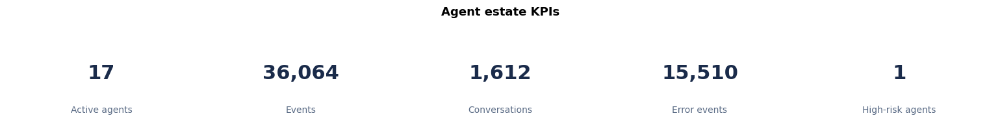

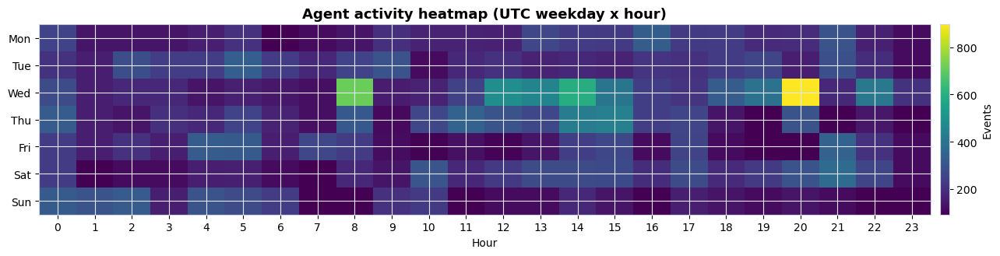

/tmp/ipykernel_5836/4214719093.py:68: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


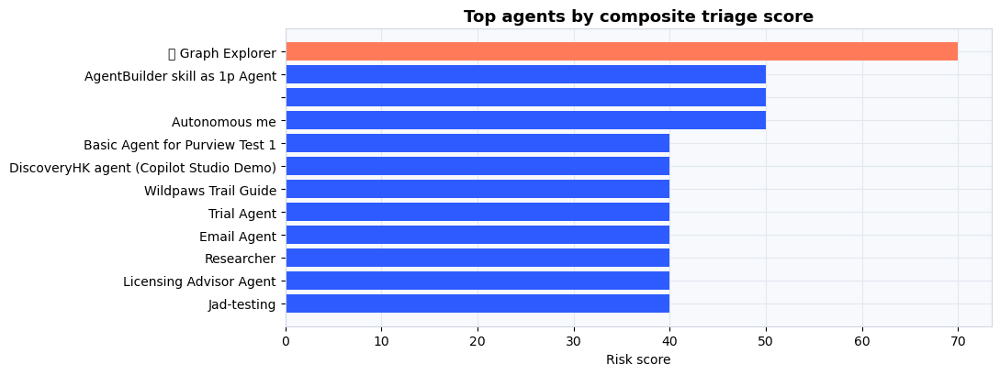

Section 9 rendered the executive KPI ribbon, activity heatmap, and risk chart.


In [18]:
plt.rcParams.update({
    "figure.facecolor": "white", "axes.facecolor": "#F7F9FC", "axes.edgecolor": "#D0D7E2",
    "axes.grid": True, "grid.color": "#E3E8F0", "axes.axisbelow": True,
    "axes.titlesize": 13, "axes.titleweight": "bold", "font.size": 10,
})
ACCENT = ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C"]


def kpi_panel(pairs, title="Agent estate KPIs"):
    fig, axes = plt.subplots(1, len(pairs), figsize=(3.1 * len(pairs), 1.9))
    if len(pairs) == 1:
        axes = [axes]
    for ax, (label, value) in zip(axes, pairs):
        ax.axis("off")
        ax.text(0.5, 0.62, f"{value:,}" if isinstance(value, int) else str(value),
                ha="center", va="center", fontsize=22, fontweight="bold", color="#1A2B4A")
        ax.text(0.5, 0.18, label, ha="center", va="center", fontsize=10, color="#5A6B85")
    fig.suptitle(title, y=1.04, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


# 9.1 Executive KPI ribbon
risk_findings = globals().get("risk_findings")
total_agents = events.select("AgentId").where("AgentId is not null").distinct().count()
total_events = events.count()
total_convos = events.select("ConversationId").where("ConversationId is not null").distinct().count()
total_errors = events.agg(F.sum(F.col("IsError").cast("int"))).collect()[0][0] or 0
high_risk = risk_findings.filter(F.col("RiskScore") >= HIGH_RISK_THRESHOLD).count() if risk_findings is not None else 0
kpi_panel([
    ("Active agents", total_agents),
    ("Events", total_events),
    ("Conversations", total_convos),
    ("Error events", int(total_errors)),
    ("High-risk agents", high_risk),
])

# 9.2 Activity heatmap by weekday x hour
heat = (events.withColumn("Weekday", F.date_format("EventTime", "E"))
    .groupBy("Weekday", "EventHour").count().toPandas())
if not heat.empty:
    order = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    grid = heat.pivot(index="Weekday", columns="EventHour", values="count").reindex(order).fillna(0)
    fig, ax = plt.subplots(figsize=(13, 3.4))
    im = ax.imshow(grid.values, aspect="auto", cmap="mako" if "mako" in plt.colormaps() else "viridis")
    ax.set_xticks(range(len(grid.columns)))
    ax.set_xticklabels(grid.columns)
    ax.set_yticks(range(len(grid.index)))
    ax.set_yticklabels(grid.index)
    ax.set_title("Agent activity heatmap (UTC weekday x hour)")
    ax.set_xlabel("Hour")
    fig.colorbar(im, ax=ax, fraction=0.025, pad=0.01, label="Events")
    plt.tight_layout()
    plt.show()
else:
    print("9.2 activity heatmap skipped: no events in the selected window.")

# 9.3 Top agents by risk score
if risk_findings is not None:
    risk_pd = (risk_findings.select("AgentName", "RiskScore", "Severity")
        .orderBy(F.desc("RiskScore")).limit(12).toPandas())
    if not risk_pd.empty and risk_pd["RiskScore"].sum() > 0:
        colors = risk_pd["Severity"].map({"High": "#E8618C", "Medium": "#FF7A59"}).fillna("#2E5BFF")
        fig, ax = plt.subplots(figsize=(11, 4.2))
        ax.barh(risk_pd["AgentName"][::-1], risk_pd["RiskScore"][::-1], color=colors[::-1])
        ax.set_title("Top agents by composite triage score")
        ax.set_xlabel("Risk score")
        plt.tight_layout()
        plt.show()
    else:
        print("9.3 risk chart skipped: no non-zero risk scores.")
else:
    print("9.3 risk chart skipped: run section 6 to populate risk_findings.")

print("Section 9 rendered the executive KPI ribbon, activity heatmap, and risk chart.")

## 10. Cross-source executive board and conversation-volume anomaly

This section keeps the distinct cross-source views that combine the **`UnifiedAgentObservability`** lake table with queryable **Copilot Studio + Foundry Application Insights** telemetry.

| View | Source | Purpose |
| --- | --- | --- |
| Unified estate and activity | lake + Foundry + Copilot Studio | executive KPI ribbon, platform mix, daily source trend |
| Cross-source risk leaderboard | section 6 score | ranked lake-derived triage score |
| Unified conversation-volume anomaly | all available conversation sources | daily distinct-conversation trend with rolling baseline and spike markers |

Foundry economics, tools, guardrails, Copilot connector detail, channel mix, and first-seen watches are intentionally left to their platform-specific hunt and SOC sections. All aggregation happens in Spark before compact summaries reach pandas/matplotlib; prompt and response bodies are never displayed.

StatementMeta(MSGMedium, 5, 21, Finished, Available, Finished, False)

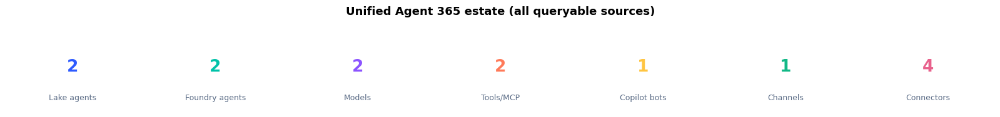

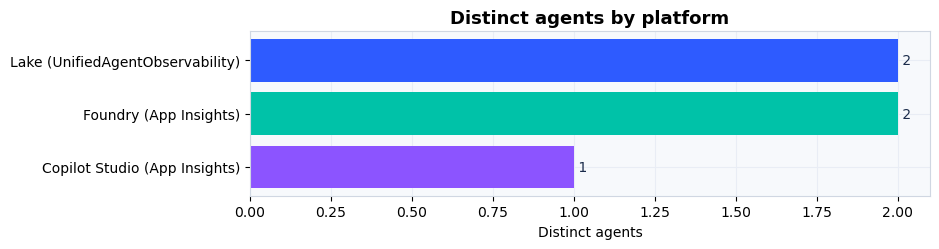

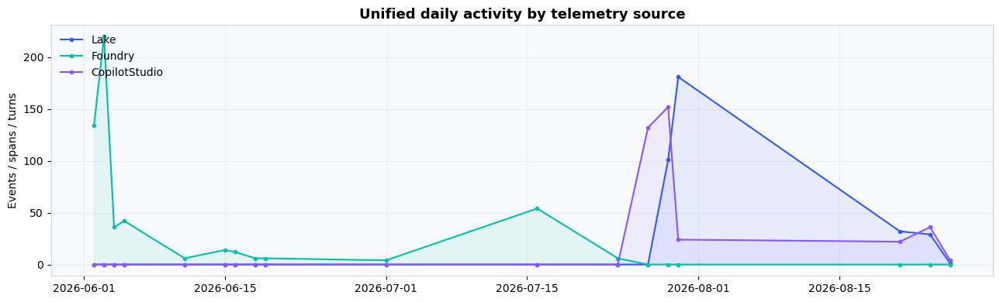

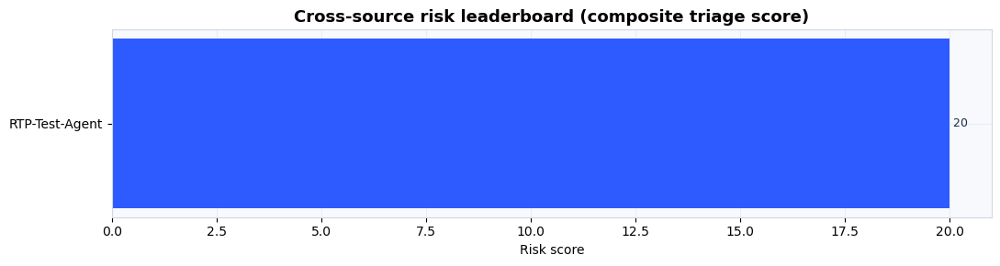

StatementMeta(MSGMedium, 594, 20, Finished, Available, Finished, False)

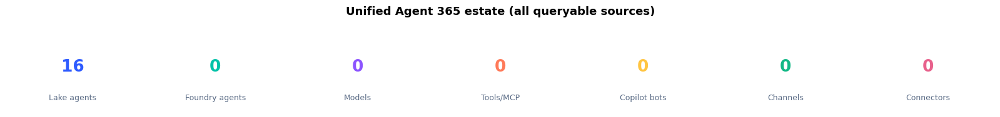

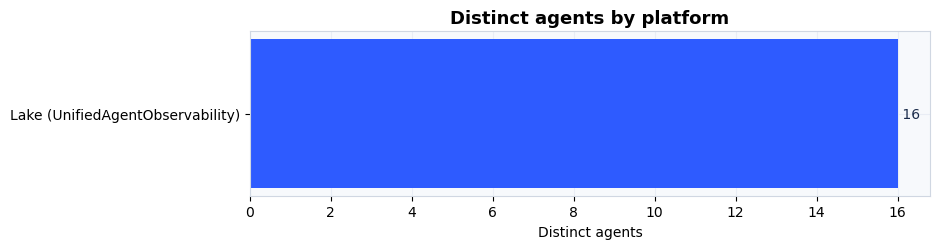

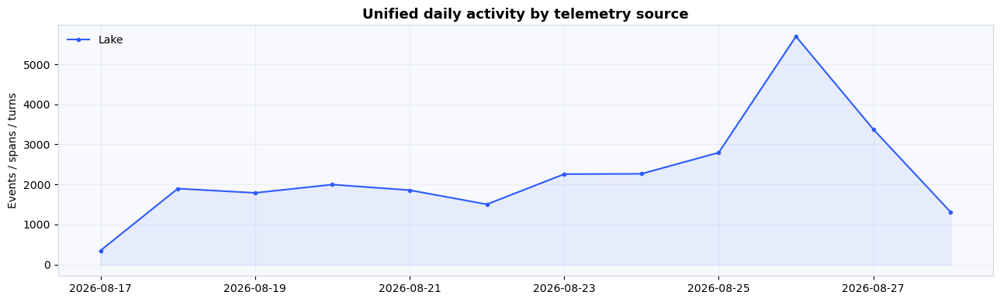

/tmp/ipykernel_6096/2559403308.py:114: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


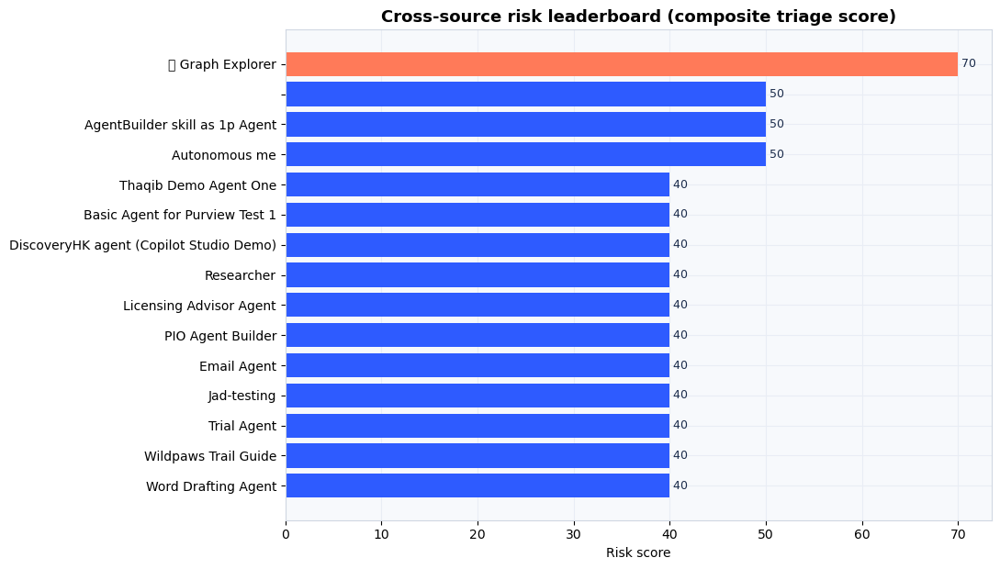

StatementMeta(MSGMedium, 596, 20, Finished, Available, Finished, False)

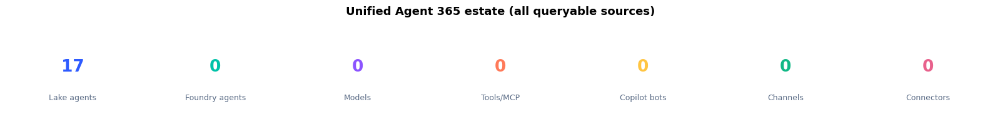

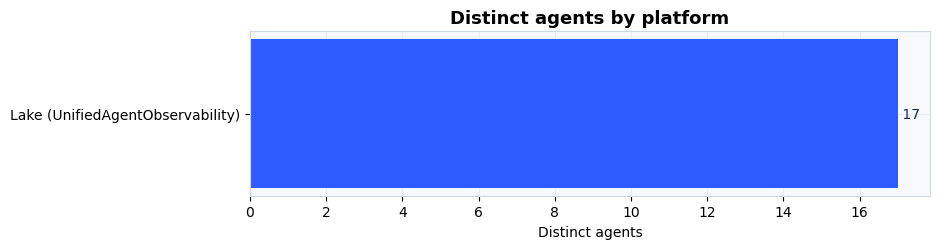

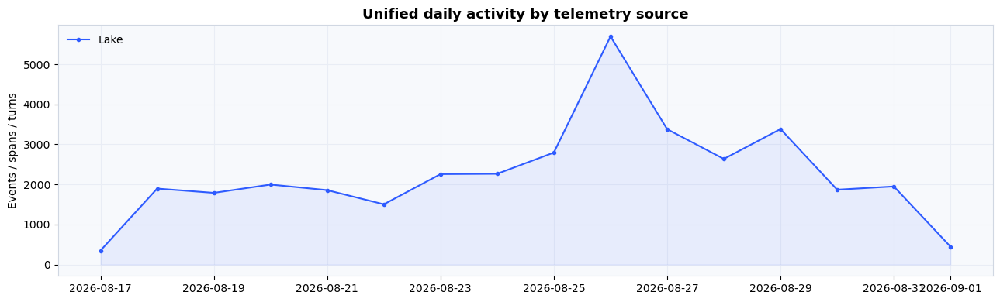

/tmp/ipykernel_5836/2559403308.py:114: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


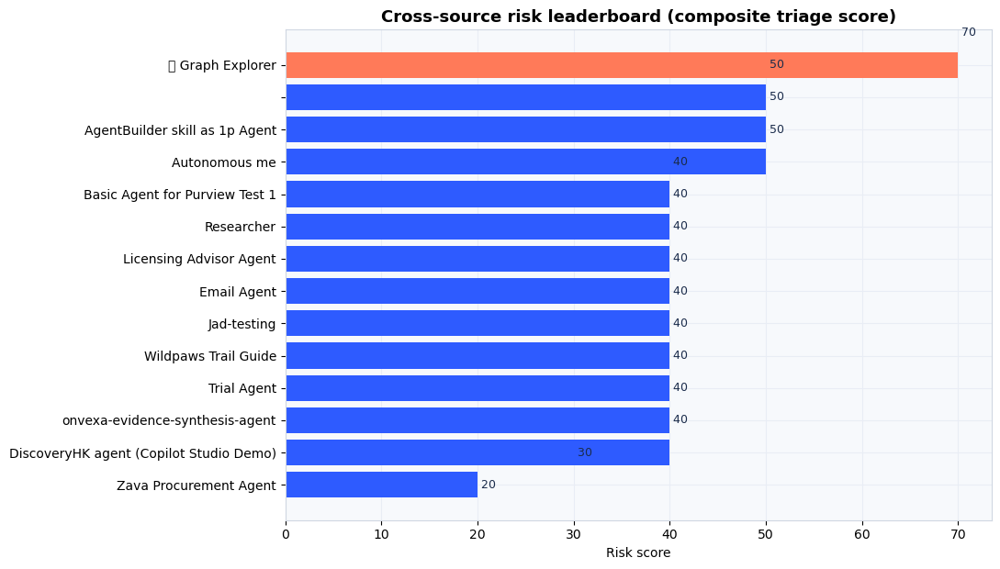

In [19]:
# Section 10 (part 1) - unified estate, activity trend, and cross-source risk leaderboard.
# Sources: lake `events` (section 2) + Copilot Studio / Foundry App Insights frames (section 8).
# No Defender Advanced Hunting dependency; every panel guards its source and skips (not errors) when absent.
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
plt.rcParams.update({
    "figure.facecolor": "white", "axes.facecolor": "#F7F9FC", "axes.edgecolor": "#D0D7E2",
    "axes.grid": True, "grid.color": "#E9EDF5", "axes.axisbelow": True,
    "axes.titlesize": 13, "axes.titleweight": "bold", "font.size": 10,
})

foundry = globals().get("foundry_spans")
copilot = globals().get("copilot_turns")
appdeps = globals().get("app_dependencies")
risk = globals().get("risk_findings")
recent_cut10 = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)


def distinct_count(df, col):
    if df is None or col not in df.columns:
        return 0
    return df.where(f"{col} is not null").select(col).distinct().count()


def kpi_ribbon(pairs, title):
    fig, axes = plt.subplots(1, len(pairs), figsize=(2.3 * len(pairs), 1.7))
    axes = axes if len(pairs) > 1 else [axes]
    for ax, (label, value), color in zip(axes, pairs, PALETTE * 4):
        ax.axis("off")
        ax.text(0.5, 0.66, f"{value:,}", ha="center", va="center", fontsize=19, fontweight="bold", color=color)
        ax.text(0.5, 0.2, label, ha="center", va="center", fontsize=9, color="#5A6B85")
    fig.suptitle(title, y=1.08, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


# --- Scenario 1: unified estate across every queryable source ---
lake_agents = distinct_count(events, "AgentId")
fnd_agents = distinct_count(foundry, "AgentName")
fnd_models = distinct_count(foundry, "Model")
fnd_tools = distinct_count(foundry, "ToolName")
cs_bots = distinct_count(copilot, "BotName")
cs_channels = distinct_count(copilot, "ChannelId")
cs_connectors = 0
if appdeps is not None and "DependencyType" in appdeps.columns:
    cs_connectors = (appdeps.filter(F.lower("DependencyType").rlike("connector|http"))
                     .select(first_existing(appdeps, ["Target"]).alias("T")).where("T is not null")
                     .distinct().count())

kpi_ribbon([("Lake agents", lake_agents), ("Foundry agents", fnd_agents), ("Models", fnd_models),
            ("Tools/MCP", fnd_tools), ("Copilot bots", cs_bots), ("Channels", cs_channels),
            ("Connectors", cs_connectors)], "Unified Agent 365 estate (all queryable sources)")

platform_mix = [(k, v) for k, v in [
    ("Lake (UnifiedAgentObservability)", lake_agents),
    ("Foundry (App Insights)", fnd_agents),
    ("Copilot Studio (App Insights)", cs_bots)] if v > 0]
if platform_mix:
    labels = [k for k, _ in platform_mix]
    vals = [v for _, v in platform_mix]
    fig, ax = plt.subplots(figsize=(9.5, 2.6))
    ax.barh(labels[::-1], vals[::-1], color=PALETTE[:len(platform_mix)][::-1])
    for i, v in enumerate(vals[::-1]):
        ax.text(v, i, f" {v:,}", va="center", fontsize=10, color="#1A2B4A")
    ax.set_title("Distinct agents by platform")
    ax.set_xlabel("Distinct agents")
    plt.tight_layout()
    plt.show()

# --- Scenario 2: unified daily activity across sources ---
frames = []
lake_daily = (events.groupBy(F.to_date("EventTime").alias("Day")).count()
              .withColumnRenamed("count", "Lake").toPandas())
if not lake_daily.empty:
    frames.append(lake_daily.set_index("Day"))
if foundry is not None:
    fnd_daily = (foundry.groupBy(F.to_date("EventTime").alias("Day")).count()
                 .withColumnRenamed("count", "Foundry").toPandas())
    if not fnd_daily.empty:
        frames.append(fnd_daily.set_index("Day"))
if copilot is not None:
    cs_daily = (copilot.groupBy(F.to_date("EventTime").alias("Day")).count()
                .withColumnRenamed("count", "CopilotStudio").toPandas())
    if not cs_daily.empty:
        frames.append(cs_daily.set_index("Day"))
if frames:
    activity = pd.concat(frames, axis=1).fillna(0).sort_index()
    fig, ax = plt.subplots(figsize=(13, 4))
    for i, colname in enumerate(activity.columns):
        ax.plot(activity.index, activity[colname], marker="o", ms=3, color=PALETTE[i], label=colname)
        ax.fill_between(activity.index, activity[colname], alpha=0.08, color=PALETTE[i])
    ax.set_title("Unified daily activity by telemetry source")
    ax.set_ylabel("Events / spans / turns")
    ax.legend(loc="upper left", frameon=False)
    plt.tight_layout()
    plt.show()

# --- Scenario 3: cross-source risk leaderboard (section 6 composite score) ---
if risk is not None:
    rp = (risk.select("AgentName", "RiskScore", "Severity")
          .orderBy(F.desc("RiskScore")).limit(15).toPandas())
    rp = rp[rp["RiskScore"] > 0]
    if not rp.empty:
        cmap = {"High": "#E8618C", "Medium": "#FF7A59", "Informational": "#2E5BFF"}
        colors = rp["Severity"].map(cmap).fillna("#2E5BFF")
        fig, ax = plt.subplots(figsize=(11, max(3, 0.42 * len(rp))))
        ax.barh(rp["AgentName"][::-1].astype(str), rp["RiskScore"][::-1], color=colors[::-1])
        for i, v in enumerate(rp["RiskScore"][::-1]):
            ax.text(v, i, f" {int(v)}", va="center", fontsize=9, color="#1A2B4A")
        ax.set_title("Cross-source risk leaderboard (composite triage score)")
        ax.set_xlabel("Risk score")
        plt.tight_layout()
        plt.show()
    else:
        print("Risk leaderboard: no non-zero scores in the current window.")
else:
    print("Risk leaderboard: run section 6 first (risk_findings not defined).")


StatementMeta(MSGMedium, 594, 21, Finished, Available, Finished, False)

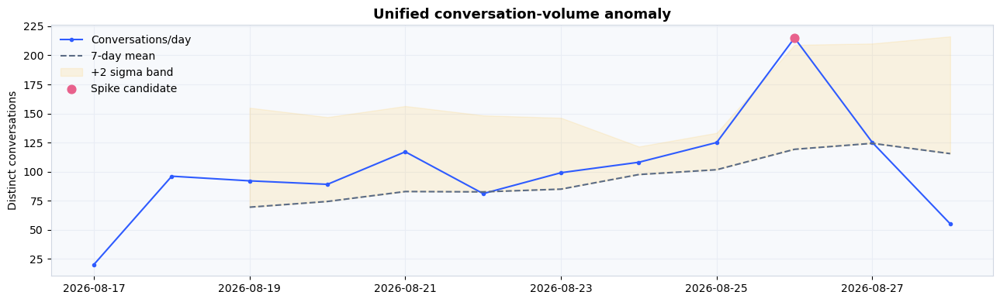

Section 10 anomaly rendered from 1 available conversation source(s).


StatementMeta(MSGMedium, 596, 21, Finished, Available, Finished, False)

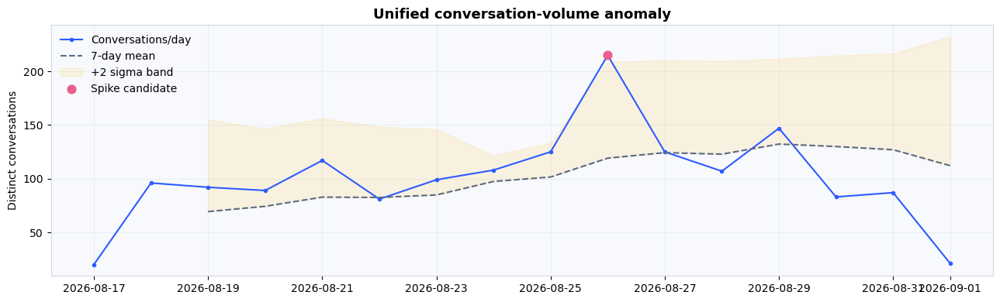

Section 10 anomaly rendered from 1 available conversation source(s).


In [20]:
# Section 10 (part 2) - unified conversation-volume anomaly only.
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
foundry10 = globals().get("foundry_spans")
copilot10 = globals().get("copilot_turns")

daily_frames = []
for source in [events, foundry10, copilot10]:
    if source is not None and "ConversationId" in source.columns:
        daily = (source.filter(F.col("ConversationId").isNotNull())
            .groupBy(F.to_date("EventTime").alias("Day"))
            .agg(F.countDistinct("ConversationId").alias("Conversations"))
            .orderBy("Day").toPandas())
        if not daily.empty:
            daily_frames.append(daily.set_index("Day"))

if not daily_frames:
    print("Section 10 anomaly: no conversation identifiers are available from the selected sources.")
else:
    total = pd.concat(daily_frames, axis=1).fillna(0).sum(axis=1).sort_index()
    rolling_mean = total.rolling(7, min_periods=3).mean()
    rolling_std = total.rolling(7, min_periods=3).std().fillna(0)
    upper_band = rolling_mean + 2 * rolling_std
    spikes = total[(total > upper_band) & upper_band.notna() & (upper_band > 0)]

    fig, ax = plt.subplots(figsize=(13, 4))
    ax.plot(total.index, total.values, color=PALETTE[0], marker="o", markersize=3, label="Conversations/day")
    ax.plot(rolling_mean.index, rolling_mean.values, color=PALETTE[7], linestyle="--", label="7-day mean")
    ax.fill_between(upper_band.index, rolling_mean.values, upper_band.values, color=PALETTE[4], alpha=0.15, label="+2 sigma band")
    if not spikes.empty:
        ax.scatter(spikes.index, spikes.values, color=PALETTE[6], zorder=5, s=60, label="Spike candidate")
    ax.set_title("Unified conversation-volume anomaly")
    ax.set_ylabel("Distinct conversations")
    ax.legend(loc="upper left", frameon=False)
    plt.tight_layout()
    plt.show()
    print(f"Section 10 anomaly rendered from {len(daily_frames)} available conversation source(s).")

## 11. Foundry Agents hunting scenarios (ported from the security repo)

Spark ports of the **Foundry_Agents** bundle from `Dalonso-Security-Repo / Use Cases Threat Hunting / Monitoring AI Agents / Foundry_Agents`. The repo ships these as Sentinel KQL/YAML analytic rules + hunting queries over `AppDependencies` `gen_ai.*` spans and `microsoft.foundry.content_filter.results`; this section runs the equivalent logic against the `app_dependencies` DataFrame loaded in section 8.

Ported hunts: guardrail jailbreak / prompt-shield / indirect-injection signals, content-safety filter hits, prompt-injection markers in input, secrets in output, model-fingerprinting probes, new-tool-first-seen, excessive tool chaining, cross-agent invocation (lateral movement), token-cost spike (denial-of-wallet), trace-level anomalies, and dormancy break.

> Text-content hunts (input/output markers, secrets) only fire when Foundry tracing has `AZURE_TRACING_GEN_AI_CONTENT_RECORDING_ENABLED=true`; guardrail, tool, token and trace hunts work from span metadata alone. Foundry telemetry has no human-user field, so hunts pivot on `gen_ai.agent.name` and `gen_ai.conversation.id`.


In [21]:
# Section 11 - Foundry Agents hunting scenarios ported from the repo
# (Use Cases Threat Hunting / Monitoring AI Agents / Foundry_Agents). Runs against the AppDependencies
# gen_ai.* spans loaded in section 8. Text hunts require AZURE_TRACING_GEN_AI_CONTENT_RECORDING_ENABLED=true.
FND_INJECTION = r"(?i)(ignore (all|previous|above) (instructions|prompts)|disregard (the )?(system|previous)|new instructions:|reveal (your |the )?(system|developer) prompt|you are now|act as|jailbreak|do anything now|DAN mode|bypass (the )?(policy|guardrail|filter))"
FND_SECRETS = r"(?i)(AKIA[0-9A-Z]{16}|-----BEGIN (RSA |EC |OPENSSH )?PRIVATE KEY-----|eyJ[A-Za-z0-9_-]{10,}\.[A-Za-z0-9_-]{10,}\.[A-Za-z0-9_-]{10,}|password\s*[:=]|client_secret)"
FND_FINGERPRINT = r"(?i)(which model are you|what model|are you (gpt|claude|gemini|grok)|your (model|version|training data)|system architecture|what are your (tools|capabilities))"

fnd_recent_cut = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)

if 'app_dependencies' in dir() and app_dependencies is not None:
    fspans = (app_dependencies
        .withColumn("AgentName", prop(["$['gen_ai.agent.name']"]))
        .withColumn("ConversationId", prop(["$['gen_ai.conversation.id']"]))
        .withColumn("InputMsg", prop(["$['gen_ai.input.messages']", "$['gen_ai.prompt']"]))
        .withColumn("OutputMsg", prop(["$['gen_ai.output.messages']", "$['gen_ai.completion']"]))
        .withColumn("ToolName", prop(["$['gen_ai.tool.name']", "$['mcp.tool.name']"]))
        .withColumn("ToolType", F.lower(prop(["$['gen_ai.tool.type']"])))
        .withColumn("TargetAgent", prop(["$['gen_ai.tool.target_agent']", "$['gen_ai.agent.target']"]))
        .withColumn("Model", prop(["$['gen_ai.request.model']", "$['gen_ai.response.model']"]))
        .withColumn("InputTokens", prop(["$['gen_ai.usage.input_tokens']"]).cast(DoubleType()))
        .withColumn("OutputTokens", prop(["$['gen_ai.usage.output_tokens']"]).cast(DoubleType()))
        .withColumn("ContentFilter", prop(["$['microsoft.foundry.content_filter.results']"]))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated"))
        .filter(F.col("AgentName").isNotNull()))

    if fspans.limit(1).count() == 0:
        print("Section 11: no Foundry gen_ai spans in AppDependencies for the selected window.")
    else:
        print("Foundry hunt - guardrail jailbreak / prompt-shield / indirect-injection signals")
        show_limited(fspans.filter(F.col("ContentFilter").rlike(r"(?i)(jailbreak|prompt_?shield|indirect_?attack)")
                         & F.col("ContentFilter").rlike(r'(?i)("detected"\s*:\s*true|"filtered"\s*:\s*true)'))
            .groupBy("AgentName", "Model")
            .agg(F.count("*").alias("Signals"), F.countDistinct("ConversationId").alias("Conversations"),
                 F.max("EventTime").alias("LastSeen")).orderBy(F.desc("Signals")), 30)

        print("Foundry hunt - content-safety filter hits (hate / sexual / violence / self-harm, any severity)")
        show_limited(fspans.filter(F.col("ContentFilter").rlike(r"(?i)(hate|sexual|violence|self.?harm)")
                         & F.col("ContentFilter").rlike(r'(?i)"severity"\s*:\s*"(low|medium|high)"'))
            .groupBy("AgentName", "Model")
            .agg(F.count("*").alias("FilteredSpans"), F.max("EventTime").alias("LastSeen"))
            .orderBy(F.desc("FilteredSpans")), 30)

        print("Foundry hunt - prompt-injection / instruction-override markers in input")
        show_limited(fspans.filter(F.col("InputMsg").isNotNull() & F.col("InputMsg").rlike(FND_INJECTION))
            .groupBy("AgentName").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"),
                                      F.max("EventTime").alias("LastSeen")).orderBy(F.desc("Matches")), 30)

        print("Foundry hunt - secrets / bulk-PII in agent output")
        show_limited(fspans.filter(F.col("OutputMsg").isNotNull() & F.col("OutputMsg").rlike(FND_SECRETS))
            .groupBy("AgentName").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"),
                                      F.max("EventTime").alias("LastSeen")).orderBy(F.desc("Matches")), 30)

        print("Foundry hunt - model-fingerprinting / capability-probing in input")
        show_limited(fspans.filter(F.col("InputMsg").isNotNull() & F.col("InputMsg").rlike(FND_FINGERPRINT))
            .groupBy("AgentName", "Model").agg(F.count("*").alias("Probes"),
                                               F.countDistinct("ConversationId").alias("Conversations"))
            .orderBy(F.desc("Probes")), 30)

        tool_spans = fspans.filter(F.col("ToolName").isNotNull())
        print("Foundry hunt - new tool first seen in the recent window (vs earlier baseline)")
        show_limited(tool_spans.groupBy("AgentName", "ToolName")
            .agg(F.min("EventTime").alias("FirstSeen"), F.count("*").alias("Calls"))
            .filter(F.col("FirstSeen") >= F.lit(fnd_recent_cut)).orderBy(F.desc("Calls")), 40)

        print("Foundry hunt - excessive tool chaining (>=15 tool calls or >=6 distinct tools / conversation)")
        show_limited(tool_spans.groupBy("AgentName", "ConversationId")
            .agg(F.count("*").alias("ToolCalls"), F.countDistinct("ToolName").alias("DistinctTools"))
            .filter((F.col("ToolCalls") >= 15) | (F.col("DistinctTools") >= 6))
            .orderBy(F.desc("ToolCalls")), 30)

        print("Foundry hunt - cross-agent invocation / agent-typed tool (lateral movement)")
        show_limited(fspans.filter((F.col("ToolType") == "agent") | F.col("TargetAgent").isNotNull())
            .groupBy("AgentName", "TargetAgent", "ToolName")
            .agg(F.count("*").alias("Invocations"), F.countDistinct("ConversationId").alias("Conversations"))
            .orderBy(F.desc("Invocations")), 30)

        hourly = (fspans.withColumn("Hour", F.date_trunc("hour", F.col("EventTime")))
            .groupBy("AgentName", "Hour")
            .agg((F.sum(F.coalesce("InputTokens", F.lit(0.0))) + F.sum(F.coalesce("OutputTokens", F.lit(0.0)))).alias("Tokens")))
        med = hourly.groupBy("AgentName").agg(F.expr("percentile_approx(Tokens, 0.5)").alias("MedianTokens"))
        print("Foundry hunt - token-cost spike (agent hour >= 3x its median; denial-of-wallet)")
        show_limited(hourly.join(med, "AgentName")
            .filter((F.col("MedianTokens") > 0) & (F.col("Tokens") >= 3 * F.col("MedianTokens")))
            .withColumn("XMedian", F.round(F.col("Tokens") / F.col("MedianTokens"), 1))
            .orderBy(F.desc("Tokens")), 30)

        print("Foundry hunt - trace-level anomalies (long conversations by span count)")
        show_limited(fspans.groupBy("AgentName", "ConversationId")
            .agg(F.count("*").alias("Spans"), F.min("EventTime").alias("Start"), F.max("EventTime").alias("End"))
            .withColumn("DurationMin", F.round((F.unix_timestamp("End") - F.unix_timestamp("Start")) / 60.0, 1))
            .filter(F.col("Spans") >= 30).orderBy(F.desc("Spans")), 30)

        day_activity = fspans.withColumn("Day", F.to_date("EventTime")).select("AgentName", "Day").distinct()
        gap_win = Window.partitionBy("AgentName").orderBy("Day")
        print("Foundry hunt - dormancy break (>=7 day silence then reactivation in recent window)")
        show_limited(day_activity.withColumn("PrevDay", F.lag("Day").over(gap_win))
            .withColumn("GapDays", F.datediff("Day", "PrevDay"))
            .filter((F.col("GapDays") >= 7) & (F.col("Day") >= F.lit(fnd_recent_cut.date())))
            .select("AgentName", F.col("PrevDay").alias("DormantSince"), F.col("Day").alias("ReactivatedOn"), "GapDays")
            .orderBy(F.desc("GapDays")), 30)
else:
    print("Section 11: AppDependencies not loaded. Run section 8 first (set WORKSPACE_NAME).")


StatementMeta(MSGMedium, 596, 22, Finished, Available, Finished, False)

Section 11: AppDependencies not loaded. Run section 8 first (set WORKSPACE_NAME).


## 12. Copilot Studio hunting scenarios (ported from the security repo)

Spark ports of the **CopilotStudio** bundle from `Dalonso-Security-Repo / Use Cases Threat Hunting / Monitoring AI Agents / CopilotStudio`. The repo ships those hunts as Sentinel KQL/YAML analytic rules + hunting queries; this section runs the equivalent logic against the `AppEvents` (bot turns) and `AppDependencies` (connector calls) DataFrames loaded in section 8.

Ported hunts: conversation volume, conversation flooding (denial-of-wallet), prompt-injection markers, bulk-exfiltration intent, secrets in user message / bot response, indirect (poisoned-data) injection, channel distribution + new channel, topic/trigger enumeration, connector error storm, new-connector baseline deviation, sensitive connector invocation, connector latency, and connector fan-out breadth.

> Text-content hunts only fire when **Log sensitive properties** is enabled on the agent's Application Insights (populates `Properties.text`); connector/volume hunts work from metadata alone. The untrusted-connector hunt needs the `CopilotStudioTrustedConnectors` watchlist, which is not in the lake, so it is approximated by connector fan-out here.


In [22]:
# Section 12 - Copilot Studio hunting scenarios ported from the repo
# (Use Cases Threat Hunting / Monitoring AI Agents / CopilotStudio). Runs against AppEvents
# (BotMessageReceived/Send) and AppDependencies (connector calls) loaded in section 8.
# Text hunts require "Log sensitive properties" on the agent (populates Properties.text).
CS_INJECTION = r"(?i)(ignore (all|previous|above) (instructions|prompts)|disregard (the )?(system|previous)|new instructions:|reveal (your |the )?(system|developer) prompt|you are now|act as|jailbreak|do anything now|DAN mode|unrestricted mode|bypass (the )?(policy|guardrail|filter))"
CS_SECRETS = r"(?i)(AKIA[0-9A-Z]{16}|-----BEGIN (RSA |EC |OPENSSH )?PRIVATE KEY-----|eyJ[A-Za-z0-9_-]{10,}\.[A-Za-z0-9_-]{10,}\.[A-Za-z0-9_-]{10,}|password\s*[:=]|client_secret)"
CS_BULK = r"(?i)(show all|export all|dump (the )?(table|database|data)|list all|select \*|download everything|give me all)"
CS_SENSITIVE_CONNECTOR = r"(?i)(mail|outlook|smtp|http|request|sql|azure|sharepoint|office365|onedrive|teams|graph|dataverse)"

cs_recent_cut = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)

# --- AppEvents hunts (bot turns) ---
if 'app_events' in dir() and app_events is not None and "Name" in app_events.columns:
    ev = (app_events
        .withColumn("BotId", first_existing(app_events, ["UserId"]))
        .withColumn("ConversationId", prop(["$.conversationId", "$.ConversationId"]))
        .withColumn("ChannelId", prop(["$.channelId", "$.ChannelId"]))
        .withColumn("Text", prop(["$.text", "$.Text"]))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))
    inbound = ev.filter(F.col("Name").rlike("(?i)BotMessageReceived"))
    outbound = ev.filter(F.col("Name").rlike("(?i)BotMessageSend"))

    print("Copilot Studio hunt - conversation volume by bot & channel")
    show_limited(inbound.groupBy("BotId", "ChannelId")
        .agg(F.count("*").alias("InboundTurns"), F.countDistinct("ConversationId").alias("Conversations"))
        .withColumn("TurnsPerConv", F.round(F.col("InboundTurns") / F.greatest(F.col("Conversations"), F.lit(1)), 1))
        .orderBy(F.desc("InboundTurns")), 30)

    print("Copilot Studio hunt - conversation flooding / denial-of-wallet (>=50 inbound / conversation)")
    show_limited(inbound.groupBy("BotId", "ConversationId")
        .agg(F.count("*").alias("InboundMessages"), F.min("EventTime").alias("Start"), F.max("EventTime").alias("End"))
        .filter(F.col("InboundMessages") >= 50).orderBy(F.desc("InboundMessages")), 30)

    print("Copilot Studio hunt - prompt-injection / instruction-override markers in user messages")
    show_limited(inbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(CS_INJECTION))
        .groupBy("BotId").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"),
                              F.max("EventTime").alias("LastSeen")).orderBy(F.desc("Matches")), 30)

    print("Copilot Studio hunt - bulk-data-exfiltration intent in user messages")
    show_limited(inbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(CS_BULK))
        .groupBy("BotId").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"))
        .orderBy(F.desc("Matches")), 30)

    print("Copilot Studio hunt - secrets / bulk-PII pasted into user messages")
    show_limited(inbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(CS_SECRETS))
        .groupBy("BotId").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"))
        .orderBy(F.desc("Matches")), 30)

    print("Copilot Studio hunt - secrets / bulk-PII in bot responses")
    show_limited(outbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(CS_SECRETS))
        .groupBy("BotId").agg(F.count("*").alias("Matches"), F.countDistinct("ConversationId").alias("Conversations"))
        .orderBy(F.desc("Matches")), 30)

    # Indirect injection: markers appear in the response for a conversation whose user input had none.
    inj_conv_in = inbound.filter(F.col("Text").rlike(CS_INJECTION)).select("ConversationId").distinct()
    print("Copilot Studio hunt - indirect / poisoned-data injection (markers in response, absent from user input)")
    show_limited(outbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(CS_INJECTION))
        .join(inj_conv_in, "ConversationId", "left_anti")
        .groupBy("BotId").agg(F.count("*").alias("ResponseMarkers"), F.countDistinct("ConversationId").alias("Conversations"))
        .orderBy(F.desc("ResponseMarkers")), 30)

    print("Copilot Studio hunt - channel distribution + new channel first seen in recent window")
    show_limited(ev.groupBy("ChannelId").agg(F.min("EventTime").alias("FirstSeen"), F.count("*").alias("Events"))
        .withColumn("NewInWindow", F.col("FirstSeen") >= F.lit(cs_recent_cut)).orderBy(F.desc("Events")), 30)

    print("Copilot Studio hunt - topic/trigger enumeration (distinct non-message events per conversation)")
    show_limited(ev.filter(~F.col("Name").rlike("(?i)BotMessage(Received|Send)"))
        .groupBy("BotId", "ConversationId")
        .agg(F.countDistinct("Name").alias("DistinctEvents"), F.count("*").alias("Events"))
        .filter(F.col("DistinctEvents") >= 5).orderBy(F.desc("DistinctEvents")), 30)
else:
    print("Section 12 (AppEvents): not loaded. Run section 8 first (set WORKSPACE_NAME).")

# --- AppDependencies hunts (connector calls) ---
if 'app_dependencies' in dir() and app_dependencies is not None and "DependencyType" in app_dependencies.columns:
    conn = (app_dependencies
        .filter((F.lower(F.coalesce(first_existing(app_dependencies, ["AppRoleName"]), F.lit(""))) == "microsoft copilot studio")
                | F.lower("DependencyType").rlike("connector"))
        .withColumn("Target", F.lower(first_existing(app_dependencies, ["Target"])))
        .withColumn("ConnName", first_existing(app_dependencies, ["Name"]))
        .withColumn("Success", F.lower(first_existing(app_dependencies, ["Success"], "true")))
        .withColumn("DurationMs", F.col("DurationMs").cast(DoubleType())
                    if "DurationMs" in app_dependencies.columns else F.lit(None).cast(DoubleType()))
        .withColumn("TargetPrefix", F.split(F.col("Target"), "/").getItem(0))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))

    if conn.limit(1).count() == 0:
        print("Section 12 (connectors): no Copilot Studio connector calls in AppDependencies for the window.")
    else:
        print("Copilot Studio hunt - connector error storm (failures & failure rate by connector)")
        show_limited(conn.groupBy("TargetPrefix")
            .agg(F.count("*").alias("Calls"),
                 F.sum(F.when(F.col("Success").isin("false", "0"), 1).otherwise(0)).alias("Failures"))
            .withColumn("FailurePct", F.round(F.col("Failures") * 100.0 / F.col("Calls"), 1))
            .filter((F.col("Failures") >= 10) | (F.col("FailurePct") >= 50))
            .orderBy(F.desc("Failures")), 30)

        print("Copilot Studio hunt - new connector target first seen in recent window (baseline deviation)")
        show_limited(conn.groupBy("TargetPrefix")
            .agg(F.min("EventTime").alias("FirstSeen"), F.count("*").alias("Calls"))
            .filter(F.col("FirstSeen") >= F.lit(cs_recent_cut)).orderBy(F.desc("Calls")), 30)

        print("Copilot Studio hunt - sensitive / high-impact connector invocation")
        show_limited(conn.filter(F.col("Target").rlike(CS_SENSITIVE_CONNECTOR))
            .groupBy("TargetPrefix", "ConnName").agg(F.count("*").alias("Calls"), F.max("EventTime").alias("LastSeen"))
            .orderBy(F.desc("Calls")), 30)

        print("Copilot Studio hunt - connector latency (avg / p95 by connector; review outliers)")
        show_limited(conn.filter(F.col("DurationMs").isNotNull()).groupBy("TargetPrefix")
            .agg(F.count("*").alias("Calls"), F.round(F.avg("DurationMs"), 1).alias("AvgMs"),
                 F.round(F.expr("percentile_approx(DurationMs, 0.95)"), 1).alias("P95Ms"))
            .orderBy(F.desc("P95Ms")), 30)

        # Untrusted-target hunt needs the CopilotStudioTrustedConnectors watchlist; without it in the lake,
        # approximate "tool-abuse breadth" via connector fan-out per hour.
        print("Copilot Studio hunt - connector fan-out breadth (>=5 distinct connectors per hour)")
        show_limited(conn.withColumn("Hour", F.date_trunc("hour", F.col("EventTime")))
            .groupBy("Hour").agg(F.countDistinct("TargetPrefix").alias("DistinctConnectors"), F.count("*").alias("Calls"))
            .filter(F.col("DistinctConnectors") >= 5).orderBy(F.desc("DistinctConnectors")), 30)
else:
    print("Section 12 (connectors): AppDependencies not loaded. Run section 8 first.")


StatementMeta(MSGMedium, 5, 25, Finished, Available, Finished, False)

Copilot Studio hunt - conversation volume by bot & channel
+----------------------------------------------+----------+------------+-------------+------------+
|BotId                                         |ChannelId |InboundTurns|Conversations|TurnsPerConv|
+----------------------------------------------+----------+------------+-------------+------------+
|pva-studioe92c24ca-933e-458e-b2f6-cff2721a45e7|pva-studio|194         |15           |12.9        |
+----------------------------------------------+----------+------------+-------------+------------+

Copilot Studio hunt - conversation flooding / denial-of-wallet (>=50 inbound / conversation)
+----------------------------------------------+------------------------------------+---------------+--------------------------+--------------------------+
|BotId                                         |ConversationId                      |InboundMessages|Start                     |End                       |
+----------------------------------

StatementMeta(MSGMedium, 594, 23, Finished, Available, Finished, False)

Section 12 (AppEvents): not loaded. Run section 8 first (set WORKSPACE_NAME).
Section 12 (connectors): AppDependencies not loaded. Run section 8 first.


StatementMeta(MSGMedium, 596, 23, Finished, Available, Finished, False)

Section 12 (AppEvents): not loaded. Run section 8 first (set WORKSPACE_NAME).
Section 12 (connectors): AppDependencies not loaded. Run section 8 first.


## 13. SOC investigation boards

Platform-specific boards that turn the hunts in sections 11, 12, and 15 into an investigation path: **signal → ranked entity → scoped evidence → next pivot**. Estate totals, generic activity trends, model totals, and channel-share charts are intentionally not repeated here.

| Board | SOC question | Distinct evidence |
| --- | --- | --- |
| **13a - Foundry** | Which agents or traces need review? | native guardrail verdicts, token deviation, tool-chain breadth, long traces, new tools |
| **13b - Copilot Studio** | Which conversations or connectors need review? | flooding, text-marker candidates, connector failures/latency, new targets, fan-out |
| **13c - Cross-platform queue** | What should an analyst investigate first? | comparable candidate counts, latest evidence, source-specific pivot keys |

The boards label heuristic results as **candidates** and distinguish them from native service verdicts. Thresholds and baselines are shown beside the visuals. Prompt and response bodies are never plotted or included in evidence tables; text-dependent hunts expose counts and identifiers only. Empty and single-category charts are replaced with concise status text.

> Run sections 11 and 12 before these boards. Section 15 remains the dedicated Microsoft 365 Copilot board. Aggregation stays in Spark and only compact summaries reach pandas/matplotlib.

In [23]:
# Section 13a - Foundry SOC investigation board (metadata only; no prompt/response bodies).
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
FND_GUARDRAIL_PATTERN = r'(?i)(jailbreak|prompt_?shield|indirect_?attack|"(filtered|detected)"\s*:\s*true|"severity"\s*:\s*"(medium|high)")'
fnd_recent_cut = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)

fnd_source = globals().get("fspans")
if fnd_source is None:
    fnd_source = globals().get("foundry_spans")

fnd_evidence_schema = "Signal string, AgentName string, ConversationId string, Magnitude string, LastSeen timestamp"
fnd_evidence = spark.createDataFrame([], fnd_evidence_schema)


def candidate_cards(cards, title):
    fig, axes = plt.subplots(1, len(cards), figsize=(2.55 * len(cards), 1.8))
    axes = axes if len(cards) > 1 else [axes]
    for ax, (label, value), color in zip(axes, cards, PALETTE * 3):
        ax.axis("off")
        ax.text(0.5, 0.63, f"{value:,}", ha="center", va="center", fontsize=17, fontweight="bold", color=color)
        ax.text(0.5, 0.2, label, ha="center", va="center", fontsize=8, color="#5A6B85")
    fig.suptitle(title, y=1.08, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


if fnd_source is None:
    print("13a: Foundry spans are unavailable. Run sections 8 and 11 first.")
else:
    guardrail = fnd_source.filter(
        F.col("ContentFilter").isNotNull() & F.col("ContentFilter").rlike(FND_GUARDRAIL_PATTERN)
    )
    guard_evidence = (guardrail.groupBy("AgentName", "ConversationId")
        .agg(F.count("*").alias("Hits"), F.max("EventTime").alias("LastSeen"))
        .select(
            F.lit("Native guardrail verdict").alias("Signal"),
            "AgentName",
            "ConversationId",
            F.concat(F.col("Hits").cast("string"), F.lit(" verdict spans")).alias("Magnitude"),
            "LastSeen",
        ))

    span_hour = fnd_source.withColumn("Hour", F.date_trunc("hour", F.col("EventTime")))
    hourly_tokens = (span_hour.groupBy("AgentName", "Hour")
        .agg((F.sum(F.coalesce("InputTokens", F.lit(0.0))) +
              F.sum(F.coalesce("OutputTokens", F.lit(0.0)))).alias("Tokens")))
    token_medians = hourly_tokens.groupBy("AgentName").agg(
        F.expr("percentile_approx(Tokens, 0.5)").alias("MedianTokens")
    )
    token_spikes = (hourly_tokens.join(token_medians, "AgentName")
        .filter((F.col("MedianTokens") > 0) & (F.col("Tokens") >= 3 * F.col("MedianTokens")))
        .withColumn("XMedian", F.round(F.col("Tokens") / F.col("MedianTokens"), 1)))
    token_evidence = (span_hour.join(token_spikes.select("AgentName", "Hour", "XMedian"), ["AgentName", "Hour"])
        .groupBy("AgentName", "ConversationId", "Hour")
        .agg(F.max("XMedian").alias("XMedian"), F.max("EventTime").alias("LastSeen"))
        .select(
            F.lit("Token-spike candidate").alias("Signal"),
            "AgentName",
            "ConversationId",
            F.concat(F.col("XMedian").cast("string"), F.lit("x hourly median")).alias("Magnitude"),
            "LastSeen",
        ))

    tool_chains = (fnd_source.filter(F.col("ToolName").isNotNull())
        .groupBy("AgentName", "ConversationId")
        .agg(
            F.count("*").alias("ToolCalls"),
            F.countDistinct("ToolName").alias("DistinctTools"),
            F.max("EventTime").alias("LastSeen"),
        )
        .filter((F.col("ToolCalls") >= 15) | (F.col("DistinctTools") >= 6)))
    tool_evidence = tool_chains.select(
        F.lit("Tool-chain candidate").alias("Signal"),
        "AgentName",
        "ConversationId",
        F.concat(
            F.col("ToolCalls").cast("string"), F.lit(" calls / "),
            F.col("DistinctTools").cast("string"), F.lit(" tools"),
        ).alias("Magnitude"),
        "LastSeen",
    )

    long_traces = (fnd_source.groupBy("AgentName", "ConversationId")
        .agg(F.count("*").alias("Spans"), F.max("EventTime").alias("LastSeen"))
        .filter(F.col("Spans") >= 30))
    trace_evidence = long_traces.select(
        F.lit("Long-trace candidate").alias("Signal"),
        "AgentName",
        "ConversationId",
        F.concat(F.col("Spans").cast("string"), F.lit(" spans")).alias("Magnitude"),
        "LastSeen",
    )

    new_tools = (fnd_source.filter(F.col("ToolName").isNotNull())
        .groupBy("AgentName", "ToolName")
        .agg(
            F.min("EventTime").alias("FirstSeen"),
            F.max("EventTime").alias("LastSeen"),
            F.count("*").alias("Calls"),
        )
        .filter(F.col("FirstSeen") >= F.lit(fnd_recent_cut)))
    new_tool_evidence = new_tools.select(
        F.lit("Recent new tool").alias("Signal"),
        "AgentName",
        F.lit(None).cast("string").alias("ConversationId"),
        F.concat(F.col("ToolName"), F.lit(" / "), F.col("Calls").cast("string"), F.lit(" calls")).alias("Magnitude"),
        "LastSeen",
    )

    for evidence_part in [guard_evidence, token_evidence, tool_evidence, trace_evidence, new_tool_evidence]:
        fnd_evidence = fnd_evidence.unionByName(evidence_part)

    counts = {
        row["Signal"]: row["Candidates"]
        for row in fnd_evidence.groupBy("Signal").agg(F.count("*").alias("Candidates")).collect()
    }
    candidate_cards([
        ("Native verdicts", counts.get("Native guardrail verdict", 0)),
        ("Token spikes", counts.get("Token-spike candidate", 0)),
        ("Tool chains", counts.get("Tool-chain candidate", 0)),
        ("Long traces", counts.get("Long-trace candidate", 0)),
        ("New tools", counts.get("Recent new tool", 0)),
    ], "13a - Foundry SOC candidates")

    chronology = (guardrail.withColumn("Hour", F.date_trunc("hour", F.col("EventTime")))
        .groupBy("Hour").agg(F.count("*").alias("Verdicts")).orderBy("Hour").toPandas())
    if chronology.empty:
        print("13a guardrail chronology: no native guardrail verdicts in the selected window.")
    else:
        fig, ax = plt.subplots(figsize=(12, 3.2))
        ax.bar(chronology["Hour"], chronology["Verdicts"], color=PALETTE[6])
        ax.set_title("Native guardrail verdict chronology")
        ax.set_ylabel("Verdict spans")
        plt.tight_layout()
        plt.show()

    ranked = (fnd_evidence.groupBy("AgentName", "Signal")
        .agg(F.count("*").alias("Candidates"))
        .orderBy(F.desc("Candidates")).limit(15).toPandas())
    if ranked.empty:
        print("13a ranking: no Foundry candidates met the board thresholds.")
    else:
        ranked["Label"] = ranked["AgentName"].fillna("unknown").astype(str) + " | " + ranked["Signal"].astype(str)
        fig, ax = plt.subplots(figsize=(11, max(3.2, 0.34 * len(ranked))))
        ax.barh(ranked["Label"][::-1], ranked["Candidates"][::-1], color=PALETTE[0])
        ax.set_title("Ranked Foundry candidates by agent and signal")
        ax.set_xlabel("Candidate rows")
        plt.tight_layout()
        plt.show()

    if new_tools.limit(1).count() == 0:
        print(f"13a new tools: none first observed in the last {RECENT_HOURS} hours.")
    else:
        print(f"Recent new tools (first observed in the last {RECENT_HOURS} hours)")
        show_limited(new_tools.select("AgentName", "ToolName", "Calls", "FirstSeen", "LastSeen").orderBy(F.desc("Calls")), 20)

    print("Foundry candidate evidence (metadata only)")
    show_limited(fnd_evidence.orderBy(F.desc("LastSeen")), 40)

StatementMeta(MSGMedium, 594, 24, Finished, Available, Finished, False)

13a: Foundry spans are unavailable. Run sections 8 and 11 first.


StatementMeta(MSGMedium, 596, 24, Finished, Available, Finished, False)

13a: Foundry spans are unavailable. Run sections 8 and 11 first.


In [24]:
# Section 13b - Copilot Studio SOC investigation board (message bodies are never displayed).
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
cs_recent_cut = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)
cs_inbound = globals().get("inbound")
cs_outbound = globals().get("outbound")
cs_conn = globals().get("conn")



def cs_candidate_cards(cards, title):
    fig, axes = plt.subplots(1, len(cards), figsize=(2.35 * len(cards), 1.8))
    axes = axes if len(cards) > 1 else [axes]
    for ax, (label, value), color in zip(axes, cards, PALETTE * 3):
        ax.axis("off")
        ax.text(0.5, 0.63, f"{value:,}", ha="center", va="center", fontsize=17, fontweight="bold", color=color)
        ax.text(0.5, 0.2, label, ha="center", va="center", fontsize=8, color="#5A6B85")
    fig.suptitle(title, y=1.08, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()
cs_evidence_schema = "Signal string, Entity string, ConversationId string, Magnitude string, LastSeen timestamp"
cs_evidence = spark.createDataFrame([], cs_evidence_schema)
cs_parts = []
flooding = text_candidates = connector_failures = latency_outliers = new_connectors = fanout = None

if cs_inbound is not None:
    flooding = (cs_inbound.groupBy("BotId", "ConversationId")
        .agg(
            F.count("*").alias("InboundMessages"),
            F.min("EventTime").alias("StartSeen"),
            F.max("EventTime").alias("LastSeen"),
        )
        .filter(F.col("InboundMessages") >= 50))
    cs_parts.append(flooding.select(
        F.lit("Conversation-flooding candidate").alias("Signal"),
        F.col("BotId").alias("Entity"),
        "ConversationId",
        F.concat(F.col("InboundMessages").cast("string"), F.lit(" inbound turns")).alias("Magnitude"),
        "LastSeen",
    ))

    inbound_patterns = [
        ("Heuristic injection-marker candidate", globals().get("CS_INJECTION", "a^")),
        ("Heuristic bulk-intent candidate", globals().get("CS_BULK", "a^")),
        ("Heuristic secret-pattern candidate", globals().get("CS_SECRETS", "a^")),
    ]
    text_parts = []
    for signal, pattern in inbound_patterns:
        matches = (cs_inbound.filter(F.col("Text").isNotNull() & F.col("Text").rlike(pattern))
            .groupBy("BotId", "ConversationId")
            .agg(F.count("*").alias("Matches"), F.max("EventTime").alias("LastSeen"))
            .select(
                F.lit(signal).alias("Signal"),
                F.col("BotId").alias("Entity"),
                "ConversationId",
                F.concat(F.col("Matches").cast("string"), F.lit(" marker matches")).alias("Magnitude"),
                "LastSeen",
            ))
        text_parts.append(matches)

    if cs_outbound is not None:
        outbound_secret = (cs_outbound.filter(
                F.col("Text").isNotNull() & F.col("Text").rlike(globals().get("CS_SECRETS", "a^"))
            )
            .groupBy("BotId", "ConversationId")
            .agg(F.count("*").alias("Matches"), F.max("EventTime").alias("LastSeen"))
            .select(
                F.lit("Heuristic response secret-pattern candidate").alias("Signal"),
                F.col("BotId").alias("Entity"),
                "ConversationId",
                F.concat(F.col("Matches").cast("string"), F.lit(" marker matches")).alias("Magnitude"),
                "LastSeen",
            ))
        text_parts.append(outbound_secret)

    if text_parts:
        text_candidates = text_parts[0]
        for text_part in text_parts[1:]:
            text_candidates = text_candidates.unionByName(text_part)
        cs_parts.append(text_candidates)

connector_stats = None
if cs_conn is not None:
    connector_stats = (cs_conn.filter(F.col("TargetPrefix").isNotNull())
        .groupBy("TargetPrefix")
        .agg(
            F.count("*").alias("Calls"),
            F.sum(F.when(F.col("Success").isin("false", "0"), 1).otherwise(0)).alias("Failures"),
            F.round(F.expr("percentile_approx(DurationMs, 0.95)"), 1).alias("P95Ms"),
            F.max("EventTime").alias("LastSeen"),
        )
        .withColumn("FailurePct", F.round(100.0 * F.col("Failures") / F.col("Calls"), 1)))

    connector_failures = connector_stats.filter(
        (F.col("Failures") >= 10) | (F.col("FailurePct") >= 50)
    )
    cs_parts.append(connector_failures.select(
        F.lit("Connector-failure candidate").alias("Signal"),
        F.col("TargetPrefix").alias("Entity"),
        F.lit(None).cast("string").alias("ConversationId"),
        F.concat(
            F.col("Failures").cast("string"), F.lit(" failures / "),
            F.col("FailurePct").cast("string"), F.lit("%"),
        ).alias("Magnitude"),
        "LastSeen",
    ))

    p95_median = connector_stats.filter(F.col("P95Ms").isNotNull()).agg(
        F.expr("percentile_approx(P95Ms, 0.5)").alias("MedianConnectorP95")
    )
    latency_outliers = (connector_stats.crossJoin(p95_median)
        .filter(
            (F.col("Calls") >= 5) &
            (F.col("MedianConnectorP95") > 0) &
            (F.col("P95Ms") >= 2 * F.col("MedianConnectorP95"))
        )
        .withColumn("XMedian", F.round(F.col("P95Ms") / F.col("MedianConnectorP95"), 1)))
    cs_parts.append(latency_outliers.select(
        F.lit("Connector-latency candidate").alias("Signal"),
        F.col("TargetPrefix").alias("Entity"),
        F.lit(None).cast("string").alias("ConversationId"),
        F.concat(F.col("P95Ms").cast("string"), F.lit(" ms / "), F.col("XMedian").cast("string"), F.lit("x median p95")).alias("Magnitude"),
        "LastSeen",
    ))

    new_connectors = (cs_conn.filter(F.col("TargetPrefix").isNotNull())
        .groupBy("TargetPrefix")
        .agg(
            F.min("EventTime").alias("FirstSeen"),
            F.max("EventTime").alias("LastSeen"),
            F.count("*").alias("Calls"),
        )
        .filter(F.col("FirstSeen") >= F.lit(cs_recent_cut)))
    cs_parts.append(new_connectors.select(
        F.lit("Recent new connector").alias("Signal"),
        F.col("TargetPrefix").alias("Entity"),
        F.lit(None).cast("string").alias("ConversationId"),
        F.concat(F.col("Calls").cast("string"), F.lit(" calls")).alias("Magnitude"),
        "LastSeen",
    ))

    fanout = (cs_conn.withColumn("Hour", F.date_trunc("hour", F.col("EventTime")))
        .groupBy("Hour")
        .agg(
            F.countDistinct("TargetPrefix").alias("DistinctTargets"),
            F.count("*").alias("Calls"),
            F.max("EventTime").alias("LastSeen"),
        )
        .filter(F.col("DistinctTargets") >= 5))
    cs_parts.append(fanout.select(
        F.lit("Connector-fan-out candidate").alias("Signal"),
        F.lit("connector estate").alias("Entity"),
        F.lit(None).cast("string").alias("ConversationId"),
        F.concat(
            F.col("DistinctTargets").cast("string"), F.lit(" targets / "),
            F.col("Calls").cast("string"), F.lit(" calls"),
        ).alias("Magnitude"),
        "LastSeen",
    ))

for evidence_part in cs_parts:
    cs_evidence = cs_evidence.unionByName(evidence_part)

if cs_inbound is None and cs_conn is None:
    print("13b: Copilot Studio turns and connectors are unavailable. Run section 12 first.")
else:
    counts = {
        row["Signal"]: row["Candidates"]
        for row in cs_evidence.groupBy("Signal").agg(F.count("*").alias("Candidates")).collect()
    }
    cs_candidate_cards([
        ("Flooding", counts.get("Conversation-flooding candidate", 0)),
        ("Text heuristics", sum(value for key, value in counts.items() if key.startswith("Heuristic"))),
        ("Connector failures", counts.get("Connector-failure candidate", 0)),
        ("Latency outliers", counts.get("Connector-latency candidate", 0)),
        ("New connectors", counts.get("Recent new connector", 0)),
        ("Fan-out", counts.get("Connector-fan-out candidate", 0)),
    ], "13b - Copilot Studio SOC candidates")

    if cs_inbound is None:
        print("13b pacing: inbound turn telemetry is unavailable.")
    else:
        pacing = (cs_inbound.groupBy("BotId", "ConversationId")
            .agg(
                F.count("*").alias("InboundTurns"),
                F.min("EventTime").alias("StartSeen"),
                F.max("EventTime").alias("LastSeen"),
            )
            .withColumn(
                "TurnsPerMinute",
                F.round(F.col("InboundTurns") / F.greatest(
                    (F.unix_timestamp("LastSeen") - F.unix_timestamp("StartSeen")) / 60.0,
                    F.lit(1.0),
                ), 1),
            )
            .orderBy(F.desc("InboundTurns")).limit(12).toPandas())
        if pacing.empty:
            print("13b pacing: no inbound conversations in the selected window.")
        else:
            pacing["Label"] = pacing["BotId"].fillna("unknown").astype(str) + " | " + pacing["ConversationId"].fillna("unknown").astype(str)
            fig, ax = plt.subplots(figsize=(11, max(3.2, 0.34 * len(pacing))))
            ax.barh(pacing["Label"][::-1], pacing["InboundTurns"][::-1], color=PALETTE[0])
            ax.set_title("Top conversation pacing by inbound turns")
            ax.set_xlabel("Inbound turns")
            plt.tight_layout()
            plt.show()

    text_summary = (cs_evidence.filter(F.col("Signal").startswith("Heuristic"))
        .groupBy("Signal").agg(F.count("*").alias("Candidates"))
        .orderBy(F.desc("Candidates")).toPandas())
    if text_summary.empty:
        print("13b text heuristics: no injection, bulk-intent, or secret-pattern candidates.")
    else:
        fig, ax = plt.subplots(figsize=(10, 3.2))
        ax.barh(text_summary["Signal"][::-1], text_summary["Candidates"][::-1], color=PALETTE[6])
        ax.set_title("Heuristic text-marker candidates (counts only)")
        ax.set_xlabel("Candidate conversations")
        plt.tight_layout()
        plt.show()

    if connector_stats is None:
        print("13b connector reliability: connector telemetry is unavailable.")
    else:
        reliability = connector_stats.orderBy(F.desc("Calls")).limit(30).toPandas()
        if reliability.empty:
            print("13b connector reliability: no connector calls in the selected window.")
        else:
            fig, ax = plt.subplots(figsize=(10, 4.2))
            ax.scatter(
                reliability["P95Ms"].fillna(0),
                reliability["FailurePct"].fillna(0),
                s=reliability["Calls"].clip(lower=1) * 5,
                color=PALETTE[3],
                alpha=0.7,
            )
            for _, row in reliability.nlargest(8, "Calls").iterrows():
                ax.annotate(str(row["TargetPrefix"])[:28], (row["P95Ms"] or 0, row["FailurePct"] or 0), fontsize=7)
            ax.set_title("Connector reliability vs latency")
            ax.set_xlabel("Connector p95 latency (ms)")
            ax.set_ylabel("Failure rate (%)")
            plt.tight_layout()
            plt.show()

    if new_connectors is None or new_connectors.limit(1).count() == 0:
        print(f"13b new connectors: none first observed in the last {RECENT_HOURS} hours.")
    else:
        print(f"Recent new connectors (first observed in the last {RECENT_HOURS} hours)")
        show_limited(new_connectors.select("TargetPrefix", "Calls", "FirstSeen", "LastSeen").orderBy(F.desc("Calls")), 20)

    print("Copilot Studio candidate evidence (metadata only)")
    show_limited(cs_evidence.orderBy(F.desc("LastSeen")), 40)

StatementMeta(MSGMedium, 594, 25, Finished, Available, Finished, False)

13b: Copilot Studio turns and connectors are unavailable. Run section 12 first.


StatementMeta(MSGMedium, 596, 25, Finished, Available, Finished, False)

13b: Copilot Studio turns and connectors are unavailable. Run section 12 first.


StatementMeta(MSGMedium, 594, 26, Finished, Available, Finished, False)

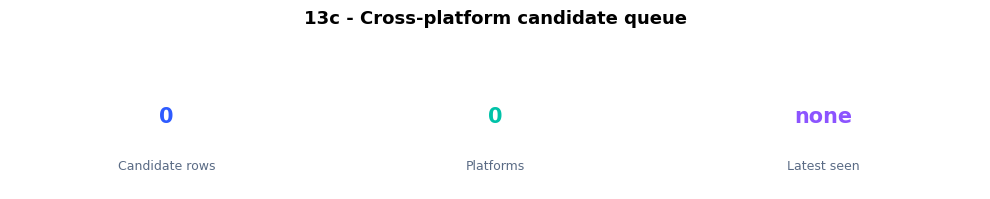

13c: no candidate evidence is available from sections 13a and 13b.


StatementMeta(MSGMedium, 596, 26, Finished, Available, Finished, False)

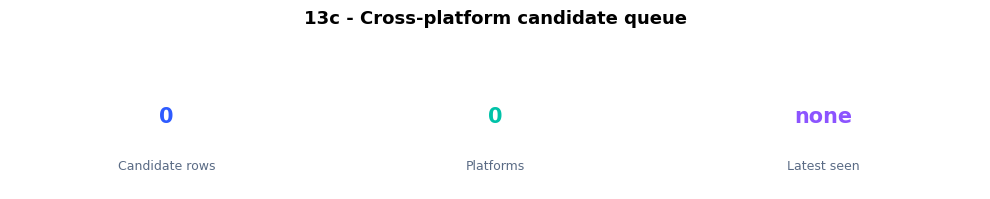

13c: no candidate evidence is available from sections 13a and 13b.


In [25]:
# Section 13c - Lean cross-platform SOC triage queue from sections 13a and 13b.
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
fnd_queue = globals().get("fnd_evidence")
cs_queue = globals().get("cs_evidence")
queue_schema = "Platform string, Signal string, Entity string, ConversationId string, Magnitude string, LastSeen timestamp"
triage_queue = spark.createDataFrame([], queue_schema)

if fnd_queue is not None:
    triage_queue = triage_queue.unionByName(fnd_queue.select(
        F.lit("Foundry").alias("Platform"),
        "Signal",
        F.col("AgentName").alias("Entity"),
        "ConversationId",
        "Magnitude",
        "LastSeen",
    ))
if cs_queue is not None:
    triage_queue = triage_queue.unionByName(cs_queue.select(
        F.lit("Copilot Studio").alias("Platform"),
        "Signal",
        "Entity",
        "ConversationId",
        "Magnitude",
        "LastSeen",
    ))

queue_stats = triage_queue.agg(
    F.count("*").alias("CandidateRows"),
    F.countDistinct("Platform").alias("Platforms"),
    F.max("LastSeen").alias("LatestSeen"),
).collect()[0]
candidate_rows = queue_stats["CandidateRows"] or 0
platforms = queue_stats["Platforms"] or 0
latest_seen = queue_stats["LatestSeen"]
latest_label = latest_seen.strftime("%Y-%m-%d %H:%M UTC") if latest_seen is not None else "none"

fig, axes = plt.subplots(1, 3, figsize=(10, 1.8))
for ax, (label, value), color in zip(
    axes,
    [("Candidate rows", f"{candidate_rows:,}"), ("Platforms", f"{platforms:,}"), ("Latest seen", latest_label)],
    PALETTE,
):
    ax.axis("off")
    ax.text(0.5, 0.62, value, ha="center", va="center", fontsize=15, fontweight="bold", color=color)
    ax.text(0.5, 0.2, label, ha="center", va="center", fontsize=9, color="#5A6B85")
fig.suptitle("13c - Cross-platform candidate queue", y=1.08, fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

if candidate_rows == 0:
    print("13c: no candidate evidence is available from sections 13a and 13b.")
else:
    category_counts = (triage_queue.groupBy("Platform", "Signal")
        .agg(F.count("*").alias("Candidates"))
        .filter(F.col("Candidates") > 0)
        .orderBy(F.desc("Candidates")).toPandas())
    if category_counts.empty:
        print("13c category chart: no nonempty candidate categories.")
    else:
        category_counts["Label"] = category_counts["Platform"].astype(str) + " | " + category_counts["Signal"].astype(str)
        fig, ax = plt.subplots(figsize=(12, max(3.2, 0.34 * len(category_counts))))
        colors = category_counts["Platform"].map({"Foundry": PALETTE[0], "Copilot Studio": PALETTE[1]}).fillna(PALETTE[7])
        ax.barh(category_counts["Label"][::-1], category_counts["Candidates"][::-1], color=colors[::-1])
        ax.set_title("Candidate count by platform and signal")
        ax.set_xlabel("Candidates")
        plt.tight_layout()
        plt.show()

    latest = triage_queue.orderBy(F.desc("LastSeen")).limit(25).toPandas()
    if latest.empty or latest["LastSeen"].isna().all():
        print("13c timeline: candidate rows have no timestamps.")
    else:
        latest = latest[latest["LastSeen"].notna()].copy()
        latest["Label"] = latest["Platform"].astype(str) + " | " + latest["Signal"].astype(str) + " | " + latest["Entity"].fillna("unknown").astype(str)
        positions = list(range(len(latest)))
        fig, ax = plt.subplots(figsize=(12, max(3.6, 0.3 * len(latest))))
        point_colors = latest["Platform"].map({"Foundry": PALETTE[0], "Copilot Studio": PALETTE[1]}).fillna(PALETTE[7])
        ax.scatter(pd.to_datetime(latest["LastSeen"]), positions, c=point_colors, s=48)
        ax.set_yticks(positions)
        ax.set_yticklabels(latest["Label"], fontsize=7)
        ax.set_title("Latest candidate evidence")
        ax.set_xlabel("Last seen (UTC)")
        plt.tight_layout()
        plt.show()

    print("Cross-platform candidate evidence (top 40, newest first)")
    show_limited(triage_queue.orderBy(F.desc("LastSeen")), 40)

## 14. Behavioral anomaly gap analysis

This section fills high-value anomaly gaps that can be supported by the notebook's **existing telemetry**. It keeps anomalies separate from incidents: every result is evidence for review, not a malicious verdict.

| Hunt | Detection logic | Source | Graphic |
| --- | --- | --- | --- |
| Dormant agent reactivation | Recent activity after at least 30 inactive days | `UnifiedAgentObservability` | Ranked inactivity-gap bar |
| Operating-hours deviation | Recent off-hours share rises at least 25 percentage points over baseline | `UnifiedAgentObservability` | Baseline-vs-recent dumbbell |
| New agent-to-agent edge | Source-to-target relationship first observed in the recent window | `UnifiedAgentObservability` | Ranked relationship bar + evidence table |
| New agent-to-tool edge | Agent uses a tool not observed in its baseline | Foundry `AppDependencies` | Ranked new-edge bar |
| Tool-call rate spike | Recent calls/day are at least 3x baseline and at least 10 calls | Foundry `AppDependencies` | Baseline-vs-recent rate scatter |
| Repetition-loop candidate | Same tool repeats at least 8 times in one conversation | Foundry `AppDependencies` | Ranked repetition bar + evidence table |
| New user-to-agent edge | Actor uses an agent not observed for that actor in the baseline | `UnifiedAgentObservability` | Ranked new-edge bar + evidence table |
| User activity-rate spike | Existing actor-agent pair rises to at least 3x its baseline rate | `UnifiedAgentObservability` | Baseline-vs-recent dumbbell |
| Operation expansion | Agent uses operation types not observed in its baseline | `UnifiedAgentObservability` | Ranked capability-expansion bar + evidence table |

Operation expansion is a **capability-change proxy**, not proof of sensitive-data access. Identity risk, sign-in geography, OAuth permission changes, Purview sensitivity, bulk document counts, and Defender incident correlation remain **data-source gaps**. They should be joined when those connectors are available, not inferred from observability metadata. Run sections 2 and 8 first; unavailable panels skip cleanly.

StatementMeta(MSGMedium, 5, 30, Finished, Available, Finished, False)

Dormant agents reactivated after at least 30 inactive days
+-------+---------+-------------+------------+------------+------------+
|AgentId|AgentName|ReactivatedAt|RecentEvents|PreviousSeen|InactiveDays|
+-------+---------+-------------+------------+------------+------------+
+-------+---------+-------------+------------+------------+------------+

Operating-hours deviations (recent off-hours share vs baseline)
+-------+----------+-------+------------+---------+---------+----------+------------+--------+
|AgentId|BaseEvents|BaseOff|RecentEvents|RecentOff|AgentName|BaseOffPct|RecentOffPct|DeltaPct|
+-------+----------+-------+------------+---------+---------+----------+------------+--------+
+-------+----------+-------+------------+---------+---------+----------+------------+--------+

New agent-to-agent relationships in the recent window
+----------+-------------+------------+---------------+------------+-----------+----------+
|SrcAgentId|TargetAgentId|SrcAgentName|TargetAgentName|In

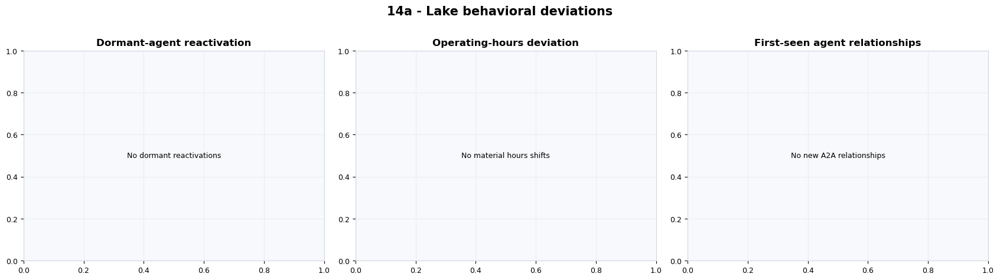

StatementMeta(MSGMedium, 594, 27, Finished, Available, Finished, False)

Dormant agents reactivated after at least 30 inactive days
+-------+---------+-------------+------------+------------+------------+
|AgentId|AgentName|ReactivatedAt|RecentEvents|PreviousSeen|InactiveDays|
+-------+---------+-------------+------------+------------+------------+
+-------+---------+-------------+------------+------------+------------+

Operating-hours deviations (recent off-hours share vs baseline)
+-------+----------+-------+------------+---------+---------+----------+------------+--------+
|AgentId|BaseEvents|BaseOff|RecentEvents|RecentOff|AgentName|BaseOffPct|RecentOffPct|DeltaPct|
+-------+----------+-------+------------+---------+---------+----------+------------+--------+
+-------+----------+-------+------------+---------+---------+----------+------------+--------+

New agent-to-agent relationships in the recent window
+------------------------------------+------------------------------------+---------------------------------------+----------------------------------

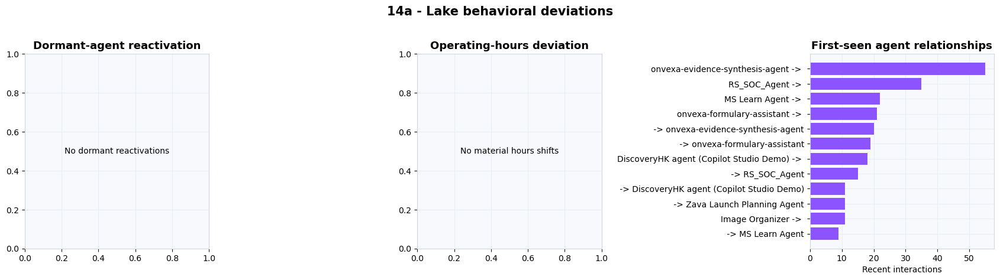

StatementMeta(MSGMedium, 596, 27, Finished, Available, Finished, False)

Dormant agents reactivated after at least 30 inactive days
+-------+---------+-------------+------------+------------+------------+
|AgentId|AgentName|ReactivatedAt|RecentEvents|PreviousSeen|InactiveDays|
+-------+---------+-------------+------------+------------+------------+
+-------+---------+-------------+------------+------------+------------+

Operating-hours deviations (recent off-hours share vs baseline)
+------------------------------------+----------+-------+------------+---------+--------------------------+----------+------------+--------+
|AgentId                             |BaseEvents|BaseOff|RecentEvents|RecentOff|AgentName                 |BaseOffPct|RecentOffPct|DeltaPct|
+------------------------------------+----------+-------+------------+---------+--------------------------+----------+------------+--------+
|5c6d5201-5ae1-4829-ac20-ba4a7aa95f59|22        |1      |22          |8        |Zava Launch Planning Agent|4.5       |36.4        |31.9    |
+-------------------

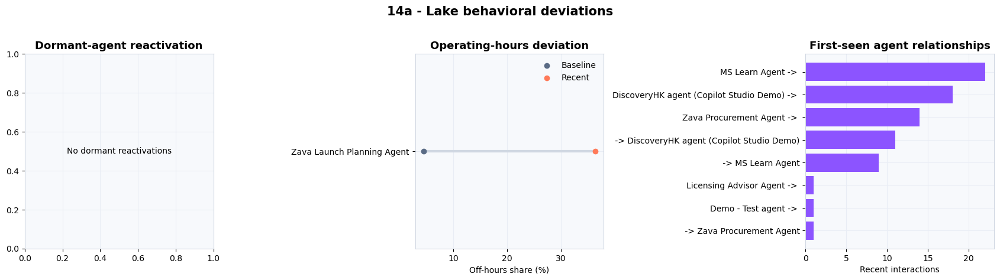

In [26]:
# Section 14a - lake behavioral deviations: dormant reactivation, hours shift, and new A2A edges.
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
ANOMALY_OFF_HOURS = (0, 1, 2, 3, 4, 5, 22, 23)
DORMANT_DAYS = 30
OFF_HOURS_DELTA = 0.25
MIN_PERIOD_EVENTS = 20

anomaly_cut = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)
baseline_lake = events.filter(F.col("EventTime") < F.lit(anomaly_cut))
recent_lake = events.filter(F.col("EventTime") >= F.lit(anomaly_cut))

history = (baseline_lake.filter(F.col("AgentId").isNotNull())
    .groupBy("AgentId").agg(F.max("EventTime").alias("PreviousSeen")))
recent_agents = (recent_lake.filter(F.col("AgentId").isNotNull())
    .groupBy("AgentId", "AgentName")
    .agg(F.min("EventTime").alias("ReactivatedAt"), F.count("*").alias("RecentEvents")))
dormant_reactivation = (recent_agents.join(history, "AgentId", "inner")
    .withColumn("InactiveDays", F.datediff("ReactivatedAt", "PreviousSeen"))
    .filter(F.col("InactiveDays") >= DORMANT_DAYS)
    .orderBy(F.desc("InactiveDays"), F.desc("RecentEvents")))

def period_hours(frame, prefix):
    return (frame.filter(F.col("AgentId").isNotNull())
        .groupBy("AgentId")
        .agg(F.count("*").alias(f"{prefix}Events"),
             F.sum(F.col("EventHour").isin(*ANOMALY_OFF_HOURS).cast("int")).alias(f"{prefix}Off")))

hours_shift = (period_hours(baseline_lake, "Base")
    .join(period_hours(recent_lake, "Recent"), "AgentId", "inner")
    .join(recent_agents.select("AgentId", "AgentName"), "AgentId", "left")
    .filter((F.col("BaseEvents") >= MIN_PERIOD_EVENTS) & (F.col("RecentEvents") >= MIN_PERIOD_EVENTS))
    .withColumn("BaseOffPct", F.round(100.0 * F.col("BaseOff") / F.col("BaseEvents"), 1))
    .withColumn("RecentOffPct", F.round(100.0 * F.col("RecentOff") / F.col("RecentEvents"), 1))
    .withColumn("DeltaPct", F.round(F.col("RecentOffPct") - F.col("BaseOffPct"), 1))
    .filter(F.col("DeltaPct") >= OFF_HOURS_DELTA * 100)
    .orderBy(F.desc("DeltaPct")))

edge_base = (baseline_lake.filter(F.col("SrcAgentId").isNotNull() & F.col("TargetAgentId").isNotNull())
    .select("SrcAgentId", "TargetAgentId").distinct())
new_a2a_edges = (recent_lake.filter(F.col("SrcAgentId").isNotNull() & F.col("TargetAgentId").isNotNull())
    .groupBy("SrcAgentId", "SrcAgentName", "TargetAgentId", "TargetAgentName")
    .agg(F.count("*").alias("Interactions"), F.min("EventTime").alias("FirstRecent"), F.max("EventTime").alias("LastRecent"))
    .join(edge_base, ["SrcAgentId", "TargetAgentId"], "left_anti")
    .orderBy(F.desc("Interactions")))

print("Dormant agents reactivated after at least 30 inactive days")
show_limited(dormant_reactivation, 30)
print("Operating-hours deviations (recent off-hours share vs baseline)")
show_limited(hours_shift, 30)
print("New agent-to-agent relationships in the recent window")
show_limited(new_a2a_edges, 30)

react_pd = dormant_reactivation.limit(12).toPandas()
hours_pd = hours_shift.limit(12).toPandas()
edge_pd = new_a2a_edges.limit(12).toPandas()
fig, axes = plt.subplots(1, 3, figsize=(17, 4.6))
fig.suptitle("14a - Lake behavioral deviations", fontsize=15, fontweight="bold", y=1.02)

if not react_pd.empty:
    labels = react_pd["AgentName"].fillna(react_pd["AgentId"]).astype(str)
    axes[0].barh(labels[::-1], react_pd["InactiveDays"][::-1], color=PALETTE[6])
    axes[0].set_xlabel("Inactive days before reactivation")
else:
    axes[0].text(0.5, 0.5, "No dormant reactivations", ha="center", va="center", transform=axes[0].transAxes)
axes[0].set_title("Dormant-agent reactivation")

if not hours_pd.empty:
    labels = hours_pd["AgentName"].fillna(hours_pd["AgentId"]).astype(str)
    positions = range(len(hours_pd))
    for pos, base_pct, recent_pct in zip(positions, hours_pd["BaseOffPct"], hours_pd["RecentOffPct"]):
        axes[1].plot([base_pct, recent_pct], [pos, pos], color="#D0D7E2", linewidth=3)
    axes[1].scatter(hours_pd["BaseOffPct"], list(positions), color=PALETTE[7], label="Baseline", zorder=3)
    axes[1].scatter(hours_pd["RecentOffPct"], list(positions), color=PALETTE[3], label="Recent", zorder=3)
    axes[1].set_yticks(list(positions))
    axes[1].set_yticklabels(labels)
    axes[1].legend(frameon=False)
    axes[1].set_xlabel("Off-hours share (%)")
else:
    axes[1].text(0.5, 0.5, "No material hours shifts", ha="center", va="center", transform=axes[1].transAxes)
axes[1].set_title("Operating-hours deviation")

if not edge_pd.empty:
    labels = (edge_pd["SrcAgentName"].fillna(edge_pd["SrcAgentId"]).astype(str) + " -> " +
              edge_pd["TargetAgentName"].fillna(edge_pd["TargetAgentId"]).astype(str))
    axes[2].barh(labels[::-1], edge_pd["Interactions"][::-1], color=PALETTE[2])
    axes[2].set_xlabel("Recent interactions")
else:
    axes[2].text(0.5, 0.5, "No new A2A relationships", ha="center", va="center", transform=axes[2].transAxes)
axes[2].set_title("First-seen agent relationships")
plt.tight_layout()
plt.show()

In [27]:
# Section 14b - Foundry tool deviations: new edges, call-rate spikes, and repetition-loop candidates.
import matplotlib.pyplot as plt

foundry14 = globals().get("foundry_spans")
TOOL_RATE_MULTIPLIER = 3.0
MIN_RECENT_TOOL_CALLS = 10
REPEATED_TOOL_THRESHOLD = 8

if foundry14 is None:
    print("14b: Foundry spans are unavailable. Run section 8 with WORKSPACE_NAME configured.")
else:
    baseline_tools = foundry14.filter(F.col("EventTime") < F.lit(anomaly_cut))
    recent_tools = foundry14.filter(F.col("EventTime") >= F.lit(anomaly_cut))
    baseline_days = max(1.0, LOOKBACK_DAYS - RECENT_HOURS / 24.0)
    recent_days = max(1.0 / 24.0, RECENT_HOURS / 24.0)

    known_agent_tools = (baseline_tools.filter(F.col("AgentName").isNotNull() & F.col("ToolName").isNotNull())
        .select("AgentName", "ToolName").distinct())
    new_agent_tools = (recent_tools.filter(F.col("AgentName").isNotNull() & F.col("ToolName").isNotNull())
        .groupBy("AgentName", "ToolName", "ToolType")
        .agg(F.count("*").alias("RecentCalls"), F.countDistinct("ConversationId").alias("Conversations"),
             F.min("EventTime").alias("FirstRecent"), F.max("EventTime").alias("LastRecent"))
        .join(known_agent_tools, ["AgentName", "ToolName"], "left_anti")
        .orderBy(F.desc("RecentCalls")))

    base_rate = (baseline_tools.filter(F.col("AgentName").isNotNull() & F.col("ToolName").isNotNull())
        .groupBy("AgentName", "ToolName").agg(F.count("*").alias("BaseCalls"))
        .withColumn("BaseCallsPerDay", F.col("BaseCalls") / F.lit(baseline_days)))
    recent_rate = (recent_tools.filter(F.col("AgentName").isNotNull() & F.col("ToolName").isNotNull())
        .groupBy("AgentName", "ToolName").agg(F.count("*").alias("RecentCalls"))
        .withColumn("RecentCallsPerDay", F.col("RecentCalls") / F.lit(recent_days)))
    tool_rate_spikes = (recent_rate.join(base_rate, ["AgentName", "ToolName"], "inner")
        .withColumn("RateRatio", F.when(F.col("BaseCallsPerDay") > 0,
                    F.col("RecentCallsPerDay") / F.col("BaseCallsPerDay")))
        .filter((F.col("RecentCalls") >= MIN_RECENT_TOOL_CALLS) &
                (F.col("RateRatio") >= TOOL_RATE_MULTIPLIER))
        .select("AgentName", "ToolName", "BaseCalls", "RecentCalls",
                F.round("BaseCallsPerDay", 2).alias("BaseCallsPerDay"),
                F.round("RecentCallsPerDay", 2).alias("RecentCallsPerDay"),
                F.round("RateRatio", 1).alias("RateRatio"))
        .orderBy(F.desc("RateRatio"), F.desc("RecentCalls")))

    repeated_tools = (recent_tools.filter(F.col("AgentName").isNotNull() & F.col("ToolName").isNotNull() &
                                           F.col("ConversationId").isNotNull())
        .groupBy("AgentName", "ConversationId", "ToolName")
        .agg(F.count("*").alias("Repeats"), F.min("EventTime").alias("FirstSeen"),
             F.max("EventTime").alias("LastSeen"))
        .filter(F.col("Repeats") >= REPEATED_TOOL_THRESHOLD)
        .orderBy(F.desc("Repeats")))

    print("New agent-to-tool relationships in the recent window")
    show_limited(new_agent_tools, 30)
    print("Tool-call rate spikes vs the historical baseline")
    show_limited(tool_rate_spikes, 30)
    print("Repetition-loop candidates (same tool repeated in one conversation)")
    show_limited(repeated_tools, 30)

    new_pd = new_agent_tools.limit(12).toPandas()
    spike_pd = tool_rate_spikes.limit(12).toPandas()
    loop_pd = repeated_tools.limit(12).toPandas()
    fig, axes = plt.subplots(1, 3, figsize=(17, 4.8))
    fig.suptitle("14b - Foundry tool behavioral deviations", fontsize=15, fontweight="bold", y=1.02)

    if not new_pd.empty:
        labels = new_pd["AgentName"].astype(str) + " -> " + new_pd["ToolName"].astype(str)
        axes[0].barh(labels[::-1], new_pd["RecentCalls"][::-1], color=PALETTE[1])
        axes[0].set_xlabel("Recent calls")
    else:
        axes[0].text(0.5, 0.5, "No new agent-tool edges", ha="center", va="center", transform=axes[0].transAxes)
    axes[0].set_title("First-seen agent-to-tool relationships")

    if not spike_pd.empty:
        labels = spike_pd["AgentName"].astype(str) + " / " + spike_pd["ToolName"].astype(str)
        positions = range(len(spike_pd))
        for pos, base_rate_value, recent_rate_value in zip(positions, spike_pd["BaseCallsPerDay"], spike_pd["RecentCallsPerDay"]):
            axes[1].plot([base_rate_value, recent_rate_value], [pos, pos], color="#D0D7E2", linewidth=3)
        axes[1].scatter(spike_pd["BaseCallsPerDay"], list(positions), color=PALETTE[7], label="Baseline", zorder=3)
        axes[1].scatter(spike_pd["RecentCallsPerDay"], list(positions), color=PALETTE[3], label="Recent", zorder=3)
        axes[1].set_yticks(list(positions))
        axes[1].set_yticklabels(labels)
        axes[1].legend(frameon=False)
        axes[1].set_xlabel("Calls per day")
    else:
        axes[1].text(0.5, 0.5, "No tool-rate spikes", ha="center", va="center", transform=axes[1].transAxes)
    axes[1].set_title("Tool-call rate deviation")

    if not loop_pd.empty:
        labels = loop_pd["AgentName"].astype(str) + " / " + loop_pd["ToolName"].astype(str)
        axes[2].barh(labels[::-1], loop_pd["Repeats"][::-1], color=PALETTE[6])
        axes[2].axvline(REPEATED_TOOL_THRESHOLD, color=PALETTE[7], linestyle="--", linewidth=1)
        axes[2].set_xlabel("Calls in one conversation")
    else:
        axes[2].text(0.5, 0.5, "No repetition-loop candidates", ha="center", va="center", transform=axes[2].transAxes)
    axes[2].set_title("Repeated tool use per conversation")
    plt.tight_layout()
    plt.show()

StatementMeta(MSGMedium, 596, 28, Finished, Available, Finished, False)

14b: Foundry spans are unavailable. Run section 8 with WORKSPACE_NAME configured.


StatementMeta(MSGMedium, 5, 32, Finished, Available, Finished, False)

New actor-to-agent relationships in the recent window
+-----------+-------+-------------+---------+------------+-------------+-----------+----------+
|ActorUserId|AgentId|ActorUsername|AgentName|RecentEvents|Conversations|FirstRecent|LastRecent|
+-----------+-------+-------------+---------+------------+-------------+-----------+----------+
+-----------+-------+-------------+---------+------------+-------------+-----------+----------+

Actor-to-agent activity-rate spikes vs historical baseline
+------------------------------------+--------------------------------------+------------------------------------+--------------+----------+------------+----------------+------------------+---------+
|ActorUserId                         |ActorUsername                         |AgentId                             |AgentName     |BaseEvents|RecentEvents|BaseEventsPerDay|RecentEventsPerDay|RateRatio|
+------------------------------------+--------------------------------------+-------------------------

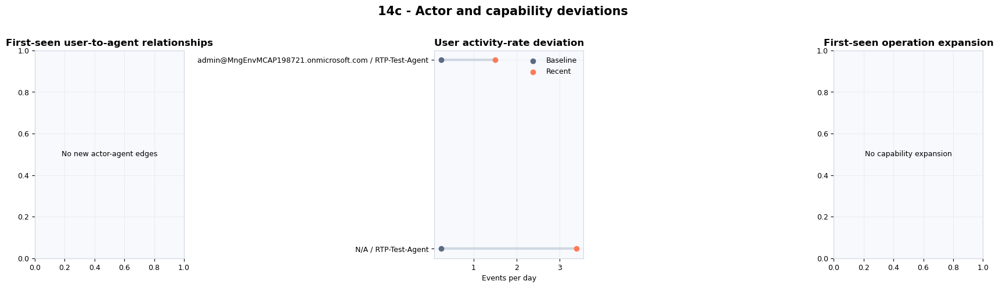

StatementMeta(MSGMedium, 594, 29, Finished, Available, Finished, False)

New actor-to-agent relationships in the recent window
+------------------------------------+------------------------------------+------------------------+---------------------------------------+------------+-------------+-------------------+-------------------+
|ActorUserId                         |AgentId                             |ActorUsername           |AgentName                              |RecentEvents|Conversations|FirstRecent        |LastRecent         |
+------------------------------------+------------------------------------+------------------------+---------------------------------------+------------+-------------+-------------------+-------------------+
|00000000-0000-0000-0000-000000000000|00000000-0000-0000-0000-000000000000|N/A                     |🧦 Graph Explorer                      |84          |4            |2026-08-27 03:14:21|2026-08-27 22:47:24|
|211eef16-a63a-4e90-b422-b64170f7e392|00000000-0000-0000-0000-000000000000|u1863@int.zava-corp.com |PIO Agent Build

/tmp/ipykernel_6096/3237239214.py:102: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


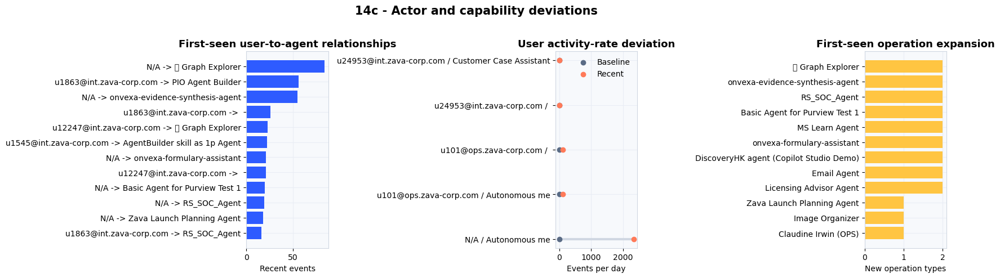

StatementMeta(MSGMedium, 596, 29, Finished, Available, Finished, False)

New actor-to-agent relationships in the recent window
+------------------------------------+------------------------------------+------------------------+---------------------------------------+------------+-------------+-------------------+-------------------+
|ActorUserId                         |AgentId                             |ActorUsername           |AgentName                              |RecentEvents|Conversations|FirstRecent        |LastRecent         |
+------------------------------------+------------------------------------+------------------------+---------------------------------------+------------+-------------+-------------------+-------------------+
|00000000-0000-0000-0000-000000000000|00000000-0000-0000-0000-000000000000|N/A                     |🧦 Graph Explorer                      |84          |4            |2026-08-27 03:14:21|2026-08-27 22:47:24|
|6455b966-c587-44ac-a8bd-d4a344713a19|00000000-0000-0000-0000-000000000000|u12247@int.zava-corp.com|🧦 Graph Explore

/tmp/ipykernel_5836/3237239214.py:102: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/trusted-service-user/cluster-env/synapse-clonedenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129510 (\N{SOCKS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


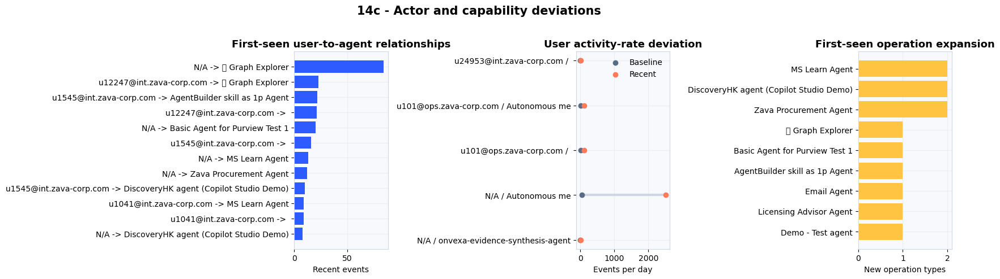

In [28]:
# Section 14c - actor and operation deviations: new users, activity-rate shifts, and capability expansion.
import matplotlib.pyplot as plt

ACTOR_RATE_MULTIPLIER = 3.0
MIN_RECENT_ACTOR_EVENTS = 10
actor_baseline_days = max(1.0, LOOKBACK_DAYS - RECENT_HOURS / 24.0)
actor_recent_days = max(1.0 / 24.0, RECENT_HOURS / 24.0)

known_actor_agents = (baseline_lake
    .filter(F.col("ActorUserId").isNotNull() & F.col("AgentId").isNotNull())
    .select("ActorUserId", "AgentId").distinct())
new_actor_agents = (recent_lake
    .filter(F.col("ActorUserId").isNotNull() & F.col("AgentId").isNotNull())
    .groupBy("ActorUserId", "ActorUsername", "AgentId", "AgentName")
    .agg(F.count("*").alias("RecentEvents"), F.countDistinct("ConversationId").alias("Conversations"),
         F.min("EventTime").alias("FirstRecent"), F.max("EventTime").alias("LastRecent"))
    .join(known_actor_agents, ["ActorUserId", "AgentId"], "left_anti")
    .orderBy(F.desc("RecentEvents")))

base_actor_rate = (baseline_lake
    .filter(F.col("ActorUserId").isNotNull() & F.col("AgentId").isNotNull())
    .groupBy("ActorUserId", "AgentId").agg(F.count("*").alias("BaseEvents"))
    .withColumn("BaseEventsPerDay", F.col("BaseEvents") / F.lit(actor_baseline_days)))
recent_actor_rate = (recent_lake
    .filter(F.col("ActorUserId").isNotNull() & F.col("AgentId").isNotNull())
    .groupBy("ActorUserId", "ActorUsername", "AgentId", "AgentName")
    .agg(F.count("*").alias("RecentEvents"))
    .withColumn("RecentEventsPerDay", F.col("RecentEvents") / F.lit(actor_recent_days)))
actor_rate_spikes = (recent_actor_rate
    .join(base_actor_rate, ["ActorUserId", "AgentId"], "inner")
    .withColumn("RateRatio", F.when(F.col("BaseEventsPerDay") > 0,
                F.col("RecentEventsPerDay") / F.col("BaseEventsPerDay")))
    .filter((F.col("RecentEvents") >= MIN_RECENT_ACTOR_EVENTS) &
            (F.col("RateRatio") >= ACTOR_RATE_MULTIPLIER))
    .select("ActorUserId", "ActorUsername", "AgentId", "AgentName", "BaseEvents", "RecentEvents",
            F.round("BaseEventsPerDay", 2).alias("BaseEventsPerDay"),
            F.round("RecentEventsPerDay", 2).alias("RecentEventsPerDay"),
            F.round("RateRatio", 1).alias("RateRatio"))
    .orderBy(F.desc("RateRatio"), F.desc("RecentEvents")))

known_agent_operations = (baseline_lake
    .filter(F.col("AgentId").isNotNull() & F.col("Operation").isNotNull())
    .select("AgentId", "Operation").distinct())
new_agent_operations = (recent_lake
    .filter(F.col("AgentId").isNotNull() & F.col("Operation").isNotNull())
    .groupBy("AgentId", "AgentName", "Operation")
    .agg(F.count("*").alias("RecentEvents"), F.countDistinct("ActorUserId").alias("Actors"),
         F.min("EventTime").alias("FirstRecent"))
    .join(known_agent_operations, ["AgentId", "Operation"], "left_anti"))
operation_expansion = (new_agent_operations.groupBy("AgentId", "AgentName")
    .agg(F.countDistinct("Operation").alias("NewOperations"), F.sum("RecentEvents").alias("EventsOnNewOperations"),
         F.sort_array(F.collect_set("Operation")).alias("Operations"))
    .orderBy(F.desc("NewOperations"), F.desc("EventsOnNewOperations")))

print("New actor-to-agent relationships in the recent window")
show_limited(new_actor_agents, 30)
print("Actor-to-agent activity-rate spikes vs historical baseline")
show_limited(actor_rate_spikes, 30)
print("Agents using operations not observed in their baseline")
show_limited(operation_expansion, 30)

new_actor_pd = new_actor_agents.limit(12).toPandas()
actor_spike_pd = actor_rate_spikes.limit(12).toPandas()
operation_pd = operation_expansion.limit(12).toPandas()
fig, axes = plt.subplots(1, 3, figsize=(17, 4.8))
fig.suptitle("14c - Actor and capability deviations", fontsize=15, fontweight="bold", y=1.02)

if not new_actor_pd.empty:
    actor_labels = new_actor_pd["ActorUsername"].fillna(new_actor_pd["ActorUserId"]).astype(str)
    agent_labels = new_actor_pd["AgentName"].fillna(new_actor_pd["AgentId"]).astype(str)
    labels = actor_labels + " -> " + agent_labels
    axes[0].barh(labels[::-1], new_actor_pd["RecentEvents"][::-1], color=PALETTE[0])
    axes[0].set_xlabel("Recent events")
else:
    axes[0].text(0.5, 0.5, "No new actor-agent edges", ha="center", va="center", transform=axes[0].transAxes)
axes[0].set_title("First-seen user-to-agent relationships")

if not actor_spike_pd.empty:
    actor_labels = actor_spike_pd["ActorUsername"].fillna(actor_spike_pd["ActorUserId"]).astype(str)
    agent_labels = actor_spike_pd["AgentName"].fillna(actor_spike_pd["AgentId"]).astype(str)
    labels = actor_labels + " / " + agent_labels
    positions = range(len(actor_spike_pd))
    for pos, base_value, recent_value in zip(positions, actor_spike_pd["BaseEventsPerDay"], actor_spike_pd["RecentEventsPerDay"]):
        axes[1].plot([base_value, recent_value], [pos, pos], color="#D0D7E2", linewidth=3)
    axes[1].scatter(actor_spike_pd["BaseEventsPerDay"], list(positions), color=PALETTE[7], label="Baseline", zorder=3)
    axes[1].scatter(actor_spike_pd["RecentEventsPerDay"], list(positions), color=PALETTE[3], label="Recent", zorder=3)
    axes[1].set_yticks(list(positions))
    axes[1].set_yticklabels(labels)
    axes[1].legend(frameon=False)
    axes[1].set_xlabel("Events per day")
else:
    axes[1].text(0.5, 0.5, "No actor-rate spikes", ha="center", va="center", transform=axes[1].transAxes)
axes[1].set_title("User activity-rate deviation")

if not operation_pd.empty:
    labels = operation_pd["AgentName"].fillna(operation_pd["AgentId"]).astype(str)
    axes[2].barh(labels[::-1], operation_pd["NewOperations"][::-1], color=PALETTE[4])
    axes[2].set_xlabel("New operation types")
else:
    axes[2].text(0.5, 0.5, "No capability expansion", ha="center", va="center", transform=axes[2].transAxes)
axes[2].set_title("First-seen operation expansion")
plt.tight_layout()
plt.show()

## 15. Microsoft 365 Copilot threat hunting (`CopilotActivity`)

This section complements Copilot Studio telemetry with Microsoft 365 Copilot audit activity from the Sentinel workspace. It follows the repository's active `CopilotActivity` use cases, but implements only fields confirmed in this tenant and keeps prompt/response content hidden.

**Verified tenant schema (30-day probe):** interaction identity, app/model/region metadata, `ThreadId`, `ConversationId`, `Messages[].{Id,isPrompt,JailbreakDetected}`, `AISystemPlugin[].{Id,Name}`, and `AccessedResources[].{Id,Name,Type,Action,SiteUrl,XPIADetected,PolicyDetails,SensitivityLabelId}`. The tenant also emits `DLPEvaluationDeferred`, target-agent metadata, and model-transparency arrays.

| Hunt / board | Signal | Interpretation |
| --- | --- | --- |
| Prompt Shield verdicts | `Messages[].JailbreakDetected` | Native jailbreak evidence; counts only |
| Indirect prompt injection | `AccessedResources[].XPIADetected` | Native XPIA evidence; zero is a valid result |
| DLP / sensitive-resource exposure | `PolicyDetails`, sensitivity IDs, deferred DLP | Policy metadata or incomplete DLP evaluation requiring review |
| Resource diversity burst | Distinct sites/types per actor and thread | Broad grounding can indicate reconnaissance or synthesis |
| Resource access drift | Resource types first seen in the recent window | New access behavior relative to the selected baseline |
| Exfiltration-chain proxy | Policy hit + broad sites + high message count in one thread | Correlated triage signal, not proof of exfiltration |
| Plugin novelty / spike | First-seen plugin or recent-to-baseline rate increase | Tool-mix deviation; approval status requires a watchlist |
| Usage and pacing anomaly | Message cardinality and tight interaction intervals | Token/runaway-loop proxy because token counts are absent |
| Trace/thread anomaly | Long/high-cardinality threads | Trace-shape proxy because `TraceStepId` is absent |
| Admin/config chain | Settings, plugin, or prompt-book record followed by abuse | Renders empty when the tenant emits interactions only |

**Coverage limits:** prompt/response text, per-call status, token counts, delegation lineage, participants, and stable structured guardrail/context fields are not present in this sample. Therefore text-regex jailbreak/injection, response quality/toxicity, API failure-rate, cross-tenant guest, and true token-cost hunts are intentionally omitted. Approved-plugin and trusted-RAG decisions also require watchlists; absent watchlists are reported as telemetry-only novelty, never policy violations.

In [29]:
# Section 15a - normalize Microsoft 365 Copilot audit activity without exposing prompt/response content.
from pyspark.sql.types import ArrayType, BooleanType, StructField, StructType

M365_ADMIN_RECORD_TYPES = [
    "UpdateCopilotSettings",
    "CreateCopilotPlugin", "UpdateCopilotPlugin", "EnableCopilotPlugin", "DisableCopilotPlugin",
    "CreateCopilotPromptBook", "UpdateCopilotPromptBook", "DeleteCopilotPromptBook",
]
MESSAGE_SCHEMA = ArrayType(StructType([
    StructField("Id", StringType()),
    StructField("isPrompt", BooleanType()),
    StructField("JailbreakDetected", BooleanType()),
]))
PLUGIN_SCHEMA = ArrayType(StructType([
    StructField("Id", StringType()),
    StructField("Name", StringType()),
]))
RESOURCE_SCHEMA = ArrayType(StructType([
    StructField("Id", StringType()),
    StructField("Name", StringType()),
    StructField("Type", StringType()),
    StructField("Action", StringType()),
    StructField("SiteUrl", StringType()),
    StructField("XPIADetected", BooleanType()),
    StructField("SensitivityLabelId", StringType()),
]))

copilot_activity_raw = read_workspace_table("CopilotActivity")
m365_interactions = m365_messages = m365_plugins = m365_resources = None

if copilot_activity_raw is None:
    print("15a: CopilotActivity is unavailable. Enable the Microsoft Copilot connector and keep the table on Analytics plan.")
else:
    m365 = (copilot_activity_raw
        .withColumn("EventTime", F.to_timestamp("TimeGenerated"))
        .withColumn("LLMJson", F.col("LLMEventData").cast("string"))
        .withColumn("ThreadId", json_value("LLMEventData", ["$.ThreadId"]))
        .withColumn("ConversationId", json_value("LLMEventData", ["$.ConversationId", "$.ThreadId"]))
        .withColumn("TargetAgentName", json_value("LLMEventData", ["$.TargetAgentName"]))
        .withColumn("TargetAgentId", json_value("LLMEventData", ["$.TargetPlatformAgentId", "$.PlatformAgentId"]))
        .withColumn("DLPDeferred", F.coalesce(json_value("LLMEventData", ["$.DLPEvaluationDeferred"]).cast("boolean"), F.lit(False)))
        .withColumn("SensitivityLabelId", json_value("LLMEventData", ["$.SensitivityLabelId"]))
        .withColumn("Model", F.coalesce(
            first_existing(copilot_activity_raw, ["AIModelName"]),
            json_value("LLMEventData", ["$.ModelTransparencyDetails[0].ModelName"])))
        .withColumn("Actor", F.coalesce(
            first_existing(copilot_activity_raw, ["ActorName", "ActorUserId"]), F.lit("unknown")))
        .withColumn("Agent", F.coalesce(
            first_existing(copilot_activity_raw, ["AgentName", "AgentId"]),
            json_value("LLMEventData", ["$.TargetAgentName"]), F.lit("Microsoft 365 Copilot")))
        .withColumn("MessagesArray", F.from_json(json_value("LLMEventData", ["$.Messages"]), MESSAGE_SCHEMA))
        .withColumn("PluginsArray", F.from_json(json_value("LLMEventData", ["$.AISystemPlugin"]), PLUGIN_SCHEMA))
        .withColumn("ResourcesArray", F.from_json(json_value("LLMEventData", ["$.AccessedResources"]), RESOURCE_SCHEMA))
        .withColumn("MessageCount", F.coalesce(F.size("MessagesArray"), F.lit(0)))
        .withColumn("PluginCount", F.coalesce(F.size("PluginsArray"), F.lit(0)))
        .withColumn("ResourceCount", F.coalesce(F.size("ResourcesArray"), F.lit(0)))
        .withColumn("HasPolicyMetadata", F.col("LLMJson").rlike(
            '(?i)"PolicyDetails"\\s*:\\s*(?!null|\\[\\s*\\]|\\{\\s*\\})'))
        .withColumn("HasSensitivity", F.col("SensitivityLabelId").isNotNull() |
                    F.col("LLMJson").rlike('(?i)"SensitivityLabelId"\\s*:\\s*"[^"\\s]+"'))
        .withColumn("IsAdminChange", F.col("RecordType").isin(*M365_ADMIN_RECORD_TYPES))
        .withColumn("EventDate", F.to_date("EventTime"))
        .withColumn("EventHour", F.hour("EventTime")))

    m365_interactions = m365.filter(F.col("RecordType") == "CopilotInteraction")
    m365_messages = (m365_interactions
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId", F.explode_outer("MessagesArray").alias("Message"))
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId",
                F.col("Message.Id").alias("MessageId"), F.col("Message.isPrompt").alias("IsPrompt"),
                F.coalesce(F.col("Message.JailbreakDetected"), F.lit(False)).alias("JailbreakDetected"))
        .filter(F.col("MessageId").isNotNull() | F.col("JailbreakDetected")))
    m365_plugins = (m365_interactions
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId", F.explode_outer("PluginsArray").alias("Plugin"))
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId",
                F.col("Plugin.Id").alias("PluginId"), F.col("Plugin.Name").alias("PluginName"))
        .filter(F.col("PluginId").isNotNull() | F.col("PluginName").isNotNull())
        .withColumn("PluginKey", F.coalesce("PluginName", "PluginId")))
    m365_resources = (m365_interactions
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId", "HasPolicyMetadata",
                F.explode_outer("ResourcesArray").alias("Resource"))
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId", "HasPolicyMetadata",
                F.col("Resource.Id").alias("ResourceId"), F.col("Resource.Name").alias("ResourceName"),
                F.col("Resource.Type").alias("ResourceType"), F.col("Resource.Action").alias("ResourceAction"),
                F.col("Resource.SiteUrl").alias("SiteUrl"),
                F.coalesce(F.col("Resource.XPIADetected"), F.lit(False)).alias("XPIADetected"),
                F.col("Resource.SensitivityLabelId").alias("ResourceSensitivityLabelId"))
        .filter(F.col("ResourceId").isNotNull() | F.col("ResourceName").isNotNull() |
                F.col("ResourceType").isNotNull() | F.col("SiteUrl").isNotNull()))

    counts = m365.agg(
        F.count("*").alias("Rows"),
        F.sum((F.col("RecordType") == "CopilotInteraction").cast("int")).alias("Interactions"),
        F.sum(F.col("IsAdminChange").cast("int")).alias("AdminChanges"),
        F.sum("MessageCount").alias("Messages"), F.sum("PluginCount").alias("PluginUses"),
        F.sum("ResourceCount").alias("ResourceAccesses")).collect()[0]
    print("15a normalized:", {name: counts[name] or 0 for name in counts.asDict()})
    print("Record types observed")
    show_limited(m365.groupBy("RecordType").count().orderBy(F.desc("count")), 20)

StatementMeta(MSGMedium, 5, 33, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Loading table: CopilotActivity"}
{"Level": "INFO", "TraceId": "61fa170b-2baa-4116-866e-6d51f9350e3c", "Message": "Successfully loaded table CopilotActivity"}
15a normalized: {'Rows': 90, 'Interactions': 90, 'AdminChanges': 0, 'Messages': 204, 'PluginUses': 0, 'ResourceAccesses': 176}
Record types observed
+------------------+-----+
|RecordType        |count|
+------------------+-----+
|CopilotInteraction|90   |
+------------------+-----+



StatementMeta(MSGMedium, 594, 30, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "Message": "Loading table: CopilotActivity"}
{"Level": "INFO", "TraceId": "1193f039-390a-4d8e-9c84-67f0f08d5895", "Message": "Successfully loaded table CopilotActivity"}
15a normalized: {'Rows': 1829340, 'Interactions': 1822253, 'AdminChanges': 5381, 'Messages': 991025, 'PluginUses': -1826293, 'ResourceAccesses': -942624}
Record types observed
+-------------------------+-------+
|RecordType               |count  |
+-------------------------+-------+
|CopilotInteraction       |1822279|
|EnableCopilotPlugin      |3562   |
|DisableCopilotPlugin     |1263   |
|CopilotAgentManagement   |971    |
|CopilotForSecurityTrigger|603    |
|CreateCopilotPlugin      |467    |
|DeleteCopilotPlugin      |132    |
|CreateCopilotPromptBook  |31     |
|UpdateCopilotSettings    |29     |
|UpdateCopilotPlugin      |27     |
|DeleteCopilotPromptBook  |1      |
|UpdateCopilotPromptBook  |1      |
+-------------------------+-------+



StatementMeta(MSGMedium, 596, 30, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table CopilotActivity"}
15a normalized: {'Rows': 1766417, 'Interactions': 1759415, 'AdminChanges': 5322, 'Messages': 1045752, 'PluginUses': -1763407, 'ResourceAccesses': -947798}
Record types observed
+-------------------------+-------+
|RecordType               |count  |
+-------------------------+-------+
|CopilotInteraction       |1759428|
|EnableCopilotPlugin      |3529   |
|DisableCopilotPlugin     |1252   |
|CopilotAgentManagement   |948    |
|CopilotForSecurityTrigger|604    |
|CreateCopilotPlugin      |455    |
|DeleteCopilotPlugin      |128    |
|CreateCopilotPromptBook  |31     |
|UpdateCopilotSettings    |27     |
|UpdateCopilotPlugin      |26     |
|UpdateCopilotPromptBook  |1      |
|DeleteCopilotPromptBook  |1      |
+-------------------------+-------+



In [30]:
# Section 15b - confirmed-field Microsoft 365 Copilot hunts.
M365_DIVERSITY_SITES = 10
M365_DIVERSITY_RESOURCES = 20
M365_LONG_THREAD_MESSAGES = 50
M365_RAPID_INTERVAL_SECONDS = 60
M365_RAPID_MIN_INTERACTIONS = 6
M365_PLUGIN_RATE_MULTIPLIER = 5.0
M365_PLUGIN_MIN_RECENT = 3

m365_jailbreak = m365_xpia = m365_sensitive = None
m365_resource_burst = m365_resource_drift = m365_exfil_proxy = None
m365_plugin_drift = m365_message_spikes = m365_pacing = m365_trace_anomalies = None
m365_config_abuse = None

if m365_interactions is None:
    print("15b: run section 15a after section 8; no CopilotActivity frame is available.")
else:
    recent_cut15 = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)
    base15 = m365_interactions.filter(F.col("EventTime") < F.lit(recent_cut15))
    recent15 = m365_interactions.filter(F.col("EventTime") >= F.lit(recent_cut15))
    base_days15 = max(1.0, LOOKBACK_DAYS - RECENT_HOURS / 24.0)
    recent_days15 = max(1.0 / 24.0, RECENT_HOURS / 24.0)

    m365_jailbreak = (m365_messages.filter(F.col("JailbreakDetected"))
        .groupBy("Actor", "Agent", "ThreadId", "ConversationId")
        .agg(F.countDistinct("MessageId").alias("FlaggedMessages"),
             F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
        .orderBy(F.desc("FlaggedMessages"), F.desc("LastSeen")))

    m365_xpia = (m365_resources.filter(F.col("XPIADetected"))
        .groupBy("Actor", "Agent", "ThreadId", "ConversationId", "ResourceType", "SiteUrl")
        .agg(F.count("*").alias("FlaggedResources"), F.max("EventTime").alias("LastSeen"))
        .orderBy(F.desc("FlaggedResources"), F.desc("LastSeen")))

    m365_sensitive = (m365_interactions
        .filter(F.col("HasPolicyMetadata") | F.col("HasSensitivity") | F.col("DLPDeferred"))
        .select("EventTime", "Actor", "Agent", "ThreadId", "ConversationId", "HasPolicyMetadata",
                "HasSensitivity", "DLPDeferred", "ResourceCount", "MessageCount")
        .orderBy(F.desc("EventTime")))

    thread_resources = (m365_resources.filter(F.col("ThreadId").isNotNull())
        .groupBy("Actor", "Agent", "ThreadId", "ConversationId")
        .agg(F.count("*").alias("ResourceAccesses"), F.countDistinct("SiteUrl").alias("DistinctSites"),
             F.countDistinct("ResourceType").alias("DistinctTypes"),
             F.collect_set("ResourceType").alias("ResourceTypes"), F.max("EventTime").alias("LastSeen")))
    m365_resource_burst = (thread_resources
        .filter((F.col("DistinctSites") >= M365_DIVERSITY_SITES) |
                (F.col("ResourceAccesses") >= M365_DIVERSITY_RESOURCES))
        .orderBy(F.desc("DistinctSites"), F.desc("ResourceAccesses")))

    known_resource_types = (m365_resources.filter((F.col("EventTime") < F.lit(recent_cut15)) &
                                                   F.col("ResourceType").isNotNull())
                            .select("Actor", "Agent", "ResourceType").distinct())
    m365_resource_drift = (m365_resources.filter((F.col("EventTime") >= F.lit(recent_cut15)) &
                                                  F.col("ResourceType").isNotNull())
        .groupBy("Actor", "Agent", "ResourceType")
        .agg(F.count("*").alias("RecentAccesses"), F.countDistinct("SiteUrl").alias("DistinctSites"),
             F.min("EventTime").alias("FirstRecent"), F.max("EventTime").alias("LastRecent"))
        .join(known_resource_types, ["Actor", "Agent", "ResourceType"], "left_anti")
        .orderBy(F.desc("RecentAccesses"), F.desc("DistinctSites")))

    thread_activity = (m365_interactions.filter(F.col("ThreadId").isNotNull())
        .groupBy("Actor", "Agent", "ThreadId", "ConversationId")
        .agg(F.count("*").alias("Interactions"), F.sum("MessageCount").alias("Messages"),
             F.sum("ResourceCount").alias("Resources"), F.sum("PluginCount").alias("PluginUses"),
             F.max(F.col("HasPolicyMetadata").cast("int")).alias("PolicyHit"),
             F.max(F.col("HasSensitivity").cast("int")).alias("SensitivityHit"),
             F.max(F.col("DLPDeferred").cast("int")).alias("DLPDeferred"),
             F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen")))
    m365_exfil_proxy = (thread_activity.join(
            thread_resources.select("Actor", "Agent", "ThreadId", "DistinctSites"),
            ["Actor", "Agent", "ThreadId"], "left")
        .fillna({"DistinctSites": 0})
        .filter(((F.col("PolicyHit") > 0) | (F.col("SensitivityHit") > 0)) &
                (F.col("DistinctSites") >= 5) & (F.col("Messages") >= 50))
        .orderBy(F.desc("DistinctSites"), F.desc("Messages")))

    known_plugins = (m365_plugins.filter(F.col("EventTime") < F.lit(recent_cut15))
                     .select("Actor", "Agent", "PluginKey").distinct())
    plugin_base_rate = (m365_plugins.filter(F.col("EventTime") < F.lit(recent_cut15))
        .groupBy("Actor", "Agent", "PluginKey").agg(F.count("*").alias("BaseUses"))
        .withColumn("BasePerDay", F.col("BaseUses") / F.lit(base_days15)))
    plugin_recent_rate = (m365_plugins.filter(F.col("EventTime") >= F.lit(recent_cut15))
        .groupBy("Actor", "Agent", "PluginKey").agg(F.count("*").alias("RecentUses"), F.min("EventTime").alias("FirstRecent"))
        .withColumn("RecentPerDay", F.col("RecentUses") / F.lit(recent_days15)))
    m365_plugin_drift = (plugin_recent_rate.join(plugin_base_rate, ["Actor", "Agent", "PluginKey"], "left")
        .join(known_plugins.withColumn("WasKnown", F.lit(True)), ["Actor", "Agent", "PluginKey"], "left")
        .withColumn("RateRatio", F.when(F.col("BasePerDay") > 0, F.col("RecentPerDay") / F.col("BasePerDay")))
        .withColumn("IsNewPlugin", F.col("WasKnown").isNull())
        .filter(F.col("IsNewPlugin") | ((F.col("RecentUses") >= M365_PLUGIN_MIN_RECENT) &
                                        (F.col("RateRatio") >= M365_PLUGIN_RATE_MULTIPLIER)))
        .orderBy(F.desc("IsNewPlugin"), F.desc("RateRatio"), F.desc("RecentUses")))

    message_baseline = (base15.groupBy("Actor", "Agent")
        .agg(F.avg("MessageCount").alias("BaseAvgMessages"), F.stddev_pop("MessageCount").alias("BaseStdMessages")))
    m365_message_spikes = (recent15.join(message_baseline, ["Actor", "Agent"], "inner")
        .withColumn("MessageThreshold", F.greatest(F.lit(10.0),
                    F.col("BaseAvgMessages") + 3.0 * F.coalesce("BaseStdMessages", F.lit(0.0))))
        .filter(F.col("MessageCount") >= F.col("MessageThreshold"))
        .select("EventTime", "Actor", "Agent", "ThreadId", "MessageCount",
                F.round("BaseAvgMessages", 1).alias("BaseAvgMessages"),
                F.round("MessageThreshold", 1).alias("MessageThreshold"))
        .orderBy(F.desc("MessageCount")))

    pacing_window = Window.partitionBy("Actor", "Agent", "ThreadId").orderBy("EventTime")
    paced = (m365_interactions.filter(F.col("ThreadId").isNotNull())
        .withColumn("PreviousTime", F.lag("EventTime").over(pacing_window))
        .withColumn("GapSeconds", F.col("EventTime").cast("long") - F.col("PreviousTime").cast("long")))
    m365_pacing = (paced.groupBy("Actor", "Agent", "ThreadId")
        .agg(F.count("*").alias("Interactions"),
             F.sum((F.col("GapSeconds") <= M365_RAPID_INTERVAL_SECONDS).cast("int")).alias("RapidIntervals"),
             F.round(F.avg("GapSeconds"), 1).alias("AvgGapSeconds"),
             F.min("EventTime").alias("FirstSeen"), F.max("EventTime").alias("LastSeen"))
        .filter((F.col("Interactions") >= M365_RAPID_MIN_INTERACTIONS) &
                (F.col("RapidIntervals") >= M365_RAPID_MIN_INTERACTIONS - 1))
        .orderBy(F.desc("RapidIntervals"), F.asc("AvgGapSeconds")))

    m365_trace_anomalies = (thread_activity
        .filter((F.col("Messages") >= M365_LONG_THREAD_MESSAGES) | (F.col("Interactions") >= 10) |
                (F.col("Resources") >= M365_DIVERSITY_RESOURCES))
        .orderBy(F.desc("Messages"), F.desc("Interactions"), F.desc("Resources")))

    abuse_events = (m365_messages.filter(F.col("JailbreakDetected"))
        .select("EventTime", "Actor", "Agent", "ThreadId").withColumn("AbuseSignal", F.lit("Jailbreak"))
        .unionByName(m365_resources.filter(F.col("XPIADetected"))
            .select("EventTime", "Actor", "Agent", "ThreadId").withColumn("AbuseSignal", F.lit("XPIA"))))
    changes = (m365.filter(F.col("IsAdminChange"))
        .select(F.col("EventTime").alias("ChangeTime"), "Actor", "Agent", "RecordType"))
    m365_config_abuse = (changes.alias("c").join(abuse_events.alias("a"),
        (F.col("c.Actor") == F.col("a.Actor")) & (F.col("c.Agent") == F.col("a.Agent")) &
        (F.col("a.EventTime") >= F.col("c.ChangeTime")) &
        (F.col("a.EventTime") <= F.col("c.ChangeTime") + F.expr("INTERVAL 24 HOURS")), "inner")
        .select(F.col("c.ChangeTime"), F.col("a.EventTime").alias("AbuseTime"), F.col("c.Actor"),
                F.col("c.Agent"), F.col("c.RecordType"), F.col("a.AbuseSignal"), F.col("a.ThreadId"))
        .orderBy(F.desc("AbuseTime")))

    for title, frame in [
        ("Native jailbreak verdicts", m365_jailbreak), ("Native XPIA verdicts", m365_xpia),
        ("DLP / sensitivity review", m365_sensitive), ("Resource diversity bursts", m365_resource_burst),
        ("First-seen resource types", m365_resource_drift), ("Exfiltration-chain proxies", m365_exfil_proxy),
        ("Plugin novelty / rate spikes", m365_plugin_drift), ("Message-cardinality spikes", m365_message_spikes),
        ("Automated pacing candidates", m365_pacing), ("Long / dense thread candidates", m365_trace_anomalies),
        ("Admin change followed by native abuse signal", m365_config_abuse)]:
        print(title)
        show_limited(frame, 30)

StatementMeta(MSGMedium, 596, 31, Finished, Available, Finished, False)

Native jailbreak verdicts
+--------------------------+------------------------------+---------------------------------------------------------+---------------------------------------------------------+---------------+-------------------+-------------------+
|Actor                     |Agent                         |ThreadId                                                 |ConversationId                                           |FlaggedMessages|FirstSeen          |LastSeen           |
+--------------------------+------------------------------+---------------------------------------------------------+---------------------------------------------------------+---------------+-------------------+-------------------+
|laurenceg@caldova-corp.com|Finance Analysis Agent v3     |19:IoLd2dRq1EskLQGUl0c02HdP0VYRsVsUPqNcyPX4dYQ1@thread.v2|b1fc08b3-0e4b-42be-bb49-216dfaaf443f                     |7              |2026-08-12 18:52:07|2026-08-12 19:03:38|
|u1031@int.zava-corp.com   |Project Assistant 

StatementMeta(MSGMedium, 595, 7, Finished, Available, Finished, False)

NameError: name 'm365_interactions' is not defined

StatementMeta(MSGMedium, 596, 32, Finished, Available, Finished, False)

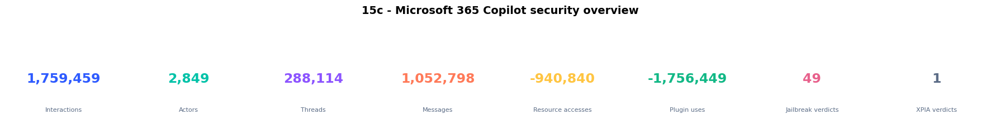

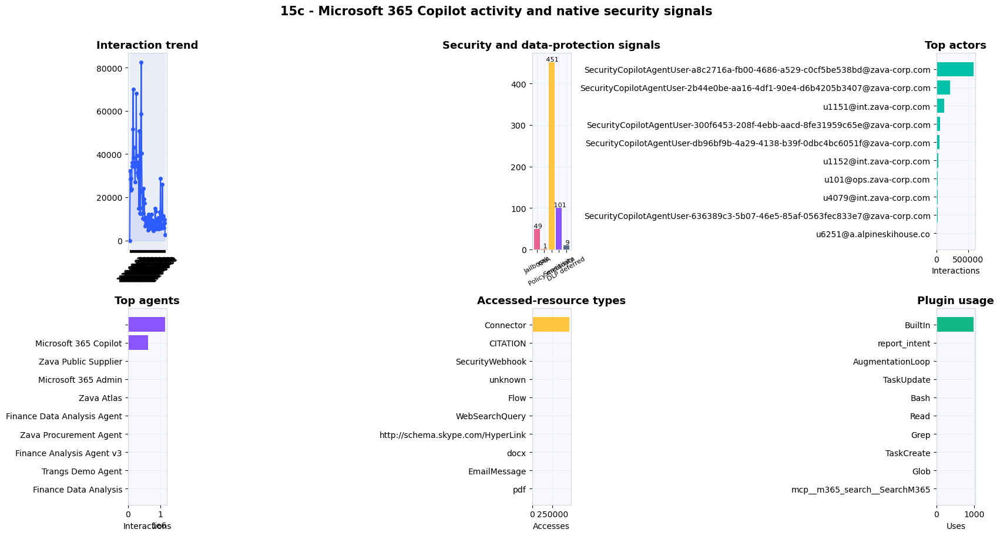

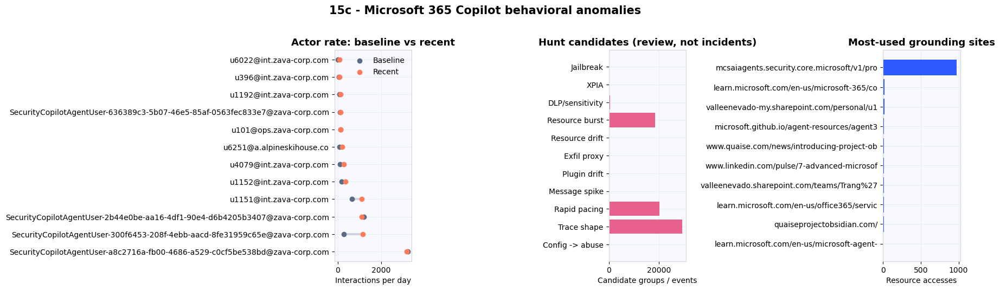

In [31]:
# Section 15c - Microsoft 365 Copilot security and behavior dashboards.
import pandas as pd
import matplotlib.pyplot as plt

PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]

if m365_interactions is None:
    print("15c: no CopilotActivity data. Run sections 8 and 15a first.")
else:
    overview = m365_interactions.agg(
        F.count("*").alias("Interactions"), F.countDistinct("Actor").alias("Actors"),
        F.countDistinct("Agent").alias("Agents"), F.countDistinct("ThreadId").alias("Threads"),
        F.sum("MessageCount").alias("Messages"), F.sum("ResourceCount").alias("Resources"),
        F.sum("PluginCount").alias("PluginUses"),
        F.sum(F.col("HasPolicyMetadata").cast("int")).alias("PolicyRows"),
        F.sum(F.col("DLPDeferred").cast("int")).alias("DLPDeferredRows")).collect()[0]
    jailbreak_hits = m365_messages.filter(F.col("JailbreakDetected")).count()
    xpia_hits = m365_resources.filter(F.col("XPIADetected")).count()

    kpis = [
        ("Interactions", overview["Interactions"] or 0), ("Actors", overview["Actors"] or 0),
        ("Threads", overview["Threads"] or 0), ("Messages", overview["Messages"] or 0),
        ("Resource accesses", overview["Resources"] or 0), ("Plugin uses", overview["PluginUses"] or 0),
        ("Jailbreak verdicts", jailbreak_hits), ("XPIA verdicts", xpia_hits),
    ]
    fig, axes = plt.subplots(1, len(kpis), figsize=(18, 1.9))
    for axis, (label, value), color in zip(axes, kpis, PALETTE):
        axis.axis("off")
        axis.text(0.5, 0.62, f"{value:,}", ha="center", va="center", fontsize=17,
                  fontweight="bold", color=color)
        axis.text(0.5, 0.18, label, ha="center", va="center", fontsize=8, color="#5A6B85", wrap=True)
    fig.suptitle("15c - Microsoft 365 Copilot security overview", y=1.18, fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    daily_pd = (m365_interactions.groupBy("EventDate").count()
                .withColumnRenamed("count", "Interactions").orderBy("EventDate").toPandas())
    actors_pd = (m365_interactions.groupBy("Actor").agg(F.count("*").alias("Interactions"),
                 F.countDistinct("ThreadId").alias("Threads"))
                 .orderBy(F.desc("Interactions")).limit(10).toPandas())
    agents_pd = (m365_interactions.groupBy("Agent").agg(F.count("*").alias("Interactions"),
                 F.countDistinct("Actor").alias("Actors"))
                 .orderBy(F.desc("Interactions")).limit(10).toPandas())
    resource_types_pd = (m365_resources.groupBy(F.coalesce("ResourceType", F.lit("unknown")).alias("ResourceType"))
                         .count().orderBy(F.desc("count")).limit(10).toPandas())
    plugins_pd = (m365_plugins.groupBy("PluginKey").count().orderBy(F.desc("count")).limit(10).toPandas())
    signal_pd = pd.DataFrame({
        "Signal": ["Jailbreak", "XPIA", "Policy metadata", "Sensitivity", "DLP deferred"],
        "Count": [jailbreak_hits, xpia_hits, overview["PolicyRows"] or 0,
                  m365_interactions.filter(F.col("HasSensitivity")).count(), overview["DLPDeferredRows"] or 0],
    })

    fig, axes = plt.subplots(2, 3, figsize=(17, 9))
    fig.suptitle("15c - Microsoft 365 Copilot activity and native security signals",
                 fontsize=15, fontweight="bold", y=1.01)
    if not daily_pd.empty:
        axes[0, 0].plot(daily_pd["EventDate"].astype(str), daily_pd["Interactions"],
                        marker="o", ms=4, color=PALETTE[0])
        axes[0, 0].fill_between(range(len(daily_pd)), daily_pd["Interactions"], alpha=0.1, color=PALETTE[0])
    axes[0, 0].set_title("Interaction trend")
    axes[0, 0].tick_params(axis="x", rotation=45, labelsize=7)

    axes[0, 1].bar(signal_pd["Signal"], signal_pd["Count"], color=[PALETTE[6], PALETTE[3], PALETTE[4], PALETTE[2], PALETTE[7]])
    axes[0, 1].set_title("Security and data-protection signals")
    axes[0, 1].tick_params(axis="x", rotation=30, labelsize=8)
    for position, value in enumerate(signal_pd["Count"]):
        axes[0, 1].text(position, value, f" {value:,}", ha="center", va="bottom", fontsize=8)

    if not actors_pd.empty:
        axes[0, 2].barh(actors_pd["Actor"][::-1].astype(str), actors_pd["Interactions"][::-1], color=PALETTE[1])
    axes[0, 2].set_title("Top actors")
    axes[0, 2].set_xlabel("Interactions")

    if not agents_pd.empty:
        axes[1, 0].barh(agents_pd["Agent"][::-1].astype(str), agents_pd["Interactions"][::-1], color=PALETTE[2])
    axes[1, 0].set_title("Top agents")
    axes[1, 0].set_xlabel("Interactions")

    if not resource_types_pd.empty:
        axes[1, 1].barh(resource_types_pd["ResourceType"][::-1].astype(str), resource_types_pd["count"][::-1], color=PALETTE[4])
    else:
        axes[1, 1].text(0.5, 0.5, "No accessed resources", ha="center", va="center", transform=axes[1, 1].transAxes)
    axes[1, 1].set_title("Accessed-resource types")
    axes[1, 1].set_xlabel("Accesses")

    if not plugins_pd.empty:
        axes[1, 2].barh(plugins_pd["PluginKey"][::-1].astype(str), plugins_pd["count"][::-1], color=PALETTE[5])
    else:
        axes[1, 2].text(0.5, 0.5, "No plugin use", ha="center", va="center", transform=axes[1, 2].transAxes)
    axes[1, 2].set_title("Plugin usage")
    axes[1, 2].set_xlabel("Uses")
    plt.tight_layout()
    plt.show()

    rate_cut15 = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)
    rate_base_days15 = max(1.0, LOOKBACK_DAYS - RECENT_HOURS / 24.0)
    rate_recent_days15 = max(1.0 / 24.0, RECENT_HOURS / 24.0)
    actor_base = (m365_interactions.filter(F.col("EventTime") < F.lit(rate_cut15)).groupBy("Actor")
                  .agg(F.count("*").alias("BaseEvents"))
                  .withColumn("BasePerDay", F.col("BaseEvents") / F.lit(rate_base_days15)))
    actor_recent = (m365_interactions.filter(F.col("EventTime") >= F.lit(rate_cut15)).groupBy("Actor")
                    .agg(F.count("*").alias("RecentEvents"))
                    .withColumn("RecentPerDay", F.col("RecentEvents") / F.lit(rate_recent_days15)))
    actor_rates_pd = (actor_recent.join(actor_base, "Actor", "left").fillna({"BasePerDay": 0.0})
                      .orderBy(F.desc("RecentPerDay")).limit(12).toPandas())

    hunt_frames = [
        ("Jailbreak", globals().get("m365_jailbreak")), ("XPIA", globals().get("m365_xpia")),
        ("DLP/sensitivity", globals().get("m365_sensitive")), ("Resource burst", globals().get("m365_resource_burst")),
        ("Resource drift", globals().get("m365_resource_drift")), ("Exfil proxy", globals().get("m365_exfil_proxy")),
        ("Plugin drift", globals().get("m365_plugin_drift")), ("Message spike", globals().get("m365_message_spikes")),
        ("Rapid pacing", globals().get("m365_pacing")), ("Trace shape", globals().get("m365_trace_anomalies")),
        ("Config -> abuse", globals().get("m365_config_abuse")),
    ]
    hunt_counts = [(name, frame.count() if frame is not None else 0) for name, frame in hunt_frames]
    hunt_pd = pd.DataFrame(hunt_counts, columns=["Hunt", "Candidates"])

    site_pd = (m365_resources.filter(F.col("SiteUrl").isNotNull()).groupBy("SiteUrl").count()
               .orderBy(F.desc("count")).limit(10).toPandas())
    fig, axes = plt.subplots(1, 3, figsize=(18, 5.2))
    fig.suptitle("15c - Microsoft 365 Copilot behavioral anomalies", fontsize=15, fontweight="bold", y=1.02)
    if not actor_rates_pd.empty:
        positions = list(range(len(actor_rates_pd)))
        for pos, base_value, recent_value in zip(positions, actor_rates_pd["BasePerDay"], actor_rates_pd["RecentPerDay"]):
            axes[0].plot([base_value, recent_value], [pos, pos], color="#D0D7E2", linewidth=3)
        axes[0].scatter(actor_rates_pd["BasePerDay"], positions, color=PALETTE[7], label="Baseline", zorder=3)
        axes[0].scatter(actor_rates_pd["RecentPerDay"], positions, color=PALETTE[3], label="Recent", zorder=3)
        axes[0].set_yticks(positions)
        axes[0].set_yticklabels(actor_rates_pd["Actor"].astype(str))
        axes[0].legend(frameon=False)
    else:
        axes[0].text(0.5, 0.5, "No recent actor activity", ha="center", va="center", transform=axes[0].transAxes)
    axes[0].set_title("Actor rate: baseline vs recent")
    axes[0].set_xlabel("Interactions per day")

    axes[1].barh(hunt_pd["Hunt"][::-1], hunt_pd["Candidates"][::-1], color=PALETTE[6])
    axes[1].set_title("Hunt candidates (review, not incidents)")
    axes[1].set_xlabel("Candidate groups / events")

    if not site_pd.empty:
        display_sites = site_pd["SiteUrl"].astype(str).str.replace(r"^https?://", "", regex=True).str.slice(0, 42)
        axes[2].barh(display_sites[::-1], site_pd["count"][::-1], color=PALETTE[0])
    else:
        axes[2].text(0.5, 0.5, "No site metadata", ha="center", va="center", transform=axes[2].transAxes)
    axes[2].set_title("Most-used grounding sites")
    axes[2].set_xlabel("Resource accesses")
    plt.tight_layout()
    plt.show()

## 16. Closing identity, audit, alert, and data-access gaps (Sentinel workspace tables)

Many rows in the gap assessment are marked **Gap** only because `UnifiedAgentObservability` alone cannot see identity risk, directory changes, security alerts, or data access. Those signals **already exist in this Sentinel workspace** and are joined here on the agent actor (`ActorUsername` / `ActorUserId`) and the agent service-principal identity (name / app id / blueprint), closing the gaps without any new connector.

| Sub-section | Workspace tables (verified present) | Gap rows now covered |
| --- | --- | --- |
| 16a - loader & keys | all below | multi-source correlation plane; validated analytics-tier reads |
| 16b - identity compromise & impersonation | `SigninLogs`, `AADRiskyUsers`, `IdentityInfo`, `AADServicePrincipalSignInLogs` | Scenario 2 identity-compromise chain; session/token impersonation; off-hours/geo; identity abuse (disabled-but-active, risky sign-in) |
| 16c - privilege escalation & consent | `AuditLogs` | Scenario 3 privilege escalation; consent anomaly; permission/credential change; Entra audit-change to behavior; Agent 365 `ConfirmAgentCompromised` / sponsor changes |
| 16d - alerts, incidents & MITRE | `SecurityAlert`, `SecurityIncident` | alert/incident linkage; Detection to Incident lineage; Defender/Sentinel alert to agent trace; MITRE ATT&CK tags from matched alerts |
| 16e - data access | `CloudAppEvents` | data-source dimension; sensitive/new/high-volume data access; user to agent to data chain |

> Correlation caveat: agent actors are matched to workspace identities by lower-cased UPN and object id; when the agent runs under a non-human identity the human panels degrade to a status message while the service-principal, audit, and alert panels still populate. Every result is a **correlation candidate** for analyst validation, never a verdict. No prompt/response or document content is displayed. Requires `WORKSPACE_NAME` set (section 1) and read access to these Analytics-tier tables.

In [32]:
# Section 16a - load Sentinel workspace identity/audit/alert/data-access tables and build correlation keys.
import matplotlib.pyplot as plt
PALETTE = globals().get("PALETTE") or ["#2E5BFF", "#00C2A8", "#8C54FF", "#FF7A59", "#FFC542", "#12B886", "#E8618C", "#5A6B85"]
recent_cut16 = datetime.now(timezone.utc) - timedelta(hours=RECENT_HOURS)


def lc(column):
    """Lower-cased, trimmed string key for cross-table identity joins."""
    return F.lower(F.trim(column.cast("string")))


agent_actors = (events
    .withColumn("ActorUpn", lc(F.col("ActorUsername")))
    .withColumn("ActorOid", lc(F.col("ActorUserId")))
    .filter((F.col("ActorUpn").isNotNull() & (F.col("ActorUpn") != "")) |
            (F.col("ActorOid").isNotNull() & (F.col("ActorOid") != "")))
    .groupBy("ActorUpn", "ActorOid")
    .agg(F.count("*").alias("AgentRuns"),
         F.countDistinct("AgentId").alias("AgentsUsed"),
         F.max("EventTime").alias("LastRun"),
         F.concat_ws(", ", F.array_distinct(F.collect_list("AgentName"))).alias("AgentNames")))

agent_sp = (events
    .select(lc(F.col("AgentId")).alias("AgentIdKey"),
            lc(F.col("AgentName")).alias("AgentNameKey"),
            lc(F.col("SrcAgentBlueprintId")).alias("BlueprintKey"))
    .where("AgentIdKey is not null or AgentNameKey is not null").distinct())
if "identities" in dir() and identities is not None:
    agent_sp = agent_sp.unionByName(identities.select(
        lc(F.col("InventoryAgentId")).alias("AgentIdKey"),
        lc(F.col("InventoryAgentName")).alias("AgentNameKey"),
        lc(F.col("InventoryBlueprintId")).alias("BlueprintKey"))).distinct()

sec_signin = read_workspace_table("SigninLogs")
sec_sp_signin = read_workspace_table("AADServicePrincipalSignInLogs")
sec_mi_signin = read_workspace_table("AADManagedIdentitySignInLogs")
sec_risky = read_workspace_table("AADRiskyUsers")
sec_audit = read_workspace_table("AuditLogs")
sec_idinfo = read_workspace_table("IdentityInfo")
sec_alert = read_workspace_table("SecurityAlert")
sec_incident = read_workspace_table("SecurityIncident")
sec_cae = read_workspace_table("CloudAppEvents")

availability = [("SigninLogs", sec_signin), ("AADServicePrincipalSignInLogs", sec_sp_signin),
                ("AADManagedIdentitySignInLogs", sec_mi_signin), ("AADRiskyUsers", sec_risky),
                ("AuditLogs", sec_audit), ("IdentityInfo", sec_idinfo), ("SecurityAlert", sec_alert),
                ("SecurityIncident", sec_incident), ("CloudAppEvents", sec_cae)]
print("Section 16 workspace-table availability:")
for name, frame in availability:
    print(f"  {name}: {'available' if frame is not None else 'absent'}")
if not WORKSPACE_NAME:
    print("WORKSPACE_NAME is blank; section 16 tables cannot load. Set it in the controls cell.")
else:
    print(f"Distinct agent actors: {agent_actors.count():,} | distinct agent identities: {agent_sp.count():,}")


def card_row(cards, title):
    """Compact KPI card row used by the section 16 boards."""
    ncols = len(cards)
    fig, axes = plt.subplots(1, ncols, figsize=(2.5 * ncols, 1.7))
    axes = axes if ncols > 1 else [axes]
    for ax, (label, value), color in zip(axes, cards, PALETTE * 3):
        ax.axis("off")
        ax.add_patch(plt.Rectangle((0.04, 0.12), 0.92, 0.76, transform=ax.transAxes,
                                   facecolor="#F7F9FC", edgecolor=color, linewidth=1.5))
        ax.text(0.5, 0.6, value, ha="center", va="center", fontsize=15, fontweight="bold", color="#1A2B4A")
        ax.text(0.5, 0.27, label, ha="center", va="center", fontsize=8.5, color="#5A6B85")
    fig.suptitle(title, y=1.06, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

StatementMeta(MSGMedium, 595, 9, Finished, Available, Finished, False)

NameError: name 'datetime' is not defined

StatementMeta(MSGMedium, 596, 33, Finished, Available, Finished, False)

{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: SigninLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table SigninLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: AADServicePrincipalSignInLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table AADServicePrincipalSignInLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: AADManagedIdentitySignInLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table AADManagedIdentitySignInLogs"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Loading table: AADRiskyUsers"}
{"Level": "INFO", "TraceId": "ad82fadf-b219-43ba-a899-1e0e26c93e81", "Message": "Successfully loaded table AADRiskyUsers"}
{"Le

In [ ]:
# Section 16b - identity compromise chain, impersonation, geo spread, disabled-but-active, agent SP credential use.
# Covers: Scenario 2 identity-compromise, session/token impersonation, off-hours/geo, identity abuse (disabled-but-active).
if sec_signin is None and sec_risky is None and sec_sp_signin is None and sec_idinfo is None:
    print("16b: no identity tables available. Set WORKSPACE_NAME and confirm SigninLogs/AADRiskyUsers access.")
else:
    actor_upns = agent_actors.select("ActorUpn").where("ActorUpn is not null and ActorUpn != ''").distinct()

    risky_signins = geo_spread = None
    if sec_signin is not None:
        signin_norm = (sec_signin
            .withColumn("Upn", lc(F.col("UserPrincipalName")))
            .withColumn("RiskLevel", F.lower(F.coalesce(
                first_existing(sec_signin, ["RiskLevelDuringSignIn"]),
                first_existing(sec_signin, ["RiskLevelAggregated"]), F.lit("none"))))
            .withColumn("ResultCode", F.coalesce(first_existing(sec_signin, ["ResultType"]), F.lit("")))
            .withColumn("Country", F.get_json_object(F.col("Location").cast("string"), "$.countryOrRegion")))
        risky_signins = (signin_norm.join(actor_upns, signin_norm.Upn == actor_upns.ActorUpn, "inner")
            .withColumn("IsSuspicious", F.col("RiskLevel").isin("high", "medium") | (~F.col("ResultCode").isin("0", "")))
            .filter(F.col("IsSuspicious"))
            .groupBy("Upn")
            .agg(F.count("*").alias("Events"), F.max("RiskLevel").alias("MaxRisk"),
                 F.countDistinct("IPAddress").alias("IPs"), F.countDistinct("Country").alias("Countries"),
                 F.max("TimeGenerated").alias("LastSeen"))
            .orderBy(F.desc("Events")))
        print("Risky or failed sign-ins for identities that initiated agent runs")
        show_limited(risky_signins, 30)

        geo_spread = (signin_norm.join(actor_upns, signin_norm.Upn == actor_upns.ActorUpn, "inner")
            .filter(F.col("Country").isNotNull())
            .groupBy("Upn", F.to_date("TimeGenerated").alias("Day"))
            .agg(F.countDistinct("Country").alias("Countries"),
                 F.concat_ws(", ", F.array_distinct(F.collect_list("Country"))).alias("CountryList"))
            .filter(F.col("Countries") >= 2).orderBy(F.desc("Countries")))
        print("Impossible-travel proxy: agent actors signing in from 2+ countries in one day")
        show_limited(geo_spread, 30)

    risky_users = None
    if sec_risky is not None:
        risky_users = (sec_risky.withColumn("Upn", lc(F.col("UserPrincipalName")))
            .join(actor_upns, F.col("Upn") == actor_upns.ActorUpn, "inner")
            .select("Upn", first_existing(sec_risky, ["RiskLevel"]).alias("RiskLevel"),
                    first_existing(sec_risky, ["RiskState"]).alias("RiskState"),
                    first_existing(sec_risky, ["RiskDetail"]).alias("RiskDetail"),
                    first_existing(sec_risky, ["RiskLastUpdatedDateTime"]).alias("RiskUpdated"))
            .orderBy(F.desc("RiskUpdated")))
        print("Entra ID Protection risky users that initiated agent runs")
        show_limited(risky_users, 30)

    disabled_active = None
    if sec_idinfo is not None:
        idinfo_norm = (sec_idinfo.withColumn("Upn", lc(F.col("AccountUPN")))
            .withColumn("Enabled", F.lower(first_existing(sec_idinfo, ["IsAccountEnabled"], "true"))))
        disabled_active = (agent_actors.join(idinfo_norm, agent_actors.ActorUpn == idinfo_norm.Upn, "inner")
            .filter(F.col("Enabled").isin("false", "0"))
            .select("ActorUpn", "AgentRuns", "AgentsUsed", "LastRun").orderBy(F.desc("AgentRuns")))
        print("Disabled-but-active: directory-disabled identities still initiating agent runs")
        show_limited(disabled_active, 30)

    sp_credentials = None
    if sec_sp_signin is not None:
        sp_norm = (sec_sp_signin
            .withColumn("SpName", lc(F.col("ServicePrincipalName")))
            .withColumn("AppKey", lc(F.col("AppId")))
            .withColumn("ResultCode", F.coalesce(first_existing(sec_sp_signin, ["ResultType"]), F.lit("")))
            .withColumn("CredKey", first_existing(sec_sp_signin, ["ServicePrincipalCredentialKeyId"])))
        sp_join = sp_norm.join(agent_sp,
            (sp_norm.SpName == agent_sp.AgentNameKey) | (sp_norm.AppKey == agent_sp.BlueprintKey), "inner")
        sp_credentials = (sp_join.groupBy("SpName")
            .agg(F.count("*").alias("SignIns"),
                 F.sum(F.when(~F.col("ResultCode").isin("0", ""), 1).otherwise(0)).alias("Failures"),
                 F.countDistinct("CredKey").alias("CredentialKeys"), F.max("TimeGenerated").alias("LastSeen"))
            .orderBy(F.desc("Failures"), F.desc("SignIns")))
        print("Agent service-principal sign-in health (failures and distinct credential keys)")
        show_limited(sp_credentials, 30)

    def _c(df):
        return df.count() if df is not None else 0
    card_row([("Risky sign-in actors", f"{_c(risky_signins):,}"), ("Geo-spread actors", f"{_c(geo_spread):,}"),
              ("Risky users", f"{_c(risky_users):,}"), ("Disabled-but-active", f"{_c(disabled_active):,}"),
              ("Agent SP identities", f"{_c(sp_credentials):,}")],
             "16b - Identity compromise & impersonation candidates")

    if risky_signins is not None and risky_signins.limit(1).count() > 0:
        rp = risky_signins.limit(12).toPandas()
        fig, ax = plt.subplots(figsize=(11, max(3, 0.4 * len(rp))))
        ax.barh(rp["Upn"][::-1].astype(str), rp["Events"][::-1], color=PALETTE[6])
        ax.set_title("Risky / failed sign-in events by agent actor")
        ax.set_xlabel("Sign-in events")
        plt.tight_layout()
        plt.show()
    else:
        print("16b chart: no risky/failed sign-ins matched agent actors in the window.")

StatementMeta(MSGMedium, 596, 34, Finished, Available, Finished, False)

Risky or failed sign-ins for identities that initiated agent runs
+----------------------------+------+-------+---+---------+--------------------------+
|Upn                         |Events|MaxRisk|IPs|Countries|LastSeen                  |
+----------------------------+------+-------+---+---------+--------------------------+
|u24953@int.zava-corp.com    |1609  |none   |7  |0        |2026-08-31 15:29:51.72604 |
|u101@ops.zava-corp.com      |1127  |none   |13 |0        |2026-08-31 14:42:09.152762|
|u2736@int.zava-corp.com     |540   |none   |5  |0        |2026-08-31 12:47:41.696768|
|u1067@int.zava-corp.com     |511   |none   |1  |0        |2026-08-31 18:22:27.609   |
|u663@int.zava-corp.com      |477   |none   |5  |0        |2026-08-31 03:51:03.647045|
|u1084@int.zava-corp.com     |430   |none   |11 |0        |2026-09-01 00:30:49.047222|
|u12247@int.zava-corp.com    |405   |none   |3  |0        |2026-08-28 03:50:23.292209|
|u3547@int.zava-corp.com     |336   |none   |7  |0        |2026-

Py4JJavaError: An error occurred while calling o9469.showString.
: org.apache.spark.SparkException: Job aborted due to stage failure: Task 9 in stage 1067.0 failed 4 times, most recent failure: Lost task 9.3 in stage 1067.0 (TID 66253) (vm-1c406932 executor 3): Failed to acquire a SAS token for get-status on /dir1/dir2/20260818/04/2026-08-18T02-49-ddc9d248-b34b-4093-abec-b995d9d81b20-zstd.parquet due to java.lang.UnsupportedOperationException: SASToken received is empty or null
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.appendSASTokenToQuery(AbfsClient.java:1131)
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.appendSASTokenToQuery(AbfsClient.java:1097)
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.getPathStatus(AbfsClient.java:770)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystemStore.getFileStatus(AzureBlobFileSystemStore.java:1067)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystem.getFileStatus(AzureBlobFileSystem.java:650)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystem.getFileStatus(AzureBlobFileSystem.java:640)
	at org.apache.parquet.hadoop.util.HadoopInputFile.fromPath(HadoopInputFile.java:39)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFooterReader.readFooter(ParquetFooterReader.java:71)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFooterReader.readFooter(ParquetFooterReader.java:66)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFileFormat.$anonfun$buildReaderWithPartitionValues$2(ParquetFileFormat.scala:263)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.org$apache$spark$sql$execution$datasources$FileScanRDD$$anon$$readCurrentFile(FileScanRDD.scala:263)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.nextIterator(FileScanRDD.scala:328)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.hasNext(FileScanRDD.scala:173)
	at org.apache.spark.sql.execution.FileSourceScanExec$$anon$1.hasNext(DataSourceScanExec.scala:631)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.columnartorow_nextBatch_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenEvaluatorFactory$WholeStageCodegenPartitionEvaluator$$anon$1.hasNext(WholeStageCodegenEvaluatorFactory.scala:43)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$getByteArrayRdd$1(SparkPlan.scala:413)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2(RDD.scala:900)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2$adapted(RDD.scala:900)
	at org.apache.spark.rdd.MapPartitionsRDD.compute(MapPartitionsRDD.scala:57)
	at org.apache.spark.rdd.RDD.computeOrReadCheckpoint(RDD.scala:368)
	at org.apache.spark.rdd.RDD.iterator(RDD.scala:332)
	at org.apache.spark.scheduler.ResultTask.runTask(ResultTask.scala:93)
	at org.apache.spark.TaskContext.runTaskWithListeners(TaskContext.scala:166)
	at org.apache.spark.scheduler.Task.run(Task.scala:141)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$4(Executor.scala:636)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally(SparkErrorUtils.scala:64)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally$(SparkErrorUtils.scala:61)
	at org.apache.spark.util.Utils$.tryWithSafeFinally(Utils.scala:94)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:639)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1136)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:635)
	at java.base/java.lang.Thread.run(Thread.java:840)

Driver stacktrace:
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:3086)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2(DAGScheduler.scala:3022)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2$adapted(DAGScheduler.scala:3021)
	at scala.collection.mutable.ResizableArray.foreach(ResizableArray.scala:62)
	at scala.collection.mutable.ResizableArray.foreach$(ResizableArray.scala:55)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.abortStage(DAGScheduler.scala:3021)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1(DAGScheduler.scala:1302)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1$adapted(DAGScheduler.scala:1302)
	at scala.Option.foreach(Option.scala:407)
	at org.apache.spark.scheduler.DAGScheduler.handleTaskSetFailed(DAGScheduler.scala:1302)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:3293)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:3224)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:3213)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:1036)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2578)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2599)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2618)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2643)
	at org.apache.spark.rdd.RDD.$anonfun$collect$1(RDD.scala:1056)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:112)
	at org.apache.spark.rdd.RDD.withScope(RDD.scala:411)
	at org.apache.spark.rdd.RDD.collect(RDD.scala:1055)
	at org.apache.spark.sql.execution.SparkPlan.executeCollectIterator(SparkPlan.scala:480)
	at org.apache.spark.sql.execution.exchange.BroadcastExchangeExec.$anonfun$relationFuture$1(BroadcastExchangeExec.scala:142)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withThreadLocalCaptured$2(SQLExecution.scala:243)
	at org.apache.spark.JobArtifactSet$.withActiveJobArtifactState(JobArtifactSet.scala:94)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withThreadLocalCaptured$1(SQLExecution.scala:238)
	at java.base/java.util.concurrent.FutureTask.run(FutureTask.java:264)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1136)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:635)
	at java.base/java.lang.Thread.run(Thread.java:840)
Caused by: Failed to acquire a SAS token for get-status on /dir1/dir2/20260818/04/2026-08-18T02-49-ddc9d248-b34b-4093-abec-b995d9d81b20-zstd.parquet due to java.lang.UnsupportedOperationException: SASToken received is empty or null
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.appendSASTokenToQuery(AbfsClient.java:1131)
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.appendSASTokenToQuery(AbfsClient.java:1097)
	at org.apache.hadoop.fs.azurebfs.services.AbfsClient.getPathStatus(AbfsClient.java:770)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystemStore.getFileStatus(AzureBlobFileSystemStore.java:1067)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystem.getFileStatus(AzureBlobFileSystem.java:650)
	at org.apache.hadoop.fs.azurebfs.AzureBlobFileSystem.getFileStatus(AzureBlobFileSystem.java:640)
	at org.apache.parquet.hadoop.util.HadoopInputFile.fromPath(HadoopInputFile.java:39)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFooterReader.readFooter(ParquetFooterReader.java:71)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFooterReader.readFooter(ParquetFooterReader.java:66)
	at org.apache.spark.sql.execution.datasources.parquet.ParquetFileFormat.$anonfun$buildReaderWithPartitionValues$2(ParquetFileFormat.scala:263)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.org$apache$spark$sql$execution$datasources$FileScanRDD$$anon$$readCurrentFile(FileScanRDD.scala:263)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.nextIterator(FileScanRDD.scala:328)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.hasNext(FileScanRDD.scala:173)
	at org.apache.spark.sql.execution.FileSourceScanExec$$anon$1.hasNext(DataSourceScanExec.scala:631)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.columnartorow_nextBatch_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenEvaluatorFactory$WholeStageCodegenPartitionEvaluator$$anon$1.hasNext(WholeStageCodegenEvaluatorFactory.scala:43)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$getByteArrayRdd$1(SparkPlan.scala:413)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2(RDD.scala:900)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2$adapted(RDD.scala:900)
	at org.apache.spark.rdd.MapPartitionsRDD.compute(MapPartitionsRDD.scala:57)
	at org.apache.spark.rdd.RDD.computeOrReadCheckpoint(RDD.scala:368)
	at org.apache.spark.rdd.RDD.iterator(RDD.scala:332)
	at org.apache.spark.scheduler.ResultTask.runTask(ResultTask.scala:93)
	at org.apache.spark.TaskContext.runTaskWithListeners(TaskContext.scala:166)
	at org.apache.spark.scheduler.Task.run(Task.scala:141)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$4(Executor.scala:636)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally(SparkErrorUtils.scala:64)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally$(SparkErrorUtils.scala:61)
	at org.apache.spark.util.Utils$.tryWithSafeFinally(Utils.scala:94)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:639)
	... 3 more


In [ ]:
# Section 16c - privilege escalation, consent, credential & sponsor changes, Agent 365 compromise verdicts (AuditLogs).
# Covers: Scenario 3 privilege escalation; consent anomaly; permission/credential change; Entra audit-change to behavior.
SENSITIVE_OPS = (r"(?i)(consent to application|delegated permission grant|app role assignment|"
                 r"add member to (role|group)|add owner to|certificates and secrets management|"
                 r"add service principal|update service principal|remove service principal|"
                 r"confirmagentcompromised|add user sponsor|update conditional access|password|credential)")

if sec_audit is None:
    print("16c: AuditLogs is unavailable. Set WORKSPACE_NAME and confirm Entra audit ingestion.")
else:
    audit_norm = (sec_audit
        .withColumn("Operation", first_existing(sec_audit, ["OperationName"]))
        .withColumn("Category", first_existing(sec_audit, ["Category"]))
        .withColumn("Result", first_existing(sec_audit, ["Result"]))
        .withColumn("InitiatedByUpn", lc(F.get_json_object(F.col("InitiatedBy").cast("string"), "$.user.userPrincipalName")))
        .withColumn("InitiatedByApp", F.get_json_object(F.col("InitiatedBy").cast("string"), "$.app.displayName"))
        .withColumn("TargetName", lc(F.get_json_object(F.col("TargetResources").cast("string"), "$[0].displayName")))
        .withColumn("TargetId", lc(F.get_json_object(F.col("TargetResources").cast("string"), "$[0].id")))
        .withColumn("TargetType", F.get_json_object(F.col("TargetResources").cast("string"), "$[0].type"))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))

    sensitive_audit = audit_norm.filter(F.col("Operation").rlike(SENSITIVE_OPS))
    agent_name_keys = agent_sp.select("AgentNameKey").where("AgentNameKey is not null").distinct()
    agent_id_keys = agent_sp.select("AgentIdKey").where("AgentIdKey is not null").distinct()
    agent_targeted = (sensitive_audit
        .join(agent_name_keys, sensitive_audit.TargetName == agent_name_keys.AgentNameKey, "left")
        .join(agent_id_keys, sensitive_audit.TargetId == agent_id_keys.AgentIdKey, "left")
        .withColumn("AgentScoped", F.col("AgentNameKey").isNotNull() | F.col("AgentIdKey").isNotNull()))

    print("Sensitive directory changes by operation (AgentScoped marks changes that target an agent identity)")
    show_limited(agent_targeted.groupBy("Operation", "Category")
        .agg(F.count("*").alias("Events"), F.sum(F.col("AgentScoped").cast("int")).alias("AgentScoped"),
             F.max("EventTime").alias("LastSeen")).orderBy(F.desc("Events")), 40)

    print("Agent 365 native identity-protection and sponsor operations")
    show_limited(audit_norm.filter(F.col("Operation").rlike(r"(?i)(confirmagentcompromised|agent|sponsor)"))
        .select("EventTime", "Operation", "Category", "InitiatedByUpn", "InitiatedByApp", "TargetName", "Result")
        .orderBy(F.desc("EventTime")), 30)

    print("Consent / permission-grant / credential-change evidence (metadata only)")
    show_limited(sensitive_audit.filter(F.col("Operation").rlike(
        r"(?i)(consent|permission grant|app role|certificates and secrets|credential|password)"))
        .select("EventTime", "Operation", "InitiatedByUpn", "InitiatedByApp", "TargetName", "TargetType", "Result")
        .orderBy(F.desc("EventTime")), 40)

    op_pd = (sensitive_audit.groupBy("Operation").agg(F.count("*").alias("Events"))
        .orderBy(F.desc("Events")).limit(15).toPandas())
    if not op_pd.empty:
        fig, ax = plt.subplots(figsize=(12, max(3, 0.4 * len(op_pd))))
        ax.barh(op_pd["Operation"][::-1].astype(str), op_pd["Events"][::-1], color=PALETTE[3])
        ax.set_title("16c - Sensitive directory changes by operation")
        ax.set_xlabel("Events")
        plt.tight_layout()
        plt.show()
    else:
        print("16c chart: no sensitive AuditLogs operations in the window.")

In [ ]:
# Section 16d - Defender/Sentinel alert & incident correlation and MITRE ATT&CK tags.
# Covers: alert/incident linkage; Detection to Incident lineage; alert to agent trace; MITRE mapping (from matched alerts).
AGENT_ALERT_PAT = r"(?i)(agent|copilot|prompt|jailbreak|foundry|\bai\b|llm|model|mcp)"

if sec_alert is None and sec_incident is None:
    print("16d: SecurityAlert/SecurityIncident unavailable. Set WORKSPACE_NAME and confirm alert ingestion.")
else:
    matched_alerts = None
    if sec_alert is not None:
        alert_norm = (sec_alert
            .withColumn("AlertName", first_existing(sec_alert, ["AlertName"]))
            .withColumn("Severity", first_existing(sec_alert, ["AlertSeverity"]))
            .withColumn("Provider", first_existing(sec_alert, ["ProviderName", "ProductName"]))
            .withColumn("Compromised", lc(F.col("CompromisedEntity")))
            .withColumn("EntitiesText", F.lower(F.col("Entities").cast("string")))
            .withColumn("Tactics", first_existing(sec_alert, ["Tactics"]))
            .withColumn("Techniques", first_existing(sec_alert, ["Techniques"]))
            .withColumn("StartTimeTs", F.to_timestamp("StartTime")))
        actor_terms = [r["ActorUpn"] for r in
                       agent_actors.select("ActorUpn").where("ActorUpn is not null and ActorUpn != ''").limit(200).collect()]
        agent_terms = [r["AgentNameKey"] for r in
                       agent_sp.select("AgentNameKey").where("AgentNameKey is not null").limit(200).collect()]
        entity_terms = [t for t in (actor_terms + agent_terms) if t and len(t) > 3]
        entity_match = F.lit(False)
        for term in entity_terms[:200]:
            entity_match = entity_match | F.col("EntitiesText").contains(term) | (F.col("Compromised") == term)
        matched_alerts = alert_norm.filter(entity_match | F.col("AlertName").rlike(AGENT_ALERT_PAT))
        print("Alerts correlated to agent actors/identities or matching agent/AI patterns")
        show_limited(matched_alerts.select("StartTimeTs", "AlertName", "Severity", "Provider",
                                           "Tactics", "Techniques", "CompromisedEntity").orderBy(F.desc("StartTimeTs")), 40)

        techniques = (matched_alerts
            .withColumn("Technique", F.explode(F.split(F.coalesce("Techniques", F.lit("")), r"[,\s]+")))
            .filter(F.col("Technique").rlike(r"(?i)^T\d{4}"))
            .groupBy("Technique").agg(F.count("*").alias("Alerts")).orderBy(F.desc("Alerts")))
        print("MITRE ATT&CK techniques from correlated alerts")
        show_limited(techniques, 30)

    if sec_incident is not None:
        inc_norm = (sec_incident
            .withColumn("Title", first_existing(sec_incident, ["Title"]))
            .withColumn("Severity", first_existing(sec_incident, ["Severity"]))
            .withColumn("Status", first_existing(sec_incident, ["Status"]))
            .withColumn("EventTime", F.to_timestamp("TimeGenerated")))
        print("Security incidents referencing agent / AI / Copilot themes")
        show_limited(inc_norm.filter(F.col("Title").rlike(AGENT_ALERT_PAT))
            .select("EventTime", "Title", "Severity", "Status").orderBy(F.desc("EventTime")), 30)

    if sec_alert is not None and matched_alerts is not None and matched_alerts.limit(1).count() > 0:
        tac_pd = (matched_alerts
            .withColumn("Tactic", F.explode(F.split(F.coalesce("Tactics", F.lit("")), r"[,;]+")))
            .filter(F.length(F.trim("Tactic")) > 0)
            .groupBy(F.trim("Tactic").alias("Tactic")).agg(F.count("*").alias("Alerts"))
            .orderBy(F.desc("Alerts")).limit(12).toPandas())
        if not tac_pd.empty:
            fig, ax = plt.subplots(figsize=(11, max(3, 0.4 * len(tac_pd))))
            ax.barh(tac_pd["Tactic"][::-1].astype(str), tac_pd["Alerts"][::-1], color=PALETTE[2])
            ax.set_title("16d - Correlated alerts by MITRE tactic")
            ax.set_xlabel("Alerts")
            plt.tight_layout()
            plt.show()
    else:
        print("16d chart: no correlated alerts in the window.")

In [ ]:
# Section 16e - data access via Defender for Cloud Apps (CloudAppEvents): data-source dimension, sensitive/new access, user->agent->data.
# Covers: data-source dimension; sensitive/new/high-volume data access; user to agent to data chain.
DATA_ACCESS_PAT = r"(?i)(download|access|preview|export|sync|share|filecopied|filedownloaded|filepreviewed|filesynced|searchquery)"

if sec_cae is None:
    print("16e: CloudAppEvents unavailable. Set WORKSPACE_NAME and confirm Defender for Cloud Apps ingestion.")
else:
    cae_norm = (sec_cae
        .withColumn("ActionType", first_existing(sec_cae, ["ActionType"]))
        .withColumn("AccountUpn", lc(F.coalesce(first_existing(sec_cae, ["AccountDisplayName"]), F.lit(""))))
        .withColumn("AccountOid", lc(F.coalesce(first_existing(sec_cae, ["AccountObjectId"]), F.lit(""))))
        .withColumn("App", first_existing(sec_cae, ["Application"]))
        .withColumn("ObjectType", first_existing(sec_cae, ["ObjectType"]))
        .withColumn("ObjectName", first_existing(sec_cae, ["ObjectName"]))
        .withColumn("EventTime", F.to_timestamp("TimeGenerated")))
    data_access = cae_norm.filter(F.col("ActionType").rlike(DATA_ACCESS_PAT))
    actor_keys = agent_actors.select("ActorUpn", "ActorOid").distinct()
    join_cond = (((data_access.AccountUpn == actor_keys.ActorUpn) & (data_access.AccountUpn != "")) |
                 ((data_access.AccountOid == actor_keys.ActorOid) & (data_access.AccountOid != "")))
    actor_data = data_access.join(actor_keys, join_cond, "inner")

    print("Data-access actions by agent actors, per application and object type")
    show_limited(actor_data.groupBy("ActorUpn", "App", "ObjectType")
        .agg(F.count("*").alias("Actions"), F.countDistinct("ActionType").alias("ActionKinds"),
             F.countDistinct("ObjectName").alias("Objects"), F.max("EventTime").alias("LastSeen"))
        .orderBy(F.desc("Actions")), 40)

    print("New data source per agent actor (application first seen in the recent window)")
    new_src = (actor_data.groupBy("ActorUpn", "App")
        .agg(F.min("EventTime").alias("FirstSeen"), F.count("*").alias("Actions"))
        .filter(F.col("FirstSeen") >= F.lit(recent_cut16)).orderBy(F.desc("Actions")))
    show_limited(new_src, 30)

    print("User -> agent -> data chain (actors who both ran agents and accessed data)")
    chain = (agent_actors.join(actor_data.groupBy("ActorUpn")
                .agg(F.count("*").alias("DataActions"), F.countDistinct("App").alias("DataApps"),
                     F.concat_ws(", ", F.array_distinct(F.collect_list("App"))).alias("Apps")), "ActorUpn", "inner")
        .select("ActorUpn", "AgentRuns", "AgentsUsed", "AgentNames", "DataActions", "DataApps", "Apps")
        .orderBy(F.desc("DataActions")))
    show_limited(chain, 30)

    app_pd = (actor_data.groupBy("App").agg(F.count("*").alias("Actions"))
        .orderBy(F.desc("Actions")).limit(12).toPandas())
    if not app_pd.empty:
        fig, ax = plt.subplots(figsize=(11, max(3, 0.4 * len(app_pd))))
        ax.barh(app_pd["App"][::-1].astype(str), app_pd["Actions"][::-1], color=PALETTE[1])
        ax.set_title("16e - Agent-actor data access by application")
        ax.set_xlabel("Data-access actions")
        plt.tight_layout()
        plt.show()
    else:
        print("16e chart: no agent-actor data-access actions matched in the window.")